In [1]:
#Amo evaluation
#FM 28.11.2025
import sys
sys.path.extend(['src', '../src']) 
# Import all ML orchestration functions
from amo.ml_orchestration import (
    ml_exp_with_timing,  # Main experiment function with timing preservation
    extract_timing_structure,
    save_midi_with_exact_timing_structure,
    KerasClassifierWrapper,
    build_lstm_classifier,
    build_transformer_classifier,
    clf_predict,
    defineXy,           # Data preparation function
    split_and_encode    # Train/test split with encoding
)
# Import MIDI processing functions  
from amo.midi2df2midi import midi_to_dataframe, save_midi_from_df
from amo.mappings import fill_quaterna_columns, learn_quaterna_mapping
# Import amo funtion
from amo.ml_orchestration import amo_with_doublings_multiclass

import pandas as pd
import numpy as np
from collections import defaultdict


from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier

import matplotlib.pyplot as plt



/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(
2026-08-28 16:13:25.973674: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1787926406.029219  111101 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been

In [2]:
# amo_with_doublings
# Args:
  #      filein (str): Path to the source MIDI file to learn orchestration style from.
  #      fileout (str): Path to the target MIDI file to be orchestrated.
  #      ytarget (str, optional): The target variable for the model ('track-channel' or 'program').
  #                               Defaults to "track-channel".
  #      model (str, optional): The name of the machine learning model to use for orchestration.
  #     ("XGBoost","RandomForest", "DecisionTree", "NearestNeighbors", "MLP3", "NaiveBayes", "MLP1", "AdaBoost", "LSTMClassifier", "TransformerClassifier")
  #                             Defaults to "XGBoost".

In [3]:
def transpose(note, inverse=False, n_semitones=12):
    # Example: transpose pitch
    if inverse:
        n_semitones = - n_semitones
    new_note = note.copy()
    new_note['pitch'] = note['pitch'] + n_semitones
    return [ new_note ]

In [4]:
transformations = [
    (transpose, {'n_semitones': 12}),
    (transpose, {'n_semitones': 24}),
    (transpose, {'n_semitones': 36}),
    (transpose, {'n_semitones': -12}),
    (transpose, {'n_semitones': -24}),
    (transpose, {'n_semitones': -36}),
    #(split_duration, {'smallest_unit': 0.25}),
]

In [5]:
"""
Prompt by GV
create a python function to read the path of .mid files which contain the string "orch". Files are inside folders like "folder_name1/la_mer_1_orch.mid", "folder_name2/symphony_9_2_orch.mid", etc.
"""
import os

def find_orch_mid_files(root_dir='.'):
    result = []
    for dirpath, _, filenames in os.walk(root_dir):
        for name in filenames:
            if name.lower().endswith('.mid') and 'orch' in name.lower():
                result.append(os.path.join(dirpath, name))
    return result

In [6]:
#get the parent directory
cwd = os.getcwd()
parent = os.path.normpath(os.path.join(cwd, '..', '..'))
path_AMO = parent + '/AutomaticMusicOrchestration'
model_path = path_AMO + '/'
#print(parent)#.../test
#print(path_AMO)

In [7]:
root_dir=model_path + 'LOP_database_06_09_17/hand_picked_Spotify'
#root_dir=parent+'/music/LOP_database_06_09_17/hand_picked_Spotify'
filenames = find_orch_mid_files(root_dir)
len(filenames)

55

In [8]:
model_names = [
        "XGBoost",
        "XGBoost5",
        "XGBoost10",
        "XGBoost20",
        "XGBoost50",
        "RandomForest",
        "RandomForest10",
        "RandomForest13",
        "RandomForest16",
        "RandomForest20",
        "DecisionTree",
        #"LSTMClassifier",      # Added
        "NearestNeighbors",
        #"MLP3",   
        #"TransformerClassifier", # Added
        "NaiveBayes",
        #"MLP1",
        "AdaBoost",
        "Dummy0",
        "Dummy1",
        "DummyUnif",      
    ]


model_names_short = [
    'XGB',
    'XGB5',
    'XGB10',
    'XGB20',
    'XGB50',
    'RF',
    'RF10',
    'RF13',
    'RF16',
    'RF20',
    'DT',
    #'LSTM*',
    'NN',
    #'MLP3*',
    #'TF',
    'NB',
    #'MLP1',
    'AB',
    'D0',
    'D1',
    'DU',
    ]

classifiers = [
    XGBClassifier(),
    XGBClassifier(n_estimators = 5),
    XGBClassifier(n_estimators = 10),
    XGBClassifier(n_estimators = 20),
    XGBClassifier(n_estimators = 50),
    RandomForestClassifier(),
    RandomForestClassifier(max_depth=10),
    RandomForestClassifier(max_depth=13),
    RandomForestClassifier(max_depth=16),
    RandomForestClassifier(max_depth=20),
    DecisionTreeClassifier(),
    #KerasClassifierWrapper(build_lstm_classifier),      # Added LSTM
    KNeighborsClassifier(1),
    #MLPClassifier(hidden_layer_sizes=(128,128,128)),
    #KerasClassifierWrapper(build_transformer_classifier),# Added Transformer
    GaussianNB(),
    #MLPClassifier(),
    AdaBoostClassifier(),
    DummyClassifier(strategy='constant', constant=0),
    DummyClassifier(strategy='constant', constant=1),
    DummyClassifier(strategy='uniform'),
]

In [9]:
# Reduce for testing purposes, remove this cell for the actual experiment
N_files = len(filenames)
N_models = len(classifiers)

filenames = filenames[:N_files]

model_names = model_names[:N_models]
classifiers = classifiers[:N_models]
model_names_short = model_names_short[:N_models]

In [10]:
# Initialize metrics collectors
s = (len(filenames),len(model_names))
ml_metrics = dict()

# Metrics returned by the instrumentation classifier.
base_metrics_names = ["time",
                      "accuracy (train)",
                      "accuracy (test)",
                      "precision (train)",
                      "precision (test)",
                      "recall (train)",
                      "recall (test)",
                      "f1 (train)",
                      "f1 (test)",
                      ] #, "n_events", "n_classes"]

# Metrics returned by each transformation classifier.
transformation_metrics_names = [
    "time",
    "accuracy (train)",
    "accuracy (test)",
    "precision macro (train)",
    "precision macro (test)",
    "recall macro (train)",
    "recall macro (test)",
    "f1 macro (train)",
    "f1 macro (test)",
    "f1 weighted (train)",
    "f1 weighted (test)",
]

ml_metrics_names = base_metrics_names.copy()

for func, kwargs in transformations:
    trans_target_name = f"{func.__name__}_{kwargs}"
    for metric_name in transformation_metrics_names:
        ml_metrics_names.append(
            f"{metric_name} ({trans_target_name})"
        )

for mn in ml_metrics_names:
    ml_metrics[mn] = np.zeros(s)

In [11]:
# Multiclass, with transformations
error_collection = []
for i, filein in enumerate(filenames):    
    for u, (model_name, clf) in enumerate(zip(model_names, classifiers)):
        try: 
            metrics = amo_with_doublings_multiclass(filein,fileout=None,model=model_name, tol=0.2, transformations=transformations, model_path=model_path)
            print(metrics)
            for mn in ml_metrics_names:
                # ml_metrics["accuracy"][i,u] = metrics["accuracy"]
                ml_metrics[mn][i,u] = metrics[mn]
        except Exception as e:
            print("Error")
            error_collection.append(f"Error with {filein} and model {model_name}: {e}")

print("\n????????? ERRORS ??????????")
for error in error_collection:
    print(error)


========= PREPROCESSING =========
[PREPROCESSING] Computing and caching results...
{'transformed': 308, 'direct': 39, 'none': 3973}
Original size: (4320, 15)
Dropping [901, 902, 903, 905, 906, 907, 909, 911, 913, 915, 916, 917, 919, 921, 923, 925, 927, 929, 930, 932, 936, 945, 946, 949, 479, 960, 711, 713, 715, 487, 968, 496, 498, 500, 502, 504, 506, 508, 510, 512, 514, 516, 518, 520, 522, 524, 526, 1375, 1376, 1379, 1193, 1381, 1384, 1385, 2762, 2763, 527, 528, 1284, 1285, 3108, 3109, 992, 741, 2765, 529, 1286, 1287, 3110, 3111, 994, 995, 1200, 2767, 1288, 1289, 3112, 3113, 996, 997, 1202, 2768, 533, 1290, 1291, 3114, 998, 999, 2770, 535, 536, 1292, 1293, 3116, 1000, 1001, 2771, 2772, 537, 1294, 1295, 3118, 1002, 1003, 1339, 2773, 540, 1296, 1297, 3120, 3121, 1005, 753, 2774, 541, 542, 1298, 1299, 3122, 3123, 1006, 1007, 1212, 755, 2775, 543, 1300, 1301, 3124, 3125, 1008, 1009, 1214, 757, 2776, 1302, 1303, 3126, 3127, 1010, 1011, 1216, 759, 2777, 1304, 1305, 3128, 3129, 1012, 1013, 7

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0533
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 1.7974212169647217, 'accuracy (test)': np.float64(0.8499245852187028), 'accuracy (train)': np.float64(0.9130844645550528), 'precision (test)': 0.8763961280714817, 'precision (train)': 0.9348880597014926, 'recall (test)': 0.8616398243045388, 'recall (train)': 0.9223265230995766, 'f1 (test)': 0.8689553340716132, 'f1 (train)': 0.9285648105253405, "time (transpose_{'n_semitones': 12})": 0.11198806762695312, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9986190570132176, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9, "precision 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 0.43015384674072266, 'accuracy (test)': np.float64(0.7669683257918553), 'accuracy (train)': np.float64(0.7528280542986425), 'precision (test)': 0.9099405267629567, 'precision (train)': 0.9050279329608939, 'recall (test)': 0.7840409956076134, 'recall (train)': 0.7752622860298177, 'f1 (test)': 0.8423122296500196, 'f1 (train)': 0.8351343313175374, "time (transpose_{'n_semitones': 12})": 0.021618127822875977, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9968454258675079, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9911225093706846, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9984126984126984, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9955206052160064, "recall macro (test) (transpose_{'n_semitones': 12})": 0.8333333333333333, "recall macro (train) (transpose_{'n_semitones': 12})": 0.7527472527472527, "f1 macro (test) (transpose_{'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0292
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 0.711489200592041, 'accuracy (test)': np.float64(0.8122171945701357), 'accuracy (train)': np.float64(0.8116515837104072), 'precision (test)': 0.9012738853503185, 'precision (train)': 0.9050279329608939, 'recall (test)': 0.828696925329429, 'recall (train)': 0.83489784649365, 'f1 (test)': 0.8634630053394355, 'f1 (train)': 0.8685495452369555, "time (transpose_{'n_semitones': 12})": 0.03668785095214844, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.993095285066088, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9226785167024211, "

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.3259
Score on Test (20%): 0.8544
Precision (micro): 0.8871
Recall (micro): 0.8682
F1-Score (micro): 0.8775
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   1   15]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   1   13]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   1    5]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   1  111]]
--- Class: 16_11 Violine I ---
[[1198   14]
 [  21   93]]
--- Class: 17_12 Violine II ---
[[1200   25]
 [  25   76]]
--- Class: 18_13 Viola ---
[[1210   11]
 [  29   76]]
--- Class: 19_14 Violoncelle ---
[[1217   18]
 [  33   58]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1237    6]
 [   7   76]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1221   21]
 [  20   64]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.5300
Score on Test (20%): 0.8167
Precision (micro): 0.8434
Recall (micro): 0.8243
F1-Score (micro): 0.8338
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   0   16]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   2    4]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   1  111]]
--- Class: 16_11 Violine I ---
[[1192   20]
 [  30   84]]
--- Class: 17_12 Violine II ---
[[1185   40]
 [  32   69]]
--- Class: 18_13 Viola ---
[[1192   29]
 [  28   77]]
--- Class: 19_14 Violoncelle ---
[[1200   35]
 [  32   59]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1237    6]
 [   7   76]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1220   22]
 [  24   60]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1917
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.530030727386475, 'accuracy (test)': np.float64(0.8167420814479638), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8434456928838951, 'precision (train)': 1.0, 'recall (test)': 0.8243045387994143, 'recall (train)': 1.0, 'f1 (test)': 0.8337652721214365, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.3644397258758545, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9226785167024211, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall m

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2063
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.341410398483276, 'accuracy (test)': np.float64(0.8378582202111614), 'accuracy (train)': np.float64(0.9015837104072398), 'precision (test)': 0.8883792048929664, 'precision (train)': 0.937370307489153, 'recall (test)': 0.8506588579795022, 'recall (train)': 0.9145959874838947, 'f1 (test)': 0.8691099476439791, 'f1 (train)': 0.9258431153344513, "time (transpose_{'n_semitones': 12})": 0.3668224811553955, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9964490037482738, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9226785167024211,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1959
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.461100816726685, 'accuracy (test)': np.float64(0.8363499245852187), 'accuracy (train)': np.float64(0.9511689291101055), 'precision (test)': 0.8721633888048411, 'precision (train)': 0.9657407407407408, 'recall (test)': 0.8440702781844802, 'recall (train)': 0.9598748389471746, 'f1 (test)': 0.8578869047619048, 'f1 (train)': 0.9627988553493954, "time (transpose_{'n_semitones': 12})": 0.36057448387145996, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9992108897218386, "precision macro (test) (transpose_{'n_semitones': 12})": 0.922678516702421

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1910
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.498008489608765, 'accuracy (test)': np.float64(0.832579185520362), 'accuracy (train)': np.float64(0.9745475113122172), 'precision (test)': 0.8634658664666166, 'precision (train)': 0.9822386679000925, 'recall (test)': 0.842606149341142, 'recall (train)': 0.977176513896558, 'f1 (test)': 0.8529084846239348, 'f1 (train)': 0.9797010518545857, "time (transpose_{'n_semitones': 12})": 0.3522799015045166, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9998027224304596, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9226785167024211, "

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1911
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.348255634307861, 'accuracy (test)': np.float64(0.8159879336349924), 'accuracy (train)': np.float64(0.9937782805429864), 'precision (test)': 0.8426547352721849, 'precision (train)': 0.997969355731955, 'recall (test)': 0.8272327964860908, 'recall (train)': 0.9950303699613473, 'f1 (test)': 0.8348725526413003, 'f1 (train)': 0.9964976958525346, "time (transpose_{'n_semitones': 12})": 0.35448765754699707, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9226785167024211, "precision ma

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.9366
Score on Test (20%): 0.7911
Precision (micro): 0.8031
Recall (micro): 0.7972
F1-Score (micro): 0.8001
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1309    1]
 [   0   16]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   1    7]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   2    4]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1212    2]
 [   2  110]]
--- Class: 16_11 Violine I ---
[[1189   23]
 [  29   85]]
--- Class: 17_12 Violine II ---
[[1178   47]
 [  36   65]]
--- Class: 18_13 Viola ---
[[1181   40]
 [  32   73]]
--- Class: 19_14 Violoncelle ---
[[1192   43]
 [  32   59]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1232   11]
 [  12   71]]
--- Class: 2_1 2 Flauti ---
[[1199    3]
 [   4  120]]
--- Class: 3_2 2 Oboi ---
[[1214   28]
 [  25   59]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5082
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 9.936579704284668, 'accuracy (test)': np.float64(0.7911010558069381), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8030973451327433, 'precision (train)': 1.0, 'recall (test)': 0.7972181551976574, 'recall (train)': 1.0, 'f1 (test)': 0.8001469507714916, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.47188448905944824, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9952681388012619, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.856345408976988, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall m

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3046
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 6.258260726928711, 'accuracy (test)': np.float64(0.4947209653092006), 'accuracy (train)': np.float64(0.48642533936651583), 'precision (test)': 0.8859223300970874, 'precision (train)': 0.8926535782140596, 'recall (test)': 0.5344070278184481, 'recall (train)': 0.5188661881097, 'f1 (test)': 0.6666666666666666, 'f1 (train)': 0.656268187638226, "time (transpose_{'n_semitones': 12})": 0.3139009475708008, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9905362776025236, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9820477411718288, "precision macro (test) (transpose_{'n_semitones': 12})": 0.4952681388012618, "

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0430
Score on Test (20%): 0.6006
Precision (micro): 0.8838
Recall (micro): 0.6389
F1-Score (micro): 0.7417
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3581    5]
 [  38   77]]
--- Class: 11_7 Trombone 3 ---
[[3628    5]
 [   3   65]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   1   79]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   3   67]]
--- Class: 15_9 Tamburo militare ---
[[3627    3]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3648   10]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3301   21]
 [ 136  243]]
--- Class: 1_0 Piccolo ---
[[3619    6]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3383    1]
 [ 231   86]]
--- Class: 21_13 Viola ---
[[3319    6]
 [ 281   95]]
--- Class: 22_14 Violoncelle ---
[[3428   52]
 [ 105  116]]
--- Class: 23_15 Contrabasse

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.1456
Score on Test (20%): 0.6433
Precision (micro): 0.8956
Recall (micro): 0.6699
F1-Score (micro): 0.7665
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3581    5]
 [  28   87]]
--- Class: 11_7 Trombone 3 ---
[[3632    1]
 [   3   65]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   3   67]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3304   18]
 [ 118  261]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3383    1]
 [ 210  107]]
--- Class: 21_13 Viola ---
[[3317    8]
 [ 254  122]]
--- Class: 22_14 Violoncelle ---
[[3433   47]
 [ 107  114]]
--- Class: 23_15 Contrabasse

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.3135
Score on Test (20%): 0.6998
Precision (micro): 0.8932
Recall (micro): 0.7257
F1-Score (micro): 0.8008
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3581    5]
 [  23   92]]
--- Class: 11_7 Trombone 3 ---
[[3633    0]
 [   4   64]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   1   69]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3301   21]
 [  88  291]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3368   16]
 [ 130  187]]
--- Class: 21_13 Viola ---
[[3300   25]
 [ 204  172]]
--- Class: 22_14 Violoncelle ---
[[3435   45]
 [  93  128]]
--- Class: 23_15 Contrabasse

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.8166
Score on Test (20%): 0.7514
Precision (micro): 0.8768
Recall (micro): 0.7670
F1-Score (micro): 0.8182
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3580    6]
 [  17   98]]
--- Class: 11_7 Trombone 3 ---
[[3633    0]
 [   4   64]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   1   69]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3301   21]
 [  65  314]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3359   25]
 [  95  222]]
--- Class: 21_13 Viola ---
[[3273   52]
 [ 145  231]]
--- Class: 22_14 Violoncelle ---
[[3452   28]
 [  74  147]]
--- Class: 23_15 Contrabasse

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 15.2724
Score on Test (20%): 0.7609
Precision (micro): 0.7805
Recall (micro): 0.7667
F1-Score (micro): 0.7735
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3570   16]
 [  16   99]]
--- Class: 11_7 Trombone 3 ---
[[3633    0]
 [   3   65]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   1   69]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3616    1]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3424    1]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3282   40]
 [  67  312]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3314   70]
 [  85  232]]
--- Class: 21_13 Viola ---
[[3185  140]
 [ 122  254]]
--- Class: 22_14 Violoncelle ---
[[3427   53]
 [  69  152]]
--- Class: 23_15 Contrabass

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2758
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 15.27235722541809, 'accuracy (test)': np.float64(0.7608754390705215), 'accuracy (train)': np.float64(0.9997297297297297), 'precision (test)': 0.7805005213764338, 'precision (train)': 0.9999353629371082, 'recall (test)': 0.7667093469910371, 'recall (train)': 0.9998061138757837, 'f1 (test)': 0.7735434698359385, 'f1 (train)': 0.9998707342295761, "time (transpose_{'n_semitones': 12})": 0.9514966011047363, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9701722017220172, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6581821095910734, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6407385749046979, "recall macro (train) (transpose_{'n_semitones':

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2833
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 13.7195565700531, 'accuracy (test)': np.float64(0.6987300729532558), 'accuracy (train)': np.float64(0.7529729729729729), 'precision (test)': 0.8859039190897599, 'precision (train)': 0.9421435346190326, 'recall (test)': 0.717797695262484, 'recall (train)': 0.7703742002197376, 'f1 (test)': 0.7930400339510539, 'f1 (train)': 0.8476444444444444, "time (transpose_{'n_semitones': 12})": 0.9019186496734619, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9692496924969249, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9787021374750116, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6823587840316826, "precision macro (train) (transpose_{'n_semitones': 12})": 0.7260920029154402, "recall macro (test) (transpose_{'n_semitones': 12})": 0.5958818734816221, "recall macro (train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3288
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 14.387149333953857, 'accuracy (test)': np.float64(0.7300729532558768), 'accuracy (train)': np.float64(0.831418918918919), 'precision (test)': 0.8754922750681612, 'precision (train)': 0.9720023891294609, 'recall (test)': 0.7400768245838668, 'recall (train)': 0.8414011503910037, 'f1 (test)': 0.8021093533166805, 'f1 (train)': 0.9019988221845013, "time (transpose_{'n_semitones': 12})": 0.9244961738586426, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9710947109471094, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9879286483161618, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6865736691778525, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9910324376072701, "recall macro (test) (transpose_{'n_semitones': 12})": 0.61255511250318, "recall macro (train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2766
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 14.72810697555542, 'accuracy (test)': np.float64(0.7473655768711159), 'accuracy (train)': np.float64(0.9010810810810811), 'precision (test)': 0.84155029923055, 'precision (train)': 0.9894306651634723, 'recall (test)': 0.7562099871959027, 'recall (train)': 0.9075163187487882, 'f1 (test)': 0.7966010250876719, 'f1 (train)': 0.9467048710601719, "time (transpose_{'n_semitones': 12})": 0.9205610752105713, "accuracy (test) (transpose_{'n_semitones': 12})": 0.972939729397294, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9954636321697679, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6702671440188632, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9973945195648621, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6434460907900128, "recall macro (train)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3006
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 14.624192476272583, 'accuracy (test)': np.float64(0.7568224804106998), 'accuracy (train)': np.float64(0.9556081081081081), 'precision (test)': 0.8092265943012211, 'precision (train)': 0.9981827971463185, 'recall (test)': 0.7636363636363637, 'recall (train)': 0.9585083694176953, 'f1 (test)': 0.7857707509881423, 'f1 (train)': 0.9779433582803073, "time (transpose_{'n_semitones': 12})": 0.9435102939605713, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9710947109471094, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9993848992772566, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6603479477993501, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9998328458002508, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6420127803476514, "recall macro (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.3398
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 30.819039583206177, 'accuracy (test)': np.float64(0.711159146176709), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7176591375770021, 'precision (train)': 1.0, 'recall (test)': 0.7160051216389245, 'recall (train)': 1.0, 'f1 (test)': 0.7168311754903217, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 1.2023186683654785, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9606396063960639, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6318043580899163, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6107211190214025, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_semitones': 12}

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 19.4591
Score on Test (20%): 0.5118
Precision (micro): 0.8744
Recall (micro): 0.5367
F1-Score (micro): 0.6652
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3576   10]
 [  36   79]]
--- Class: 11_7 Trombone 3 ---
[[3628    5]
 [   4   64]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   3   67]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3287   35]
 [ 167  212]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3384    0]
 [ 317    0]]
--- Class: 21_13 Viola ---
[[3325    0]
 [ 376    0]]
--- Class: 22_14 Violoncelle ---
[[3462   18]
 [ 161   60]]
--- Class: 23_15 Contrabass

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0639
Score on Test (20%): 0.0000
Precision (micro): 0.0459
Recall (micro): 1.0000
F1-Score (micro): 0.0877
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[   0 3586]
 [   0  115]]
--- Class: 11_7 Trombone 3 ---
[[   0 3633]
 [   0   68]]
--- Class: 12_8 Tuba ---
[[   0 3638]
 [   0   63]]
--- Class: 13_10 Timpani ---
[[   0 3621]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[   0 3631]
 [   0   70]]
--- Class: 15_9 Tamburo militare ---
[[   0 3630]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[   0 3658]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[   0 3617]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[   0 3425]
 [   0  276]]
--- Class: 19_11 Violine I ---
[[   0 3322]
 [   0  379]]
--- Class: 1_0 Piccolo ---
[[   0 3625]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[   0 3384]
 [   0  317]]
--- Class: 21_13 Viola ---
[[   0 3325]
 [   0  376]]
--- Class: 22_14 Violoncelle ---
[[   0 3480]
 [   0  221]]
--- Class: 23_15 Contrabasse

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.0710
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
{'time': 2.3625643253326416, 'accuracy (test)': np.float64(0.8), 'accuracy (train)': np.float64(0.94375), 'precision (test)': 0.8918918918918919, 'precision (train)': 0.9702380952380952, 'recall (test)': 0.8048780487804879, 'recall (train)': 0.9532163742690059, 'f1 (test)': 0.8461538461538

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0309
Score on Test Set (20% split): 0.9143
Precision (macro): 0.7339
Recall (macro): 0.8021
F1-Score (macro): 0.7619
F1-Score (weighted): 0.9197
Confusion Matrix:
 [[30  2]
 [ 1  2]]
transpose_{'n_semitones': 24}
0    0.988506
1    0.011494
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0194
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0215
Score on Test Set (20% split): 1.0000
Precision

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9658
Score on Test Set (20% split): 0.9429
Precision (macro): 0.8177
Recall (macro): 0.8177
F1-Score (macro): 0.8177
F1-Score (weighted): 0.9429
Confusion Matrix:
 [[31  1]
 [ 1  2]]
transpose_{'n_semitones': 24}
0    0.988506
1    0.011494
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0755
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0644
Score on Test Set (20% split): 1.0000
Precision

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.8659
Score on Test (20%): 0.8000
Precision (micro): 0.9167
Recall (micro): 0.8049
F1-Score (micro): 0.8571
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 4  1]]
--- Class: 16_12 Violini II. ---
[[34  1]
 [ 1  4]]
--- Class: 17_13 Viole ---
[[34  1]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 1  3]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[39  0]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.810345
1    0.183908
2    0.005747
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.0580
Score

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9586
Score on Test (20%): 0.8500
Precision (micro): 0.9211
Recall (micro): 0.8537
F1-Score (micro): 0.8861
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 3  2]]
--- Class: 16_12 Violini II. ---
[[35  0]
 [ 1  4]]
--- Class: 17_13 Viole ---
[[34  1]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 0  4]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[38  1]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.810345
1    0.183908
2    0.005747
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.1293
Sc

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1342
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1173
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1262
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1092
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1193
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1089
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1216
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1120
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.1241
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1081
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2098
Score on Test (20%): 0.7500
Precision (micro): 0.8000
Recall (micro): 0.8780
F1-Score (micro): 0.8372
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[30  5]
 [ 2  3]]
--- Class: 16_12 Violini II. ---
[[33  2]
 [ 2  3]]
--- Class: 17_13 Viole ---
[[35  0]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 0  4]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[34  1]
 [ 0  5]]
--- Class: 6_5 Fagotti ---
[[38  1]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.810345
1    0.183908
2    0.005747
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.026

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.5807
Score on Test (20%): 0.8000
Precision (micro): 0.9189
Recall (micro): 0.8293
F1-Score (micro): 0.8718
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 3  2]]
--- Class: 16_12 Violini II. ---
[[34  1]
 [ 2  3]]
--- Class: 17_13 Viole ---
[[35  0]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 0  4]]
--- Class: 19_15 Contrabassi ---
[[39  1]
 [ 0  0]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[39  0]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.810345
1    0.183908
2    0.005747
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.0941
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
{'time': 0.5807075500488281, 'accuracy (test)': np.float64(0.8), 'accuracy (train)': np.float64(0.8625), 'precision (test)': 0.918918918918919, 'precision (train)': 0.9447852760736196, 'recall (test)': 0.8292682926829268, 'recall (train)': 0.9005847953216374, 'f1 (test)': 0.871794871794871

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0680
Score on Test (20%): 0.8125
Precision (micro): 0.8438
Recall (micro): 0.8438
F1-Score (micro): 0.8438
Confusion Matrices for Individual Classes:
--- Class: 1_0 Trumpet in Bb ---
[[20  0]
 [ 4  8]]
--- Class: 2_1 Trumpet in Bb ---
[[24  5]
 [ 1  2]]
--- Class: 3_2 Trumpet in Bb ---
[[25  0]
 [ 0  7]]
--- Class: 4_3 Trombone ---
[[22  0]
 [ 0 10]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.733333
1    0.266667
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 120
Last onset at 152.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0190
Score on Test Set (20% split): 0.7500
Precision (macro): 0.6364
Recall (macro): 0.5556
F1-Score (macro): 0.5500
F1-Score (weighted): 0.7000
Confusion Matrix:
 [[17  1]
 [ 5  1]]
transpose_{'n_semitones': 24}
0    0.966667
1  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.07207059860229492, 'accuracy (test)': np.float64(0.84375), 'accuracy (train)': np.float64(0.9354838709677419), 'precision (test)': 0.8709677419354839, 'precision (train)': 0.9918032786885246, 'recall (test)': 0.84375, 'recall (train)': 0.9453125, 'f1 (test)': 0.8571428571428571, 'f1 (train)': 0.968, "time (transpose_{'n_semitones': 12})": 0.033727407455444336, "accuracy (test) (transpose_{'n_semitones': 12})": 0.708333

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4739
Score on Test (20%): 0.7500
Precision (micro): 0.7879
Recall (micro): 0.8125
F1-Score (micro): 0.8000
Confusion Matrices for Individual Classes:
--- Class: 1_0 Trumpet in Bb ---
[[20  0]
 [ 5  7]]
--- Class: 2_1 Trumpet in Bb ---
[[22  7]
 [ 1  2]]
--- Class: 3_2 Trumpet in Bb ---
[[25  0]
 [ 0  7]]
--- Class: 4_3 Trombone ---
[[22  0]
 [ 0 10]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.733333
1    0.266667
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 120
Last onset at 152.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1142
Score on Test Set (20% split): 0.7083
Precision (macro): 0.5476
Recall (macro): 0.5278
F1-Score (macro): 0.5214
F1-Score (weighted): 0.6709
Confusion Matrix:
 [[16  2]
 [ 5  1]]
transpose_{'n_semitones': 24}
0    0.966667


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1251
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.47389745712280273, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7878787878787878, 'precision (train)': 1.0, 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1136
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.45068979263305664, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7878787878787878, 'precision (train)': 1.0, 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1195
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.45960211753845215, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8064516129032258, 'precision (train)': 1.0, 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1167
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.46221494674682617, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7941176470588235, 'precision (train)': 1.0, 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1136
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.4931514263153076, 'accuracy (test)': np.float64(0.78125), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8181818181818182, 'precision (train)': 1.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.32656145095825195, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(0.7903225806451613), 'precision (test)': 0.8333333333333334, 'precision (train)': 0.8818897637795275, 'recall (test)': 0.78125, 'recall (train)': 0.875, 'f1 (test)': 0.8064516129032258, 'f1 (train)': 0.8784313725490196, "time (transpose_{'n_semitones': 12})": 0.08779406547546387, "accuracy (test) (transpose_{'n_semitones': 12})": 0.6666666666666666, "accuracy (train) (transpose_{'n_semitones': 12})": 0.78125, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5, "precision macro (t

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3558
Score on Test Set (20% split): 0.9911
Precision (macro): 0.9609
Recall (macro): 0.9286
F1-Score (macro): 0.9437
F1-Score (weighted): 0.9908
Confusion Matrix:
 [[2385    7    0]
 [  15   56    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost ---------
Train Time (sec): 0.0482
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 2.538803815841675, 'accuracy (test)': np.float64(0.671228190215532), 'accuracy (train)': np.float64(0.8054914036438285

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7174
Score on Test (20%): 0.6144
Precision (micro): 0.8726
Recall (micro): 0.6089
F1-Score (micro): 0.7173
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2737   18]
 [  54  114]]
--- Class: 11_7 Trombone 3 ---
[[2834    1]
 [  15   73]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   2  196]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   2  101]]
--- Class: 17_11 Violine I ---
[[2729   21]
 [  45  128]]
--- Class: 18_12 Violine II ---
[[2712   24]
 [ 154   33]]
--- Class: 19_13 Viola ---
[[2721    0]
 [ 202    0]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   5  127]]
--- Class: 20_14 Violoncelle ---
[[2763   28]
 [  71   61]]
--- Class: 21_15 Contrabasse ---
[[2839    2]
 [   8   74]]
--- Class: 2_1 2 Flauti ---
[[2748    0]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2671   5

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.0392
Score on Test Set (20% split): 0.9822
Precision (macro): 0.6510
Recall (macro): 0.4881
F1-Score (macro): 0.5398
F1-Score (weighted): 0.9785
Confusion Matrix:
 [[2391    1    0]
 [  38   33    0]
 [   5    0    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0229
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0501
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost10 ---------
Train Time (sec): 0.0487
Score on Test Set (20% split): 0.9842
Precision (macro): 0.6385
Recall (macro): 0.5207
F1-Score (macro): 0.5646
F1-Score (weighted): 0.9815
Confusion Matrix:
 [[2389    3    0]
 [  31   40    0]
 [   5    0    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0449
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 0.9708218574523926, 'accuracy (test)': np.float64(0.6558330482381115), 'accuracy (train)': np.float64(0.690360106064494), 'precision (test)': 0.8481697171381032, 'precision (train)': 0.8792909109539911, 'recall (test)': 0.6689632545931758, 'recall (train)': 0.7045734460957386, 'f1 (test)': 0.747982391782832, 'f1 (train)': 0.7822955602151518, "time (transpose_{'n_semitones': 12})": 0.0993800163269043, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9311183144246353, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9416413373860182, "precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0611
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.1643
Score on Test Set (20% split): 0.9919
Precision (macro): 0.9801
Recall (macro): 0.9198
F1-Score (macro): 0.9465
F1-Score (weighted): 0.9915
Confusion Matrix:
 [[2389    3    0]
 [  17   54    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 11.1560
Score on Test (20%): 0.6668
Precision (micro): 0.6796
Recall (micro): 0.6631
F1-Score (micro): 0.6712
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2725   30]
 [  42  126]]
--- Class: 11_7 Trombone 3 ---
[[2832    3]
 [   4   84]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   0  198]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   0  103]]
--- Class: 17_11 Violine I ---
[[2716   34]
 [  46  127]]
--- Class: 18_12 Violine II ---
[[2641   95]
 [ 109   78]]
--- Class: 19_13 Viola ---
[[2573  148]
 [ 158   44]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   0  132]]
--- Class: 20_14 Violoncelle ---
[[2726   65]
 [  58   74]]
--- Class: 21_15 Contrabasse ---
[[2838    3]
 [   3   79]]
--- Class: 2_1 2 Flauti ---
[[2744    4]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2634   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2393
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.6126
Score on Test Set (20% split): 0.9895
Precision (macro): 0.9344
Recall (macro): 0.9417
F1-Score (macro): 0.9380
F1-Score (weighted): 0.9895
Confusion Matrix:
 [[2378   14    0]
 [  12   59    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2479
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 11.156048059463501, 'accuracy (test)': np.float64(0.6667807047553883), 'accuracy (train)': np.float64(0.9999144641176974), 'precision (test)': 0.67955615332885, 'precision (train)': 1.0, 'recall (test)': 0.6630577427821522, 'recall (train)': 0.9999178914525002, 'f1 (test)': 0.6712055795416805, 'f1 (train)': 0.9999589440407275, "time (transpose_{'n_semitones': 12})": 0.7821474075317383, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9128849270664505, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.4782759310767609, "precision macro (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2462
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.6104
Score on Test Set (20% split): 0.9870
Precision (macro): 0.6486
Recall (macro): 0.5490
F1-Score (macro): 0.5888
F1-Score (weighted): 0.9850
Confusion Matrix:
 [[2390    2    0]
 [  25   46    0]
 [   5    0    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2540
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 9.981487512588501, 'accuracy (test)': np.float64(0.6633595620937394), 'accuracy (train)': np.float64(0.7285946454537678), 'precision (test)': 0.8444444444444444, 'precision (train)': 0.9130434782608695, 'recall (test)': 0.660761154855643, 'recall (train)': 0.7259216684456852, 'f1 (test)': 0.7413951776182588, 'f1 (train)': 0.8088006586771567, "time (transpose_{'n_semitones': 12})": 0.724367618560791, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9319286871961102, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9485309017223911, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6536385802952068, 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2525
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.6622
Score on Test Set (20% split): 0.9903
Precision (macro): 0.9738
Recall (macro): 0.7816
F1-Score (macro): 0.8577
F1-Score (weighted): 0.9897
Confusion Matrix:
 [[2388    4    0]
 [  18   53    0]
 [   2    0    3]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2530
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.511928081512451, 'accuracy (test)': np.float64(0.6667807047553883), 'accuracy (train)': np.float64(0.8062612265845522), 'precision (test)': 0.7938425565081839, 'precision (train)': 0.9521517281216906, 'recall (test)': 0.6683070866141733, 'recall (train)': 0.8120535347729698, 'f1 (test)': 0.7256857855361596, 'f1 (train)': 0.8765399273242932, "time (transpose_{'n_semitones': 12})": 0.7202157974243164, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9262560777957861, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9713272543059777, "precision macro (test) (transpose_{'n_semitones': 12})": 0.525047745542302

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2419
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.6480
Score on Test Set (20% split): 0.9903
Precision (macro): 0.9450
Recall (macro): 0.9374
F1-Score (macro): 0.9412
F1-Score (weighted): 0.9902
Confusion Matrix:
 [[2381   11    0]
 [  13   58    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2612
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.974287748336792, 'accuracy (test)': np.float64(0.6664385904892234), 'accuracy (train)': np.float64(0.8864083483021127), 'precision (test)': 0.753063497957668, 'precision (train)': 0.9830323927048362, 'recall (test)': 0.6653543307086615, 'recall (train)': 0.8895640036127761, 'f1 (test)': 0.706497125936248, 'f1 (train)': 0.9339655172413793, "time (transpose_{'n_semitones': 12})": 0.7737460136413574, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9209886547811994, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9874366767983789, "precision macro (test) (transpose_{'n_semitones': 12})": 0.4948330443704095,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2527
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.6272
Score on Test Set (20% split): 0.9895
Precision (macro): 0.9372
Recall (macro): 0.9372
F1-Score (macro): 0.9372
F1-Score (weighted): 0.9895
Confusion Matrix:
 [[2379   13    0]
 [  13   58    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2576
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 11.110711097717285, 'accuracy (test)': np.float64(0.6671228190215532), 'accuracy (train)': np.float64(0.9664699341373706), 'precision (test)': 0.705574912891986, 'precision (train)': 0.9988116458704694, 'recall (test)': 0.6643700787401575, 'recall (train)': 0.9661712784300845, 'f1 (test)': 0.6843528218992903, 'f1 (train)': 0.982220367278798, "time (transpose_{'n_semitones': 12})": 0.7476978302001953, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9145056726094003, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9984802431610942, "precision macro (test) (transpose_{'n_semitones': 12})": 0.47276934253664615

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0268
Score on Test Set (20% split): 0.9882
Precision (macro): 0.9194
Recall (macro): 0.9504
F1-Score (macro): 0.9340
F1-Score (weighted): 0.9886
Confusion Matrix:
 [[2373   19    0]
 [  10   61    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DecisionTree ---------
Train Time (sec): 0.0152
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 0.33524322509765625, 'accuracy (test)': np.float64(0.6640437906260691), 'accuracy (train)': np.float64(1.0), 'pre

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9226
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.9311
Score on Test Set (20% split): 0.9712
Precision (macro): 0.8373
Recall (macro): 0.5782
F1-Score (macro): 0.6188
F1-Score (weighted): 0.9710
Confusion Matrix:
 [[2357   35    0]
 [  32   39    0]
 [   4    0    1]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ------

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9151
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 22.439491510391235, 'accuracy (test)': np.float64(0.6524119055764626), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.647984267453294, 'precision (train)': 1.0, 'recall (test)': 0.6486220472440944, 'recall (train)': 1.0, 'f1 (test)': 0.6483030004918839, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.910639762878418, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8837115072933549, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.7427153096356245, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall ma

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0178
Score on Test Set (20% split): 0.9696
Precision (macro): 0.5089
Recall (macro): 0.6661
F1-Score (macro): 0.5663
F1-Score (weighted): 0.9557
Confusion Matrix:
 [[2388    0    4]
 [  71    0    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NaiveBayes ---------
Train Time (sec): 0.0148
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 0.25293850898742676, 'accuracy (test)': np.float64(0.37461512145056447), 'accuracy (train)': np.float64(0.374903772

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4848
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.5375
Score on Test Set (20% split): 0.9510
Precision (macro): 0.3301
Recall (macro): 0.3316
F1-Score (macro): 0.3306
F1-Score (weighted): 0.9453
Confusion Matrix:
 [[2346   46    0]
 [  70    1    0]
 [   5    0    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5082
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 13.359111070632935, 'accuracy (test)': np.float64(0.5774888812863497), 'accuracy (train)': np.float64(0.5894277649473955), 'precision (test)': 0.8471094123268036, 'precision (train)': 0.8382266931804889, 'recall (test)': 0.5816929133858267, 'recall (train)': 0.5883898513835291, 'f1 (test)': 0.6897490760552422, 'f1 (train)': 0.6914318795831725, "time (transpose_{'n_semitones': 12})": 0.524054765701294, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8958670988654781, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8913880445795339, "precision macro (test) (transpose_{'n_semitones': 12})": 0.4321467235560084

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0090
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy0 ---------
Train Time (sec): 0.0107
Score on Test Set (20% split): 0.9692
Precision (macro): 0.3231
Recall (macro): 0.3333
F1-Score (macro): 0.3281
F1-Score (weighted): 0.9540
Confusion Matrix:
 [[2392    0    0]
 [  71    0    0]
 [   5    0    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy0 ---------
Train Time (sec)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6089
Score on Test (20%): 0.7272
Precision (micro): 0.8615
Recall (micro): 0.7456
F1-Score (micro): 0.7994
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1875    2]
 [   6   82]]
--- Class: 11_7 Trombone 3 ---
[[1913    2]
 [   5   45]]
--- Class: 12_8 Tuba ---
[[1911    7]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   7  151]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   1   86]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1837    5]
 [  35   88]]
--- Class: 19_12 Violine II ---
[[1831   21]
 [  56   57]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1818   33]
 [  32   82]]
--- Class: 21_14 Violoncelle ---
[[1875   14]
 [  17   59]]
--- Class: 22_15 Contrabasse ---
[[1883    5]
 [   9   68]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6559
Score on Test (20%): 0.7613
Precision (micro): 0.8654
Recall (micro): 0.7927
F1-Score (micro): 0.8275
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1875    2]
 [   7   81]]
--- Class: 11_7 Trombone 3 ---
[[1912    3]
 [   1   49]]
--- Class: 12_8 Tuba ---
[[1916    2]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   1  157]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   1   86]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1833    9]
 [  22  101]]
--- Class: 19_12 Violine II ---
[[1832   20]
 [  54   59]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1825   26]
 [  35   79]]
--- Class: 21_14 Violoncelle ---
[[1877   12]
 [  12   64]]
--- Class: 22_15 Contrabasse ---
[[1884    4]
 [   5   72]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0281
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 0.6558530330657959, 'accuracy (test)': np.float64(0.761323155216285), 'accuracy (train)': np.float64(0.7876590330788804), 'precision (test)': 0.8653948065712772, 'precision (train)': 0.8873626373626373, 'recall (test)': 0.7927184466019418, 'recall (train)': 0.8230797233345468, 'f1 (test)': 0.8274638966303521, 'f1 (train)': 0.8540132200188857, "time (transpose_{'n_semitones': 12})": 0.03787827491760254, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9278903456495828, "accuracy (train) (transpose_{'n_semitones': 12})": 0.933253873659118, "precision macro (test) (transpose_{'n_semitones': 12})": 0.8962212626770105, "precision macro (train) (transpose_{'n_semitones': 12})": 0.8200537167750283, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6474197382763929, "recall macro (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.4222
Score on Test (20%): 0.7842
Precision (micro): 0.8326
Recall (micro): 0.8015
F1-Score (micro): 0.8167
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1875    2]
 [   7   81]]
--- Class: 11_7 Trombone 3 ---
[[1911    4]
 [   3   47]]
--- Class: 12_8 Tuba ---
[[1918    0]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   1  157]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1833    9]
 [  18  105]]
--- Class: 19_12 Violine II ---
[[1823   29]
 [  46   67]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1830   21]
 [  18   96]]
--- Class: 21_14 Violoncelle ---
[[1884    5]
 [  13   63]]
--- Class: 22_15 Contrabasse ---
[[1886    2]
 [   0   77]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 7.7290
Score on Test (20%): 0.7776
Precision (micro): 0.7919
Recall (micro): 0.7816
F1-Score (micro): 0.7867
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1875    2]
 [   7   81]]
--- Class: 11_7 Trombone 3 ---
[[1911    4]
 [   3   47]]
--- Class: 12_8 Tuba ---
[[1918    0]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   0  158]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   0  111]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1826   16]
 [  18  105]]
--- Class: 19_12 Violine II ---
[[1809   43]
 [  45   68]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1821   30]
 [  25   89]]
--- Class: 21_14 Violoncelle ---
[[1881    8]
 [  18   58]]
--- Class: 22_15 Contrabasse ---
[[1886    2]
 [   2   75]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2060
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.729046821594238, 'accuracy (test)': np.float64(0.7776081424936386), 'accuracy (train)': np.float64(0.9998727735368956), 'precision (test)': 0.7919331037875061, 'precision (train)': 0.9998786702256733, 'recall (test)': 0.7815533980582524, 'recall (train)': 1.0, 'f1 (test)': 0.7867090153921329, 'f1 (train)': 0.9999393314323849, "time (transpose_{'n_semitones': 12})": 0.540834903717041, "accuracy (test) (transpose_{'n_semitones': 12})": 0.932061978545888, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.8647150144156132, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7512437075137353, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1984
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.466232538223267, 'accuracy (test)': np.float64(0.7857506361323155), 'accuracy (train)': np.float64(0.8702290076335878), 'precision (test)': 0.8493573264781491, 'precision (train)': 0.9200757575757575, 'recall (test)': 0.8019417475728156, 'recall (train)': 0.884237349836185, 'f1 (test)': 0.8249687890137328, 'f1 (train)': 0.9018006311490625, "time (transpose_{'n_semitones': 12})": 0.4627866744995117, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9392133492252682, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9497914183551848, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5792244350611209, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9563932336925038, "recall macro (test) (transpose_{'n_semitones': 12})": 0.49263690094709106, "recall macro (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2045
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.661698579788208, 'accuracy (test)': np.float64(0.7837150127226463), 'accuracy (train)': np.float64(0.9329516539440204), 'precision (test)': 0.8152550767706785, 'precision (train)': 0.9531478770131772, 'recall (test)': 0.7990291262135922, 'recall (train)': 0.9479432107753913, 'f1 (test)': 0.807060554057367, 'f1 (train)': 0.9505384194196022, "time (transpose_{'n_semitones': 12})": 0.5318715572357178, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9469606674612634, "accuracy (train) (transpose_{'n_semitones': 12})": 0.974523241954708, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9115959545441915, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9817149629936713, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6885538373895562, "recall macro (train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2160
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.471095561981201, 'accuracy (test)': np.float64(0.7796437659033079), 'accuracy (train)': np.float64(0.9795165394402036), 'precision (test)': 0.8014814814814815, 'precision (train)': 0.9871592973955179, 'recall (test)': 0.787864077669903, 'recall (train)': 0.9888363062735105, 'f1 (test)': 0.7946144430844553, 'f1 (train)': 0.9879970902036858, "time (transpose_{'n_semitones': 12})": 0.47852325439453125, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9410011918951132, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9879320619785459, "precision macro (test) (transpose_{'n_semitones': 12})": 0.8889738957304033, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9916482748438943, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7449060303792199, "recall macro (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1999
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.620973587036133, 'accuracy (test)': np.float64(0.7796437659033079), 'accuracy (train)': np.float64(0.998854961832061), 'precision (test)': 0.7939006394490901, 'precision (train)': 0.9995145631067961, 'recall (test)': 0.7834951456310679, 'recall (train)': 0.9993932775148647, 'f1 (test)': 0.7886635719521133, 'f1 (train)': 0.9994539166312724, "time (transpose_{'n_semitones': 12})": 0.5031139850616455, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9362336114421931, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9980631704410012, "precision macro (test) (transpose_{'n_semitones': 12})": 0.8753526596534512, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9988365697688737, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7469996001292732, "recall macro (trai

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 15.4129
Score on Test (20%): 0.7262
Precision (micro): 0.7324
Recall (micro): 0.7282
F1-Score (micro): 0.7303
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1874    3]
 [   6   82]]
--- Class: 11_7 Trombone 3 ---
[[1912    3]
 [   4   46]]
--- Class: 12_8 Tuba ---
[[1917    1]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1805    2]
 [   2  156]]
--- Class: 14_9 Triangolo ---
[[1853    1]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   1   36]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1819   23]
 [  23  100]]
--- Class: 19_12 Violine II ---
[[1809   43]
 [  53   60]]
--- Class: 1_0 Piccolo ---
[[1900    1]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1782   69]
 [  51   63]]
--- Class: 21_14 Violoncelle ---
[[1870   19]
 [  27   49]]
--- Class: 22_15 Contrabasse ---
[[1882    6]
 [   7   70]]
--- Class: 2_1 2 Flauti --

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6142
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 15.412949562072754, 'accuracy (test)': np.float64(0.7262086513994911), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.732421875, 'precision (train)': 1.0, 'recall (test)': 0.7281553398058253, 'recall (train)': 1.0, 'f1 (test)': 0.7302823758519961, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.6161162853240967, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9201430274135876, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.8427655069990836, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7725820145815874, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_semitones': 12})": 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.5322
Score on Test (20%): 0.6427
Precision (micro): 0.8440
Recall (micro): 0.7015
F1-Score (micro): 0.7662
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1874    3]
 [   9   79]]
--- Class: 11_7 Trombone 3 ---
[[1912    3]
 [   1   49]]
--- Class: 12_8 Tuba ---
[[1917    1]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   8  150]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1835    7]
 [  43   80]]
--- Class: 19_12 Violine II ---
[[1852    0]
 [ 113    0]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1822   29]
 [  44   70]]
--- Class: 21_14 Violoncelle ---
[[1874   15]
 [  39   37]]
--- Class: 22_15 Contrabasse ---
[[1886    2]
 [  11   66]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 8390
Last onset at 353.96666666666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy1 ---------
Train Time (sec): 0.0080
Score on Test Set (20% split): 0.0000
Precision (macro): 0.0000
Recall (macro): 0.0000
F1-Score (macro): 0.0000
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[   0 1678]
 [   0    0]]
{'time': 0.037384033203125, 'accuracy (test)': np.float64(0.0), 'accuracy (train)': np.float64(0.0), 'precision (test)': 0.04765209345362017, 'precision (train)': 0.04765787647467037, 'recall (test)': 1.0, 'recall (train)': 1.0, 'f1 (test)': 0.09096930889821153, 'f1 (train)': 0.09097984665573716, "time (transpose_{'n_semitones': 12})": 0.007760524749755859, "accuracy (test) (transpose_{'n_semitones': 12})": 0.09237187127532777, "accuracy (train) (transpose_{'n_semitones': 12})": 0.10101311084624554, "precision macro (test) (transpose_{'n_semitones': 12})": 0.03079062375844259, "precision macro (train) (trans

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5078
Score on Test Set (20% split): 0.9830
Precision (macro): 0.9744
Recall (macro): 0.9544
F1-Score (macro): 0.9640
F1-Score (weighted): 0.9827
Confusion Matrix:
 [[850   5   0]
 [ 11  73   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.1807
Score on Test Set (20% split): 0.9958
Precision (macro): 0.9489
Recall (macro): 0.9489
F1-Score (macro): 0.9489
F1-Score (weighted): 0.9958
Confusion Matrix:
 [[921   2]
 [  2  18]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec):

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0828
Score on Test Set (20% split): 0.9968
Precision (macro): 0.9632
Recall (macro): 0.9328
F1-Score (macro): 0.9475
F1-Score (weighted): 0.9968
Confusion Matrix:
 [[927   1]
 [  2  13]]
transpose_{'n_semitones': -12}
0    0.983443
1    0.015071
2    0.001486
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.1534
Score on Test Set (20% split): 0.9820
Precision (macro): 0.4947
Recall (macro): 0.3722
F1-Score (macro): 0.3940
F1-Score (weighted): 0.9759
Confusion Matrix:
 [[924   1   0]
 [ 15   2   0]
 [  0   1   0]]
transpose_{'n_semitones': -24}
0    0.997241
1    0.002547
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1092
Score on Test Set (20% split): 0.9830
Precision (macro): 0.5284
Recall (macro): 0.3918
F1-Score (macro): 0.4216
F1-Score (weighted): 0.9779
Confusion Matrix:
 [[924   1   0]
 [ 14   3   0]
 [  0   1   0]]
transpose_{'n_semitones': -24}
0    0.997241
1    0.002547
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost10 ---------
Train Time (sec): 0.0196
Score on Test Set (20% split): 0.9968
Precision (macro): 0.6656
Recall (macro): 0.4444
F1-Score (macro): 0.4995
F1-Score (weighted): 0.9958
Confusion Matrix:
 [[939   0   0]
 [  2   1   0]
 [  1   0   0]]
transpose_{'n_semitones': -36}
0    0.999363
1    0.000425
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost10 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0506
Score on Test Set (20% split): 0.9968
Precision (macro): 0.9632
Recall (macro): 0.9328
F1-Score (macro): 0.9475
F1-Score (weighted): 0.9968
Confusion Matrix:
 [[927   1]
 [  2  13]]
transpose_{'n_semitones': -12}
0    0.983443
1    0.015071
2    0.001486
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.1432
Score on Test Set (20% split): 0.9852
Precision (macro): 0.5672
Recall (macro): 0.4310
F1-Score (macro): 0.4699
F1-Score (weighted): 0.9816
Confusion Matrix:
 [[924   1   0]
 [ 12   5   0]
 [  0   1   0]]
transpose_{'n_semitones': -24}
0    0.997241
1    0.002547
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2704
Score on Test Set (20% split): 0.9820
Precision (macro): 0.9737
Recall (macro): 0.9504
F1-Score (macro): 0.9615
F1-Score (weighted): 0.9816
Confusion Matrix:
 [[850   5   0]
 [ 12  72   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.1016
Score on Test Set (20% split): 0.9958
Precision (macro): 0.9489
Recall (macro): 0.9489
F1-Score (macro): 0.9489
F1-Score (weighted): 0.9958
Confusion Matrix:
 [[921   2]
 [  2  18]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3610
Score on Test Set (20% split): 0.9820
Precision (macro): 0.9737
Recall (macro): 0.9504
F1-Score (macro): 0.9615
F1-Score (weighted): 0.9816
Confusion Matrix:
 [[850   5   0]
 [ 12  72   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.3143
Score on Test Set (20% split): 0.9915
Precision (macro): 0.8978
Recall (macro): 0.8978
F1-Score (macro): 0.8978
F1-Score (weighted): 0.9915
Confusion Matrix:
 [[919   4]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train T

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3654
Score on Test Set (20% split): 0.9852
Precision (macro): 0.9904
Recall (macro): 0.9480
F1-Score (macro): 0.9674
F1-Score (weighted): 0.9846
Confusion Matrix:
 [[854   1   0]
 [ 13  71   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.2709
Score on Test Set (20% split): 0.9926
Precision (macro): 0.9189
Recall (macro): 0.8984
F1-Score (macro): 0.9084
F1-Score (weighted): 0.9925
Confusion Matrix:
 [[920   3]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3462
Score on Test Set (20% split): 0.9830
Precision (macro): 0.9191
Recall (macro): 0.9437
F1-Score (macro): 0.9259
F1-Score (weighted): 0.9825
Confusion Matrix:
 [[853   2   0]
 [ 13  70   1]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.3044
Score on Test Set (20% split): 0.9926
Precision (macro): 0.9189
Recall (macro): 0.8984
F1-Score (macro): 0.9084
F1-Score (weighted): 0.9925
Confusion Matrix:
 [[920   3]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3550
Score on Test Set (20% split): 0.9820
Precision (macro): 0.9146
Recall (macro): 0.9433
F1-Score (macro): 0.9238
F1-Score (weighted): 0.9814
Confusion Matrix:
 [[852   3   0]
 [ 13  70   1]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.2730
Score on Test Set (20% split): 0.9915
Precision (macro): 0.8978
Recall (macro): 0.8978
F1-Score (macro): 0.8978
F1-Score (weighted): 0.9915
Confusion Matrix:
 [[919   4]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3680
Score on Test Set (20% split): 0.9841
Precision (macro): 0.9820
Recall (macro): 0.9512
F1-Score (macro): 0.9656
F1-Score (weighted): 0.9837
Confusion Matrix:
 [[852   3   0]
 [ 12  72   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2940
Score on Test Set (20% split): 0.9926
Precision (macro): 0.9189
Recall (macro): 0.8984
F1-Score (macro): 0.9084
F1-Score (weighted): 0.9925
Confusion Matrix:
 [[920   3]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- DecisionTree ---------
Train Time (sec): 0.0166
Score on Test Set (20% split): 0.9597
Precision (macro): 0.7348
Recall (macro): 0.9315
F1-Score (macro): 0.7973
F1-Score (weighted): 0.9611
Confusion Matrix:
 [[832  20   3]
 [ 13  69   2]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- DecisionTree ---------
Train Time (sec): 0.0118
Score on Test Set (20% split): 0.9926
Precision (macro): 0.8902
Recall (macro): 0.9473
F1-Score (macro): 0.9167
F1-Score (weighted): 0.9928
Confusion Matrix:
 [[918   5]
 [  2  18]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3630
Score on Test Set (20% split): 0.9639
Precision (macro): 0.7268
Recall (macro): 0.8358
F1-Score (macro): 0.7602
F1-Score (weighted): 0.9645
Confusion Matrix:
 [[841  13   1]
 [ 15  65   4]
 [  0   1   3]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.3519
Score on Test Set (20% split): 0.9905
Precision (macro): 0.8679
Recall (macro): 0.9217
F1-Score (macro): 0.8929
F1-Score (weighted): 0.9908
Confusion Matrix:
 [[917   6]
 [  3  17]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NaiveBayes ---------
Train Time (sec): 0.0126
Score on Test Set (20% split): 0.9576
Precision (macro): 0.3411
Recall (macro): 0.3447
F1-Score (macro): 0.3424
F1-Score (weighted): 0.9605
Confusion Matrix:
 [[902  23   0]
 [ 16   1   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997241
1    0.002547
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1 2]
--------- NaiveBayes ---------
Train Time (sec): 0.0102
Score on Test Set (20% split): 0.9915
Precision (macro): 0.3319
Recall (macro): 0.3319
F1-Score (macro): 0.3319
F1-Score (weighted): 0.9915
Confusion Matrix:
 [[935   4   0]
 [  3   0   0]
 [  1   0   0]]
transpose_{'n_semitones': -36}
0    0.999363
1    0.000425
2    0.000212
Name: proportion, dty

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2534
Score on Test Set (20% split): 0.9449
Precision (macro): 0.5523
Recall (macro): 0.5585
F1-Score (macro): 0.5554
F1-Score (weighted): 0.9431
Confusion Matrix:
 [[832  23   0]
 [ 25  59   0]
 [  0   4   0]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.2557
Score on Test Set (20% split): 0.9841
Precision (macro): 0.7941
Recall (macro): 0.8940
F1-Score (macro): 0.8363
F1-Score (weighted): 0.9852
Confusion Matrix:
 [[912  11]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0239
Score on Test (20%): 0.0000
Precision (micro): 0.0503
Recall (micro): 1.0000
F1-Score (micro): 0.0957
Confusion Matrices for Individual Classes:
--- Class: 10_10 Trumpets 1&2 in E ---
[[   0 1033]
 [   0    4]]
--- Class: 11_11 Trumpets 1&2 in C ---
[[   0 1024]
 [   0   13]]
--- Class: 12_12 Trombones 1&2 ---
[[   0 1031]
 [   0    6]]
--- Class: 13_13 Bass Trombone & Tuba ---
[[   0 1031]
 [   0    6]]
--- Class: 14_14 Timpani ---
[[  0 964]
 [  0  73]]
--- Class: 15_15 Solo Violin ---
[[   0 1036]
 [   0    1]]
--- Class: 16_0 Violins 1 ---
[[  0 917]
 [  0 120]]
--- Class: 17_1 Violins 2 ---
[[  0 865]
 [  0 172]]
--- Class: 18_2 Solo Viola ---
[[   0 1037]
 [   0    0]]
--- Class: 19_3 Violas ---
[[  0 850]
 [  0 187]]
--- Class: 1_0 Flutes 1&2 ---
[[  0 975]
 [  0  62]]
--- Class: 20_4 Solo Cello ---
[[   0 1034]
 [   0    3]]
--- Class: 21_5 Cellos ---
[[  0 838]
 [  0 199]]
--- Class: 22_6 Basses ---
[[  0 980]
 [  0  57]]
--- Class: 2_1 Oboes 1&2 (Cor 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2017
Score on Test (20%): 0.5676
Precision (micro): 0.7333
Recall (micro): 0.5366
F1-Score (micro): 0.6197
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 2  0]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[25  3]
 [ 6  3]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[31  0]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0129
Score on Test Set (20% split): 0.9444
Precision (mac

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0256
Score on Test Set (20% split): 0.9722
Precision (macro): 0.4861
Recall (macro): 0.5000
F1-Score (macro): 0.4930
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0965
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target varia

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2896
Score on Test (20%): 0.6216
Precision (micro): 0.7027
Recall (micro): 0.6341
F1-Score (micro): 0.6667
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[22  6]
 [ 4  5]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[31  0]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0255
Score on Test Set (20% split): 0.9167
Precision (ma

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2983
Score on Test (20%): 0.6757
Precision (micro): 0.7568
Recall (micro): 0.6829
F1-Score (micro): 0.7179
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[24  4]
 [ 4  5]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 2  3]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[31  0]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0258
Score on Test Set (20% split): 0.8889
Precision (ma

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9059
Score on Test (20%): 0.5405
Precision (micro): 0.6579
Recall (micro): 0.6098
F1-Score (micro): 0.6329
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[23  5]
 [ 4  5]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1161
Score on Test Set (20% split): 0.9444
Precision 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1301
Score on Test Set (20% split): 0.9722
Precision (macro): 0.4861
Recall (macro): 0.5000
F1-Score (macro): 0.4930
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1425
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target va

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9409
Score on Test (20%): 0.6216
Precision (micro): 0.6750
Recall (micro): 0.6585
F1-Score (micro): 0.6667
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[22  6]
 [ 4  5]]
--- Class: 23_6 VIOLA ---
[[31  1]
 [ 3  2]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1207
Score on Test Set (20% split): 0.9444
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1379
Score on Test Set (20% split): 0.9722
Precision (macro): 0.4861
Recall (macro): 0.5000
F1-Score (macro): 0.4930
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1135
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9214
Score on Test (20%): 0.4865
Precision (micro): 0.6216
Recall (micro): 0.5610
F1-Score (micro): 0.5897
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[23  5]
 [ 6  3]]
--- Class: 23_6 VIOLA ---
[[29  3]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1143
Score on Test Set (20% split): 0.9444
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1346
Score on Test Set (20% split): 0.9722
Precision (macro): 0.4861
Recall (macro): 0.5000
F1-Score (macro): 0.4930
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1116
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9246
Score on Test (20%): 0.4595
Precision (micro): 0.6111
Recall (micro): 0.5366
F1-Score (micro): 0.5714
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[22  6]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 2  4]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1145
Score on Test Set (20% split): 0.9444
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1211
Score on Test Set (20% split): 0.9722
Precision (macro): 0.4861
Recall (macro): 0.5000
F1-Score (macro): 0.4930
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1107
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9488
Score on Test (20%): 0.5135
Precision (micro): 0.6250
Recall (micro): 0.6098
F1-Score (micro): 0.6173
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[22  6]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[29  2]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1107
Score on Test Set (20% split): 0.9167
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1242
Score on Test Set (20% split): 0.9722
Precision (macro): 0.4861
Recall (macro): 0.5000
F1-Score (macro): 0.4930
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1141
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0086
Score on Test Set (20% split): 0.9444
Precision (macro): 0.7500
Recall (macro): 0.9706
F1-Score (macro): 0.8182
F1-Score (weighted): 0.9529
Confusion Matrix:
 [[32  2]
 [ 0  2]]
transpose_{'n_semitones': 24}
0    0.988636
1    0.011364
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DecisionTree ---------
Train Time (sec): 0.0080
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35  0]
 [ 0  1]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.0026041666

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0273
Score on Test Set (20% split): 0.9167
Precision (macro): 0.6515
Recall (macro): 0.7206
F1-Score (macro): 0.6776
F1-Score (weighted): 0.9244
Confusion Matrix:
 [[32  2]
 [ 1  1]]
transpose_{'n_semitones': 24}
0    0.988636
1    0.011364
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.0292
Score on Test Set (20% split): 0.9722
Precision (macro): 0.4861
Recall (macro): 0.5000
F1-Score (macro): 0.4930
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.002604

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.1001
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
{'time': 0.6870815753936768,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy1 ---------
Train Time (sec): 0.0080
Score on Test Set (20% split): 0.0000
Precision (macro): 0.0000
Recall (macro): 0.0000
F1-Score (macro): 0.0000
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[ 0 36]
 [ 0  0]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
{'time': 0.006600856781005859, 'accuracy (test)': np.float64(0.0), 'accuracy (train)': np.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 13.5773
Score on Test Set (20% split): 0.8818
Precision (macro): 0.5261
Recall (macro): 0.4626
F1-Score (macro): 0.4768
F1-Score (weighted): 0.8786
Confusion Matrix:
 [[1371   32   10    1    0    1    0]
 [  51  281   38    2    0    0    0]
 [   8   63  162    3    1    1    0]
 [   2    2    8   26    1    0    0]
 [   1    0    9    4    3    1    0]
 [   0    0    4    1    0    0    0]
 [   0    0    1    1    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- XGBoost ---------
Train Time (sec): 0.7469
Score on Test Set (20% split): 0.9641
Precision (macro): 0.3813
Recall (macro): 0.3683
F1-Score (macro): 0.3740
F1-Score (weighted)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0949
Score on Test Set (20% split): 0.9584
Precision (macro): 0.3804
Recall (macro): 0.2699
F1-Score (macro): 0.3013
F1-Score (weighted): 0.9507
Confusion Matrix:
 [[1945    4    0    0    0    0    0    0]
 [  33   38    7    0    0    0    0    0]
 [  16    4   17    0    0    0    0    0]
 [   8    0    3    3    0    0    0    0]
 [   2    1    1    0    0    0    0    0]
 [   2    0    3    1    0    0    0    0]
 [   0    0    1    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0]]
transpose_{'n_semitones': 36}
0    0.987559
2    0.006508
1    0.003637
3    0.001053
4    0.000766
5    0.000479
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5]
y_train, test size: 0 , labels: [0 1 2 3 4 5]
--------- XGBoost5 ---------
Train Time (sec): 0.1522
Score on Test Set (20% split): 0.9914
Precision (macro): 0.4072
Recall (macro): 0.3000
F1-Score (macro): 0.3348

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2576
Score on Test Set (20% split): 0.9584
Precision (macro): 0.4411
Recall (macro): 0.2977
F1-Score (macro): 0.3403
F1-Score (weighted): 0.9512
Confusion Matrix:
 [[1945    4    0    0    0    0    0    0]
 [  33   38    7    0    0    0    0    0]
 [  16    4   16    0    1    0    0    0]
 [   8    0    3    3    0    0    0    0]
 [   1    1    1    0    1    0    0    0]
 [   2    0    3    1    0    0    0    0]
 [   0    0    1    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0]]
transpose_{'n_semitones': 36}
0    0.987559
2    0.006508
1    0.003637
3    0.001053
4    0.000766
5    0.000479
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5]
y_train, test size: 0 , labels: [0 1 2 3 4 5]
--------- XGBoost10 ---------
Train Time (sec): 0.0768
Score on Test Set (20% split): 0.9914
Precision (macro): 0.4063
Recall (macro): 0.3166
F1-Score (macro): 0.350

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8576
Score on Test Set (20% split): 0.8694
Precision (macro): 0.5083
Recall (macro): 0.4345
F1-Score (macro): 0.4457
F1-Score (weighted): 0.8631
Confusion Matrix:
 [[1367   27   18    3    0    0    0]
 [  80  266   26    0    0    0    0]
 [  10   66  158    2    1    1    0]
 [   3    3    8   25    0    0    0]
 [   1    0   13    3    1    0    0]
 [   0    0    4    1    0    0    0]
 [   0    0    1    2    0    0    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- XGBoost20 ---------
Train Time (sec): 0.7549
Score on Test Set (20% split): 0.9603
Precision (macro): 0.3981
Recall (macro): 0.3240
F1-Score (macro): 0.3541
F1-Score (weighted

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5939
Score on Test Set (20% split): 0.8871
Precision (macro): 0.5453
Recall (macro): 0.4709
F1-Score (macro): 0.4794
F1-Score (weighted): 0.8827
Confusion Matrix:
 [[1374   28   10    2    0    1    0]
 [  55  289   26    2    0    0    0]
 [   8   67  159    2    1    1    0]
 [   1    2    6   30    0    0    0]
 [   1    0   11    4    2    0    0]
 [   0    0    4    1    0    0    0]
 [   0    0    1    1    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- XGBoost50 ---------
Train Time (sec): 0.8140
Score on Test Set (20% split): 0.9627
Precision (macro): 0.3928
Recall (macro): 0.3612
F1-Score (macro): 0.3757
F1-Score (weighted

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8573
Score on Test Set (20% split): 0.8660
Precision (macro): 0.4733
Recall (macro): 0.4558
F1-Score (macro): 0.4588
F1-Score (weighted): 0.8646
Confusion Matrix:
 [[1363   36   12    3    0    0    1]
 [  43  259   67    3    0    0    0]
 [   9   60  159    6    4    0    0]
 [   1    2    9   25    1    1    0]
 [   1    0    9    4    4    0    0]
 [   1    0    3    1    0    0    0]
 [   0    0    0    2    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest ---------
Train Time (sec): 0.5372
Score on Test Set (20% split): 0.9632
Precision (macro): 0.3284
Recall (macro): 0.3097
F1-Score (macro): 0.3155
F1-Score (weigh

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6868
Score on Test Set (20% split): 0.8789
Precision (macro): 0.5865
Recall (macro): 0.4487
F1-Score (macro): 0.4558
F1-Score (weighted): 0.8724
Confusion Matrix:
 [[1369   32   13    1    0    0    0]
 [  64  294   14    0    0    0    0]
 [  12   79  145    2    0    0    0]
 [   3    2    6   28    0    0    0]
 [   1    0   11    5    1    0    0]
 [   0    0    3    2    0    0    0]
 [   0    0    0    3    0    0    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest10 ---------
Train Time (sec): 0.5128
Score on Test Set (20% split): 0.9670
Precision (macro): 0.4382
Recall (macro): 0.3304
F1-Score (macro): 0.3690
F1-Score (wei

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7550
Score on Test Set (20% split): 0.8909
Precision (macro): 0.5860
Recall (macro): 0.4798
F1-Score (macro): 0.4809
F1-Score (weighted): 0.8864
Confusion Matrix:
 [[1379   22   11    2    0    0    1]
 [  47  287   37    1    0    0    0]
 [   9   63  162    4    0    0    0]
 [   1    2    4   32    0    0    0]
 [   0    0   11    5    2    0    0]
 [   0    0    4    1    0    0    0]
 [   0    0    0    3    0    0    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest13 ---------
Train Time (sec): 0.5480
Score on Test Set (20% split): 0.9646
Precision (macro): 0.3937
Recall (macro): 0.3626
F1-Score (macro): 0.3765
F1-Score (wei

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8089
Score on Test Set (20% split): 0.8847
Precision (macro): 0.5381
Recall (macro): 0.4701
F1-Score (macro): 0.4771
F1-Score (weighted): 0.8814
Confusion Matrix:
 [[1376   26   10    2    0    0    1]
 [  44  280   46    2    0    0    0]
 [   8   62  162    5    1    0    0]
 [   1    2    8   28    0    0    0]
 [   0    0   10    5    3    0    0]
 [   0    0    4    1    0    0    0]
 [   0    0    0    2    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest16 ---------
Train Time (sec): 0.5481
Score on Test Set (20% split): 0.9632
Precision (macro): 0.3411
Recall (macro): 0.3172
F1-Score (macro): 0.3263
F1-Score (wei

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8728
Score on Test Set (20% split): 0.8675
Precision (macro): 0.4740
Recall (macro): 0.4558
F1-Score (macro): 0.4591
F1-Score (weighted): 0.8658
Confusion Matrix:
 [[1367   35   10    2    0    0    1]
 [  44  258   67    3    0    0    0]
 [   9   60  159    6    4    0    0]
 [   1    2    9   25    1    1    0]
 [   0    0    9    5    4    0    0]
 [   0    0    4    1    0    0    0]
 [   0    0    0    2    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest20 ---------
Train Time (sec): 0.5513
Score on Test Set (20% split): 0.9627
Precision (macro): 0.3340
Recall (macro): 0.3191
F1-Score (macro): 0.3244
F1-Score (wei

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9035
Score on Test Set (20% split): 0.8206
Precision (macro): 0.4361
Recall (macro): 0.4219
F1-Score (macro): 0.4273
F1-Score (weighted): 0.8183
Confusion Matrix:
 [[1311   76   21    6    1    0    0]
 [  87  227   53    4    1    0    0]
 [  27   46  154    7    4    0    0]
 [   6    2   12   17    1    1    0]
 [   1    0    7    4    6    0    0]
 [   0    1    3    1    0    0    0]
 [   0    0    0    2    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- NearestNeighbors ---------
Train Time (sec): 0.8134
Score on Test Set (20% split): 0.9512
Precision (macro): 0.3191
Recall (macro): 0.2846
F1-Score (macro): 0.2983
F1-Score (w

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0189
Score on Test Set (20% split): 0.9268
Precision (macro): 0.2318
Recall (macro): 0.2499
F1-Score (macro): 0.2405
F1-Score (weighted): 0.8920
Confusion Matrix:
 [[1937    1    0    0]
 [ 136    0    0    0]
 [  12    0    0    0]
 [   4    0    0    0]]
transpose_{'n_semitones': -24}
0    0.997607
1    0.002105
2    0.000287
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NaiveBayes ---------
Train Time (sec): 0.0379
Score on Test Set (20% split): 0.9904
Precision (macro): 0.3321
Recall (macro): 0.3316
F1-Score (macro): 0.3318
F1-Score (weighted): 0.9911
Confusion Matrix:
 [[2070    0   11]
 [   7    0    1]
 [   1    0    0]]
transpose_{'n_semitones': -36}
0    0.999521
1    0.000479
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test siz

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4698
Score on Test Set (20% split): 0.7311
Precision (macro): 0.3058
Recall (macro): 0.2567
F1-Score (macro): 0.2700
F1-Score (weighted): 0.6927
Confusion Matrix:
 [[1344   42   25    3    1    0    0]
 [ 234  121   16    0    1    0    0]
 [ 125   57   51    5    0    0    0]
 [   8    8   11   12    0    0    0]
 [   1    6    6    5    0    0    0]
 [   0    0    1    4    0    0    0]
 [   0    0    0    3    0    0    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- AdaBoost ---------
Train Time (sec): 0.5238
Score on Test Set (20% split): 0.9344
Precision (macro): 0.1842
Recall (macro): 0.1677
F1-Score (macro): 0.1738
F1-Score (weighted)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2 3 4 5]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5]
y_train, test size: 0 , labels: [0 1 2 3 4 5]
--------- Dummy0 ---------
Train Time (sec): 0.0082
Score on Test Set (20% split): 0.9866
Precision (macro): 0.1644
Recall (macro): 0.1667
F1-Score (macro): 0.1655
F1-Score (weighted): 0.9799
Confusion Matrix:
 [[2062    0    0    0    0    0]
 [  10    0    0    0    0    0]
 [  14    0    0    0    0    0]
 [   1    0    0    0    0    0]
 [   2    0    0    0    0    0]
 [   1    0    0    0    0    0]]
transpose_{'n_semitones': -12}
0    0.933486
1    0.059814
2    0.005359
3    0.001244
5    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 5]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 5]
y_train, test size: 0 , labels: [0 1 2 3 5]
--------- Dummy0 ---------
Train Time (sec): 0.0079
Score on Test Set (20% split): 0.9273
Precision (macro): 0.2318
Recall (macro): 0.2500
F1-Sc

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7512
Score on Test (20%): 0.4186
Precision (micro): 0.8704
Recall (micro): 0.4269
F1-Score (micro): 0.5729
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2251    1]
 [   8    0]]
--- Class: 11_10 Soprano ---
[[2161    8]
 [  62   29]]
--- Class: 12_10 Mezzo Soprano ---
[[2168    7]
 [  56   29]]
--- Class: 13_11 1st Violin ---
[[1888   15]
 [ 154  203]]
--- Class: 14_12 2nd Violin ---
[[1886   24]
 [ 266   84]]
--- Class: 15_13 Viola ---
[[1889   19]
 [ 263   89]]
--- Class: 16_14 Cello ---
[[1740   55]
 [ 111  354]]
--- Class: 17_15 Contrabass ---
[[2155   14]
 [   7   84]]
--- Class: 1_0 Flute ---
[[2134    2]
 [  61   63]]
--- Class: 2_1 Oboe ---
[[2129    5]
 [  85   41]]
--- Class: 3_2 English Horn ---
[[2203    0]
 [  54    3]]
--- Class: 4_3 Clarinet in A ---
[[2084    2]
 [ 142   32]]
--- Class: 5_4 Bassoon ---
[[2172   10]
 [  53   25]]
--- Class: 6_5 Horn in F ---
[[2123    0]
 [ 129    8]]
--- Class: 7_6 Trumpet in F ---
[[2245  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9455
Score on Test (20%): 0.5204
Precision (micro): 0.8697
Recall (micro): 0.5308
F1-Score (micro): 0.6593
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2249    3]
 [   7    1]]
--- Class: 11_10 Soprano ---
[[2162    7]
 [  47   44]]
--- Class: 12_10 Mezzo Soprano ---
[[2166    9]
 [  45   40]]
--- Class: 13_11 1st Violin ---
[[1881   22]
 [ 122  235]]
--- Class: 14_12 2nd Violin ---
[[1873   37]
 [ 203  147]]
--- Class: 15_13 Viola ---
[[1875   33]
 [ 237  115]]
--- Class: 16_14 Cello ---
[[1734   61]
 [  75  390]]
--- Class: 17_15 Contrabass ---
[[2161    8]
 [   3   88]]
--- Class: 1_0 Flute ---
[[2134    2]
 [  52   72]]
--- Class: 2_1 Oboe ---
[[2131    3]
 [  72   54]]
--- Class: 3_2 English Horn ---
[[2203    0]
 [  53    4]]
--- Class: 4_3 Clarinet in A ---
[[2083    3]
 [ 112   62]]
--- Class: 5_4 Bassoon ---
[[2172   10]
 [  45   33]]
--- Class: 6_5 Horn in F ---
[[2118    5]
 [ 115   22]]
--- Class: 7_6 Trumpet in F ---
[[2243  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0455
Score on Test (20%): 0.6124
Precision (micro): 0.8776
Recall (micro): 0.6305
F1-Score (micro): 0.7338
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2249    3]
 [   7    1]]
--- Class: 11_10 Soprano ---
[[2165    4]
 [  40   51]]
--- Class: 12_10 Mezzo Soprano ---
[[2168    7]
 [  40   45]]
--- Class: 13_11 1st Violin ---
[[1880   23]
 [ 111  246]]
--- Class: 14_12 2nd Violin ---
[[1864   46]
 [ 153  197]]
--- Class: 15_13 Viola ---
[[1865   43]
 [ 170  182]]
--- Class: 16_14 Cello ---
[[1736   59]
 [  58  407]]
--- Class: 17_15 Contrabass ---
[[2163    6]
 [   5   86]]
--- Class: 1_0 Flute ---
[[2133    3]
 [  39   85]]
--- Class: 2_1 Oboe ---
[[2129    5]
 [  62   64]]
--- Class: 3_2 English Horn ---
[[2203    0]
 [  48    9]]
--- Class: 4_3 Clarinet in A ---
[[2075   11]
 [  77   97]]
--- Class: 5_4 Bassoon ---
[[2174    8]
 [  38   40]]
--- Class: 6_5 Horn in F ---
[[2118    5]
 [  92   45]]
--- Class: 7_6 Trumpet in F ---
[[2244  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.8136
Score on Test (20%): 0.7084
Precision (micro): 0.8730
Recall (micro): 0.7374
F1-Score (micro): 0.7995
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2247    5]
 [   7    1]]
--- Class: 11_10 Soprano ---
[[2166    3]
 [  32   59]]
--- Class: 12_10 Mezzo Soprano ---
[[2167    8]
 [  32   53]]
--- Class: 13_11 1st Violin ---
[[1874   29]
 [  82  275]]
--- Class: 14_12 2nd Violin ---
[[1866   44]
 [ 111  239]]
--- Class: 15_13 Viola ---
[[1836   72]
 [ 101  251]]
--- Class: 16_14 Cello ---
[[1746   49]
 [  65  400]]
--- Class: 17_15 Contrabass ---
[[2163    6]
 [   8   83]]
--- Class: 1_0 Flute ---
[[2129    7]
 [  25   99]]
--- Class: 2_1 Oboe ---
[[2127    7]
 [  43   83]]
--- Class: 3_2 English Horn ---
[[2196    7]
 [  34   23]]
--- Class: 4_3 Clarinet in A ---
[[2064   22]
 [  41  133]]
--- Class: 5_4 Bassoon ---
[[2177    5]
 [  28   50]]
--- Class: 6_5 Horn in F ---
[[2112   11]
 [  56   81]]
--- Class: 7_6 Trumpet in F ---
[[2245  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 10.3337
Score on Test (20%): 0.7403
Precision (micro): 0.8469
Recall (micro): 0.7766
F1-Score (micro): 0.8102
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2249    3]
 [   7    1]]
--- Class: 11_10 Soprano ---
[[2164    5]
 [  26   65]]
--- Class: 12_10 Mezzo Soprano ---
[[2162   13]
 [  29   56]]
--- Class: 13_11 1st Violin ---
[[1864   39]
 [  63  294]]
--- Class: 14_12 2nd Violin ---
[[1834   76]
 [  88  262]]
--- Class: 15_13 Viola ---
[[1840   68]
 [  84  268]]
--- Class: 16_14 Cello ---
[[1749   46]
 [  63  402]]
--- Class: 17_15 Contrabass ---
[[2167    2]
 [   3   88]]
--- Class: 1_0 Flute ---
[[2126   10]
 [  25   99]]
--- Class: 2_1 Oboe ---
[[2121   13]
 [  39   87]]
--- Class: 3_2 English Horn ---
[[2191   12]
 [  31   26]]
--- Class: 4_3 Clarinet in A ---
[[2056   30]
 [  35  139]]
--- Class: 5_4 Bassoon ---
[[2175    7]
 [  26   52]]
--- Class: 6_5 Horn in F ---
[[2094   29]
 [  42   95]]
--- Class: 7_6 Trumpet in F ---
[[2242 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2216
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 10.333729982376099, 'accuracy (test)': np.float64(0.7402654867256637), 'accuracy (train)': np.float64(0.9995573752351444), 'precision (test)': 0.8468879668049792, 'precision (train)': 1.0, 'recall (test)': 0.7766362252663622, 'recall (train)': 0.9996226415094339, 'f1 (test)': 0.8102421595871377, 'f1 (train)': 0.9998112851481411, "time (transpose_{'n_semitones': 12})": 0.7965350151062012, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9262981574539364, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6615419148269222, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6132409876739774, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2220
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 9.40548324584961, 'accuracy (test)': np.float64(0.6305309734513275), 'accuracy (train)': np.float64(0.7097488104459444), 'precision (test)': 0.9039825422804146, 'precision (train)': 0.9451632778804683, 'recall (test)': 0.630517503805175, 'recall (train)': 0.7235849056603774, 'f1 (test)': 0.7428827617126205, 'f1 (train)': 0.8196633716270372, "time (transpose_{'n_semitones': 12})": 0.5908408164978027, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9095477386934674, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9312945119396733, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6412797412659318, "precision macro (train) (transpose_{'n_semitones': 12})": 0.7663847919349106, "recall macro (test) (transpose_{'n_semitones': 12})": 0.5829649679134215, "recall macro (train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2180
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 9.871285200119019, 'accuracy (test)': np.float64(0.7163716814159292), 'accuracy (train)': np.float64(0.8915569326103796), 'precision (test)': 0.8771454381210478, 'precision (train)': 0.9745951417004048, 'recall (test)': 0.73896499238965, 'recall (train)': 0.9083962264150943, 'f1 (test)': 0.802147872779843, 'f1 (train)': 0.94033203125, "time (transpose_{'n_semitones': 12})": 0.6600475311279297, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9296482412060302, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9772378159474934, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6798065988054613, "precision macro (train) (transpose_{'n_semitones': 12})": 0.8216579321997447, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6086847377569027, "recall macro (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2306
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 10.461333513259888, 'accuracy (test)': np.float64(0.7393805309734514), 'accuracy (train)': np.float64(0.9733318579174505), 'precision (test)': 0.8622013651877133, 'precision (train)': 0.9934034416826004, 'recall (test)': 0.7690258751902588, 'recall (train)': 0.9802830188679246, 'f1 (test)': 0.8129525341914723, 'f1 (train)': 0.9867996201329534, "time (transpose_{'n_semitones': 12})": 0.7777900695800781, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9285315466219989, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9962295768747381, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6671343952031185, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9984320119102449, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6168816533764987, "recall macro (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2345
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 10.177338361740112, 'accuracy (test)': np.float64(0.7420353982300885), 'accuracy (train)': np.float64(0.9987827818966472), 'precision (test)': 0.8516666666666667, 'precision (train)': 0.9994340156589001, 'recall (test)': 0.7777777777777778, 'recall (train)': 0.9995283018867924, 'f1 (test)': 0.8130469371519491, 'f1 (train)': 0.9994811565492194, "time (transpose_{'n_semitones': 12})": 0.7614343166351318, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9268565047459519, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6616133880542868, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6170848315178212, "recall macro (train) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 13.9661
Score on Test (20%): 0.6075
Precision (micro): 0.6656
Recall (micro): 0.6591
F1-Score (micro): 0.6623
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2245    7]
 [   6    2]]
--- Class: 11_10 Soprano ---
[[2143   26]
 [  40   51]]
--- Class: 12_10 Mezzo Soprano ---
[[2127   48]
 [  40   45]]
--- Class: 13_11 1st Violin ---
[[1830   73]
 [  82  275]]
--- Class: 14_12 2nd Violin ---
[[1771  139]
 [ 110  240]]
--- Class: 15_13 Viola ---
[[1796  112]
 [ 108  244]]
--- Class: 16_14 Cello ---
[[1709   86]
 [  77  388]]
--- Class: 17_15 Contrabass ---
[[2166    3]
 [   8   83]]
--- Class: 1_0 Flute ---
[[2080   56]
 [  50   74]]
--- Class: 2_1 Oboe ---
[[2068   66]
 [  72   54]]
--- Class: 3_2 English Horn ---
[[2161   42]
 [  37   20]]
--- Class: 4_3 Clarinet in A ---
[[1995   91]
 [  89   85]]
--- Class: 5_4 Bassoon ---
[[2158   24]
 [  39   39]]
--- Class: 6_5 Horn in F ---
[[2070   53]
 [  68   69]]
--- Class: 7_6 Trumpet in F ---
[[2242 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6750
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 13.966103315353394, 'accuracy (test)': np.float64(0.6075221238938053), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.665641813989239, 'precision (train)': 1.0, 'recall (test)': 0.6590563165905632, 'recall (train)': 1.0, 'f1 (test)': 0.6623326959847037, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.6774587631225586, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8905639307649358, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6034024875428254, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6173570035425706, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_semitones': 12}

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3907
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 8.22925090789795, 'accuracy (test)': np.float64(0.2150442477876106), 'accuracy (train)': np.float64(0.2019475489653646), 'precision (test)': 0.7407894736842106, 'precision (train)': 0.7350309704060565, 'recall (test)': 0.21423135464231355, 'recall (train)': 0.20150943396226415, 'f1 (test)': 0.33234946871310506, 'f1 (train)': 0.3163038649489116, "time (transpose_{'n_semitones': 12})": 0.44776391983032227, "accuracy (test) (transpose_{'n_semitones': 12})": 0.7593523171412618, "accuracy (train) (transpose_{'n_semitones': 12})": 0.7493366848205558, "precision macro (test) (transpose_{'n_semitones': 12})": 0.3316855876431049, "precision macro (train) (transpose_{'n_semitones': 12})": 0.28150747896368333, "recall macro (test) (transpose_{'n_semitones': 12})": 0.30154714360899926, "recall macro

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2 4 5 8]
Number of events: 8952
Last onset at 587.0
y_train, test size: 0.2 , labels: [0 1 2 4 8]
y_train, test size: 0 , labels: [0 1 2 4 5 8]
--------- Dummy1 ---------
Train Time (sec): 0.0097
Score on Test Set (20% split): 0.0006
Precision (macro): 0.0001
Recall (macro): 0.2500
F1-Score (macro): 0.0003
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[   0 1785    0    0]
 [   0    1    0    0]
 [   0    4    0    0]
 [   0    1    0    0]]
transpose_{'n_semitones': -36}
0    0.999777
2    0.000223
Name: proportion, dtype: float64
Labels [0 2]
Number of events: 8952
Last onset at 587.0
y_train, test size: 0.2 , labels: [0 2]
y_train, test size: 0 , labels: [0 2]
--------- Dummy1 ---------
Train Time (sec): 0.0132
Score on Test Set (20% split): 0.0000
Precision (macro): 0.0000
Recall (macro): 0.0000
F1-Score (macro): 0.0000
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[   0 1791]
 [   0    0]]
{'time': 0.04432320594787598, 'accuracy (test)': np.float64(0.0), 'accuracy 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1107
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[366]]
transpose_{'n_semitones': 36}
0    0.998907
2    0.001093
Name: proportion, dtype: float64
Labels [0 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 2]
y_train, test size: 0 , labels: [0 2]
--------- XGBoost ---------
Train Time (sec): 0.0345
Score on Test Set (20% split): 0.9973
Precision (macro): 0.4986
Recall (macro): 0.5000
F1-Score (macro): 0.4993
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.4978
Score on Test Set (20% split): 0.9317
Precision (

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1249
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[366]]
transpose_{'n_semitones': 36}
0    0.998907
2    0.001093
Name: proportion, dtype: float64
Labels [0 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 2]
y_train, test size: 0 , labels: [0 2]
--------- XGBoost5 ---------
Train Time (sec): 0.0167
Score on Test Set (20% split): 0.9973
Precision (macro): 0.4986
Recall (macro): 0.5000
F1-Score (macro): 0.4993
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.0216
Score on Test Set (20% split): 0.9235
Precision

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0352
Score on Test Set (20% split): 0.9781
Precision (macro): 0.9889
Recall (macro): 0.7143
F1-Score (macro): 0.7944
F1-Score (weighted): 0.9739
Confusion Matrix:
 [[352   0]
 [  8   6]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1830
Last onset at 280.0
Only one label in target variable
{'time': 0.28151679039001465, 'accuracy (test)': np.float64(0.7642679900744417), 'accuracy (train)': np.float64(0.8060907395898074), 'precision (test)': 0.9004149377593361, 'precision (train)': 0.924031007751938, 'recall (test)': 0.821969696969697, 'recall (train)': 0.8563218390804598, 'f1 (test)': 0.8594059405940594, 'f1 (train)': 0.8888888888888888, "time (transpose_{'n_semitones': 12})": 0.029600858688354492, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9808743169398907, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9931693989071039, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6134765884069

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1015
Score on Test Set (20% split): 0.9235
Precision (macro): 0.5553
Recall (macro): 0.5340
F1-Score (macro): 0.5438
F1-Score (weighted): 0.9203
Confusion Matrix:
 [[310  11   0]
 [ 16  28   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.0524
Score on Test Set (20% split): 0.9781
Precision (macro): 0.9277
Recall (macro): 0.7486
F1-Score (macro): 0.8125
F1-Score (weighted): 0.9753
Confusion Matrix:
 [[351   1]
 [  7   7]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1830
Last onset at 280.0
Only one label in target variable
{'time': 0.32856059074401855, 'accuracy (test)': np.float64(0.794044665012407), 'accuracy (train)': np.float64(0.8620261031696

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1069
Score on Test Set (20% split): 0.9973
Precision (macro): 0.4986
Recall (macro): 0.5000
F1-Score (macro): 0.4993
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.3908
Score on Test Set (20% split): 0.9372
Precision (macro): 0.5774
Recall (macro): 0.5588
F1-Score (macro): 0.5675
F1-Score (weighted): 0.9346
Confusion Matrix:
 [[312   9   0]
 [ 13  31   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1719
Score on Test Set (20% split): 0.9973
Precision (macro): 0.4986
Recall (macro): 0.5000
F1-Score (macro): 0.4993
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.2439
Score on Test Set (20% split): 0.9317
Precision (macro): 0.5809
Recall (macro): 0.5306
F1-Score (macro): 0.5518
F1-Score (weighted): 0.9280
Confusion Matrix:
 [[314   7   0]
 [ 16  27   1]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1330
Score on Test Set (20% split): 0.9973
Precision (macro): 0.4986
Recall (macro): 0.5000
F1-Score (macro): 0.4993
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.2751
Score on Test Set (20% split): 0.9344
Precision (macro): 0.5949
Recall (macro): 0.5251
F1-Score (macro): 0.5527
F1-Score (weighted): 0.9296
Confusion Matrix:
 [[316   5   0]
 [ 17  26   1]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
T

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1351
Score on Test Set (20% split): 0.9973
Precision (macro): 0.4986
Recall (macro): 0.5000
F1-Score (macro): 0.4993
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.2694
Score on Test Set (20% split): 0.9344
Precision (macro): 0.5838
Recall (macro): 0.5382
F1-Score (macro): 0.5578
F1-Score (weighted): 0.9313
Confusion Matrix:
 [[314   7   0]
 [ 15  28   1]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
T

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1302
Score on Test Set (20% split): 0.9973
Precision (macro): 0.4986
Recall (macro): 0.5000
F1-Score (macro): 0.4993
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2361
Score on Test Set (20% split): 0.9317
Precision (macro): 0.5809
Recall (macro): 0.5306
F1-Score (macro): 0.5518
F1-Score (weighted): 0.9280
Confusion Matrix:
 [[314   7   0]
 [ 16  27   1]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
T

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1429
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[366]]
transpose_{'n_semitones': 36}
0    0.998907
2    0.001093
Name: proportion, dtype: float64
Labels [0 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 2]
y_train, test size: 0 , labels: [0 2]
--------- AdaBoost ---------
Train Time (sec): 0.1397
Score on Test Set (20% split): 0.9973
Precision (macro): 0.4986
Recall (macro): 0.5000
F1-Score (macro): 0.4993
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.2023
Score on Test Set (20% split): 0.8770
Precision

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0088
Score on Test Set (20% split): 0.3251
Precision (macro): 0.3333
Recall (macro): 0.1211
F1-Score (macro): 0.1777
F1-Score (weighted): 0.5331
Confusion Matrix:
 [[133 138  95]
 [  0   0   0]
 [  0   0   0]]
transpose_{'n_semitones': 36}
0    0.998907
2    0.001093
Name: proportion, dtype: float64
Labels [0 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 2]
y_train, test size: 0 , labels: [0 2]
--------- DummyUnif ---------
Train Time (sec): 0.0072
Score on Test Set (20% split): 0.5219
Precision (macro): 0.4974
Recall (macro): 0.2575
F1-Score (macro): 0.3394
F1-Score (weighted): 0.6768
Confusion Matrix:
 [[188 177]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- DummyUnif ---------
Train Time (sec): 0.0073
Score o

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2843
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- XGBoost ---------
Train Time (sec): 0.1945
Score on Test Set (20% split): 0.9915
Precision (macro): 0.6339
Recall (macro): 0.5551
F1-Score (macro): 0.5883
F1-Score (weighted): 0.9903
Confusion Matrix:
 [[806   1   0]
 [  5  10   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2002
Score on Test (20%): 0.6579
Precision (micro): 0.9063
Recall (micro): 0.6785
F1-Score (micro): 0.7760
Confusion Matrices for Individual Classes:
--- Class: 10_8 Basses ---
[[873   3]
 [ 16  58]]
--- Class: 1_1 1 Flute ---
[[905   3]
 [ 19  23]]
--- Class: 2_2 2 Oboes ---
[[880   9]
 [ 23  38]]
--- Class: 3_3 2 Bassoons ---
[[873  10]
 [ 37  30]]
--- Class: 4_4 2 Horns in F ---
[[887   3]
 [ 24  36]]
--- Class: 5_0 Piano ---
[[678   6]
 [ 44 222]]
--- Class: 6_5 1st Violins ---
[[870   9]
 [ 30  41]]
--- Class: 7_10 2nd Violins ---
[[796   6]
 [ 84  64]]
--- Class: 8_6 Violas ---
[[701  15]
 [ 37 197]]
--- Class: 9_7 Cellos ---
[[862  13]
 [ 39  36]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.848117
1    0.126367
2    0.025030
4    0.000243
3    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 4115
Last onset at 412.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0213
Score on Test Set (20% split): 0.9866
Precision (macro): 0.6622
Recall (macro): 0.4444
F1-Score (macro): 0.4977
F1-Score (weighted): 0.9830
Confusion Matrix:
 [[807   0   0]
 [ 10   5   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.1037
Score on Test Set (20% split): 0.9964
Precision (macro): 0.4982
Recall (macro): 0.5000
F1-Score (macro): 0.4991
F1-Score (weighted): 0.9945
Confusion Matrix:
 [[820   0]
 [  3   0]]
transpose_{'n_semitones': -36}
0    0.999514
1    0.000486
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0181
Score on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0403
Score on Test Set (20% split): 0.9964
Precision (macro): 0.4982
Recall (macro): 0.5000
F1-Score (macro): 0.4991
F1-Score (weighted): 0.9945
Confusion Matrix:
 [[820   0]
 [  3   0]]
transpose_{'n_semitones': -36}
0    0.999514
1    0.000486
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0257
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 0.48597002029418945, 'accuracy (test)': np.float64(0.7305263157894737), 'accuracy (train)': np.float64(0.7859399684044234), 'precision (test)': 0.9044516829533116, 'precision (train)': 0.9379639448568399, 'recall (test)': 0.7586520947176685, 'recall (train)': 0.8070255474452555, 'f1 (test)': 0.8251609707776126, 'f1 (train)': 0.8675821

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0503
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- XGBoost20 ---------
Train Time (sec): 0.0641
Score on Test Set (20% split): 0.9891
Precision (macro): 0.6630
Recall (macro): 0.4889
F1-Score (macro): 0.5436
F1-Score (weighted): 0.9867
Confusion Matrix:
 [[807   0   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1106
Score on Test Set (20% split): 0.9903
Precision (macro): 0.6305
Recall (macro): 0.5329
F1-Score (macro): 0.5717
F1-Score (weighted): 0.9888
Confusion Matrix:
 [[806   1   0]
 [  6   9   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.4463
Score on Test Set (20% split): 0.9964
Precision (macro): 0.4982
Recall (macro): 0.5000
F1-Score (macro): 0.4991
F1-Score (weighted): 0.9945
Confusion Matrix:
 [[820   0]
 [  3   0]]
transpose_{'n_semitones': -36}
0    0.999514
1    0.000486
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0299
Score 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 3.2650
Score on Test (20%): 0.8211
Precision (micro): 0.9192
Recall (micro): 0.8388
F1-Score (micro): 0.8771
Confusion Matrices for Individual Classes:
--- Class: 10_8 Basses ---
[[873   3]
 [ 10  64]]
--- Class: 1_1 1 Flute ---
[[907   1]
 [ 11  31]]
--- Class: 2_2 2 Oboes ---
[[879  10]
 [  9  52]]
--- Class: 3_3 2 Bassoons ---
[[880   3]
 [ 26  41]]
--- Class: 4_4 2 Horns in F ---
[[885   5]
 [  8  52]]
--- Class: 5_0 Piano ---
[[680   4]
 [ 18 248]]
--- Class: 6_5 1st Violins ---
[[871   8]
 [ 19  52]]
--- Class: 7_10 2nd Violins ---
[[788  14]
 [ 18 130]]
--- Class: 8_6 Violas ---
[[701  15]
 [ 26 208]]
--- Class: 9_7 Cellos ---
[[857  18]
 [ 32  43]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.848117
1    0.126367
2    0.025030
4    0.000243
3    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 4115
Last onset at 412.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1956
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest ---------
Train Time (sec): 0.2686
Score on Test Set (20% split): 0.9878
Precision (macro): 0.6213
Recall (macro): 0.4885
F1-Score (macro): 0.5342
F1-Score (weighted): 0.9856
Confusion Matrix:
 [[806   1   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1627
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.264976978302002, 'accuracy (test)': np.float64(0.8210526315789474), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9191616766467066, 'precision (train)': 1.0, 'recall (test)': 0.8387978142076503, 'recall (train)': 1.0, 'f1 (test)': 0.8771428571428571, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.32645130157470703, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9647630619684082, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6981037471528492, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6142200560262212, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_semitones': 12}

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1850
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest10 ---------
Train Time (sec): 0.2910
Score on Test Set (20% split): 0.9878
Precision (macro): 0.6213
Recall (macro): 0.4885
F1-Score (macro): 0.5342
F1-Score (weighted): 0.9856
Confusion Matrix:
 [[806   1   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ------

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


{'time': 3.092355251312256, 'accuracy (test)': np.float64(0.7789473684210526), 'accuracy (train)': np.float64(0.8841495523959979), 'precision (test)': 0.9239704329461457, 'precision (train)': 0.9790471439261661, 'recall (test)': 0.7969034608378871, 'recall (train)': 0.8953010948905109, 'f1 (test)': 0.8557457212713936, 'f1 (train)': 0.9353032288812105, "time (transpose_{'n_semitones': 12})": 0.3127322196960449, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9586877278250304, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9845078979343864, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6748121777945429, "precision macro (train) (transpose_{'n_semitones': 12})": 0.7432477176289057, "recall macro (test) (transpose_{'n_semitones': 12})": 0.5900218887868168, "recall macro (train) (transpose_{'n_semitones': 12})": 0.7073505839060115, "f1 macro (test) (transpose_{'n_semitones': 12})": 0.624935424935425, "f1 macro (train) (transpose_{'n_semitones': 12})": 0.72443777372

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2110
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest13 ---------
Train Time (sec): 0.3508
Score on Test Set (20% split): 0.9878
Precision (macro): 0.6626
Recall (macro): 0.4667
F1-Score (macro): 0.5218
F1-Score (weighted): 0.9849
Confusion Matrix:
 [[807   0   0]
 [  9   6   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ------

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1653
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.169682264328003, 'accuracy (test)': np.float64(0.8115789473684211), 'accuracy (train)': np.float64(0.963928383359663), 'precision (test)': 0.9188640973630832, 'precision (train)': 0.9964739069111425, 'recall (test)': 0.825136612021858, 'recall (train)': 0.9669251824817519, 'f1 (test)': 0.8694817658349329, 'f1 (train)': 0.9814771937948599, "time (transpose_{'n_semitones': 12})": 0.3178064823150635, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9611178614823815, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9966585662211421, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6684725419647739, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9985021748886664, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6042643844649561, "recall macro (train)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1887
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest16 ---------
Train Time (sec): 0.2657
Score on Test Set (20% split): 0.9878
Precision (macro): 0.6213
Recall (macro): 0.4885
F1-Score (macro): 0.5342
F1-Score (weighted): 0.9856
Confusion Matrix:
 [[806   1   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ------

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1637
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.3128116130828857, 'accuracy (test)': np.float64(0.8178947368421052), 'accuracy (train)': np.float64(0.9981569246972091), 'precision (test)': 0.9128712871287129, 'precision (train)': 0.9997716373601279, 'recall (test)': 0.8397085610200364, 'recall (train)': 0.9986313868613139, 'f1 (test)': 0.8747628083491461, 'f1 (train)': 0.9992011868081707, "time (transpose_{'n_semitones': 12})": 0.3132178783416748, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9623329283110571, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.667252246285626, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.611289129649342, "recall macro (train) (transpose_{'n_semitones': 1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1856
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest20 ---------
Train Time (sec): 0.2620
Score on Test Set (20% split): 0.9891
Precision (macro): 0.6630
Recall (macro): 0.4889
F1-Score (macro): 0.5436
F1-Score (weighted): 0.9867
Confusion Matrix:
 [[807   0   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ------

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1663
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.2829549312591553, 'accuracy (test)': np.float64(0.8157894736842105), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9145129224652088, 'precision (train)': 1.0, 'recall (test)': 0.8378870673952641, 'recall (train)': 1.0, 'f1 (test)': 0.8745247148288974, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.3151097297668457, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9647630619684082, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6835530419189688, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6277553381258597, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_semitones': 12}

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 3.4375
Score on Test (20%): 0.8084
Precision (micro): 0.8506
Recall (micro): 0.8397
F1-Score (micro): 0.8451
Confusion Matrices for Individual Classes:
--- Class: 10_8 Basses ---
[[871   5]
 [  6  68]]
--- Class: 1_1 1 Flute ---
[[905   3]
 [  8  34]]
--- Class: 2_2 2 Oboes ---
[[879  10]
 [  8  53]]
--- Class: 3_3 2 Bassoons ---
[[870  13]
 [ 19  48]]
--- Class: 4_4 2 Horns in F ---
[[881   9]
 [  7  53]]
--- Class: 5_0 Piano ---
[[665  19]
 [ 22 244]]
--- Class: 6_5 1st Violins ---
[[859  20]
 [ 25  46]]
--- Class: 7_10 2nd Violins ---
[[780  22]
 [ 19 129]]
--- Class: 8_6 Violas ---
[[689  27]
 [ 26 208]]
--- Class: 9_7 Cellos ---
[[841  34]
 [ 36  39]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.848117
1    0.126367
2    0.025030
4    0.000243
3    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 4115
Last onset at 412.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2983
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.437519073486328, 'accuracy (test)': np.float64(0.8084210526315789), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8505535055350554, 'precision (train)': 1.0, 'recall (test)': 0.8397085610200364, 'recall (train)': 1.0, 'f1 (test)': 0.845096241979835, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.31668972969055176, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8991494532199271, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5405372453222906, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.5304446129443579, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_semitones': 12})

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2163
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- AdaBoost ---------
Train Time (sec): 0.2349
Score on Test Set (20% split): 0.9696
Precision (macro): 0.4367
Recall (macro): 0.5041
F1-Score (macro): 0.4615
F1-Score (weighted): 0.9726
Confusion Matrix:
 [[790  17   0]
 [  7   8   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Ti

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2190
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 2.4870951175689697, 'accuracy (test)': np.float64(0.3894736842105263), 'accuracy (train)': np.float64(0.4049499736703528), 'precision (test)': 0.7697594501718213, 'precision (train)': 0.8137777777777778, 'recall (test)': 0.4080145719489982, 'recall (train)': 0.4176551094890511, 'f1 (test)': 0.5333333333333333, 'f1 (train)': 0.5520048236358155, "time (transpose_{'n_semitones': 12})": 0.22886896133422852, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9234507897934386, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9094775212636695, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6314227642276422, "precision macro (train) (transpose_{'n_semitones': 12})": 0.6057091192003234, "recall macro (test) (transpose_{'n_semitones': 12})": 0.5082224717317092, "recall macro (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2165
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost ---------
Error

========= PREPROCESSING =========
[CACHE] Loading preprocessing results from memory...

========= TRAINING (with multi-class option) =========

Instrument classification
--------- XGBoost5 (Multi-Output) ---------
Train Time (sec): 0.5184
Score on Test (20%): 0.6866
Precision (micro): 0.8726
Recall (micro): 0.6827
F1-Score (micro): 0.7660
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  1   1]]
--- Class: 11_10 Timpani ---
[[266   0]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5152
Score on Test (20%): 0.7164
Precision (micro): 0.8277
Recall (micro): 0.7269
F1-Score (micro): 0.7741
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[248   3]
 [ 12   5]]
--- Class: 17_13 Viola ---
[[254   5]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  6  10]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[217  15]
 [ 14  22]]
--- Class: 3_3 2 Clarinetti in A ---
[[218  10]
 [ 20  20]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Error

========= PREPROCESSING =========
[CACHE] Loading preprocessing results from memory...

========= TRAINING (with multi-class option) =========

Instrument classification
--------- XGBoost20 (Multi-Output) ---------
Train Time (sec): 0.8421
Score on Test (20%): 0.7425
Precision (micro): 0.8240
Recall (micro): 0.7601
F1-Score (micro): 0.7908
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8245
Score on Test (20%): 0.7351
Precision (micro): 0.8120
Recall (micro): 0.7491
F1-Score (micro): 0.7793
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  2   1]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[247   4]
 [ 11   6]]
--- Class: 17_13 Viola ---
[[251   8]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  5  11]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[216  16]
 [ 11  25]]
--- Class: 3_3 2 Clarinetti in A ---
[[218  10]
 [ 20  20]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.6536
Score on Test (20%): 0.7463
Precision (micro): 0.8153
Recall (micro): 0.7491
F1-Score (micro): 0.7808
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[266   0]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  2   1]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[245   2]
 [  8  13]]
--- Class: 16_12 Violine II ---
[[247   4]
 [ 10   7]]
--- Class: 17_13 Viola ---
[[252   7]
 [  7   2]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  7   9]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[244   1]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[217  15]
 [ 12  24]]
--- Class: 3_3 2 Clarinetti in A ---
[[217  11]
 [ 15  25]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1142
Score on Test Set (20% split): 0.9958
Precision (macro): 0.4979
Recall (macro): 0.5000
F1-Score (macro): 0.4989
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.653630495071411, 'accuracy (test)': np.float64(0.746268656716418), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8152610441767069, 'precision (train)': 1.0, 'recall (test)': 0.7490774907749077, 'recall (train)': 1.0, 'f1 (test)': 0.7807692307692308, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.16245245933532715, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9537815126050421, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5509259259259259, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.5849473326537548, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1213
Score on Test Set (20% split): 0.9958
Precision (macro): 0.4979
Recall (macro): 0.5000
F1-Score (macro): 0.4989
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.7655177116394043, 'accuracy (test)': np.float64(0.7350746268656716), 'accuracy (train)': np.float64(0.942110177404295), 'precision (test)': 0.8211382113821138, 'precision (train)': 0.9808978032473734, 'recall (test)': 0.7453874538745388, 'recall (train)': 0.9518072289156626, 'f1 (test)': 0.781431334622824, 'f1 (train)': 0.9661335841956726, "time (transpose_{'n_semitones': 12})": 0.17662715911865234, "accuracy (test) (transpose_{'n_semitones': 12})": 0.957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9936775553213909, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5559764309764309, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9976958525345623, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6034658511722731, "reca

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1237
Score on Test Set (20% split): 0.9958
Precision (macro): 0.4979
Recall (macro): 0.5000
F1-Score (macro): 0.4989
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.698577880859375, 'accuracy (test)': np.float64(0.7574626865671642), 'accuracy (train)': np.float64(0.9906629318394025), 'precision (test)': 0.8232931726907631, 'precision (train)': 0.9972014925373134, 'recall (test)': 0.7564575645756457, 'recall (train)': 0.9907321594068582, 'f1 (test)': 0.7884615384615384, 'f1 (train)': 0.9939562993956299, "time (transpose_{'n_semitones': 12})": 0.1626749038696289, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9537815126050421, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5460734748904618, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6019367991845056, "recall macro (train) (transpose_{

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1142
Score on Test Set (20% split): 0.9958
Precision (macro): 0.4979
Recall (macro): 0.5000
F1-Score (macro): 0.4989
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.8377833366394043, 'accuracy (test)': np.float64(0.7611940298507462), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8149606299212598, 'precision (train)': 1.0, 'recall (test)': 0.7638376383763837, 'recall (train)': 1.0, 'f1 (test)': 0.7885714285714286, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.16141867637634277, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9537815126050421, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5605222734254992, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.5849473326537548, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1175
Score on Test Set (20% split): 0.9958
Precision (macro): 0.4979
Recall (macro): 0.5000
F1-Score (macro): 0.4989
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.722352981567383, 'accuracy (test)': np.float64(0.753731343283582), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8142292490118577, 'precision (train)': 1.0, 'recall (test)': 0.7601476014760148, 'recall (train)': 1.0, 'f1 (test)': 0.7862595419847328, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.18900561332702637, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9621848739495799, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5668202764976958, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6049949031600408, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0099
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- DecisionTree ---------
Train Time (sec): 0.0085
Score on Test Set (20% split): 0.9958
Precision (macro): 0.4979
Recall (macro): 0.5000
F1-Score (macro): 0.4989
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 0.043639421463012695, 'accuracy (test)': np.float64(0.7611940298507462), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8060836501901141, 'precision (train)': 1.0, 'recall (test)': 0.7822878228782287, 'recall (train)': 1.0, 'f1 (test)': 0.7940074906367042, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.0965
Score on Test Set (20% split): 0.9958
Precision (macro): 0.4979
Recall (macro): 0.5000
F1-Score (macro): 0.4989
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 1.8903560638427734, 'accuracy (test)': np.float64(0.7947761194029851), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8029739776951673, 'precision (train)': 1.0, 'recall (test)': 0.7970479704797048, 'recall (train)': 1.0, 'f1 (test)': 0.8, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.09130144119262695, "accuracy (test) (transpose_{'n_semitones': 12})": 0.957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1251
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.0081
Score on Test Set (20% split): 0.9958
Precision (macro): 0.4979
Recall (macro): 0.5000
F1-Score (macro): 0.4989
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.169713020324707, 'accuracy (test)': np.float64(0.6902985074626866), 'accuracy (train)': np.float64(0.7105508870214753), 'precision (test)': 0.8622222222222222, 'precision (train)': 0.8703296703296703, 'recall (test)': 0.7158671586715867, 'recall (train)': 0.7340129749768304, 'f1 (test)': 0.782258064516129, 'f1 (train)': 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0926
Score on Test (20%): 0.6158
Precision (micro): 0.8607
Recall (micro): 0.6354
F1-Score (micro): 0.7311
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[4593   14]
 [  17  129]]
--- Class: 11_7 Trombone 3 ---
[[4673    7]
 [   6   67]]
--- Class: 12_8 Tuba ---
[[4664    8]
 [   2   79]]
--- Class: 13_10 Timpani ---
[[4651    3]
 [   4   95]]
--- Class: 14_9 Triangolo ---
[[4735    2]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[4724    0]
 [   1   28]]
--- Class: 17_10 Gran Cassa ---
[[4699    5]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[4563    0]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[4657    5]
 [   4   87]]
--- Class: 1_0 Piccolo ---
[[4631    0]
 [  21  101]]
--- Class: 20_6 Cello solo ---
[[4737    4]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[4295   61]
 [ 100  297]]
--- Class: 22_12 Violine II ---
[[4343   16]
 [ 323   71]]
--- Class: 23_13 Viola ---
[[4331   47]
 [ 314   61]]
--- Class: 24_14 Violoncelle ---
[[4400   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0488
Score on Test (20%): 0.6514
Precision (micro): 0.8520
Recall (micro): 0.6810
F1-Score (micro): 0.7570
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[4598    9]
 [  11  135]]
--- Class: 11_7 Trombone 3 ---
[[4670   10]
 [   6   67]]
--- Class: 12_8 Tuba ---
[[4667    5]
 [   6   75]]
--- Class: 13_10 Timpani ---
[[4652    2]
 [   2   97]]
--- Class: 14_9 Triangolo ---
[[4737    0]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[4724    0]
 [   1   28]]
--- Class: 17_10 Gran Cassa ---
[[4702    2]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[4563    0]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[4661    1]
 [   4   87]]
--- Class: 1_0 Piccolo ---
[[4629    2]
 [  19  103]]
--- Class: 20_6 Cello solo ---
[[4737    4]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[4289   67]
 [  74  323]]
--- Class: 22_12 Violine II ---
[[4342   17]
 [ 321   73]]
--- Class: 23_13 Viola ---
[[4324   54]
 [ 298   77]]
--- Class: 24_14 Violoncelle ---
[[4386   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.4688
Score on Test (20%): 0.6861
Precision (micro): 0.8696
Recall (micro): 0.7127
F1-Score (micro): 0.7834
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[4598    9]
 [   9  137]]
--- Class: 11_7 Trombone 3 ---
[[4673    7]
 [  11   62]]
--- Class: 12_8 Tuba ---
[[4667    5]
 [   6   75]]
--- Class: 13_10 Timpani ---
[[4651    3]
 [   1   98]]
--- Class: 14_9 Triangolo ---
[[4737    0]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[4724    0]
 [   0   29]]
--- Class: 17_10 Gran Cassa ---
[[4704    0]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[4563    0]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[4661    1]
 [   2   89]]
--- Class: 1_0 Piccolo ---
[[4619   12]
 [  16  106]]
--- Class: 20_6 Cello solo ---
[[4739    2]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[4312   44]
 [  79  318]]
--- Class: 22_12 Violine II ---
[[4342   17]
 [ 296   98]]
--- Class: 23_13 Viola ---
[[4316   62]
 [ 252  123]]
--- Class: 24_14 Violoncelle ---
[[4378   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.2554
Score on Test (20%): 0.7450
Precision (micro): 0.8557
Recall (micro): 0.7679
F1-Score (micro): 0.8094
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[4599    8]
 [  13  133]]
--- Class: 11_7 Trombone 3 ---
[[4673    7]
 [  11   62]]
--- Class: 12_8 Tuba ---
[[4667    5]
 [   6   75]]
--- Class: 13_10 Timpani ---
[[4651    3]
 [   1   98]]
--- Class: 14_9 Triangolo ---
[[4737    0]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[4724    0]
 [   0   29]]
--- Class: 17_10 Gran Cassa ---
[[4704    0]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[4563    0]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[4661    1]
 [   2   89]]
--- Class: 1_0 Piccolo ---
[[4614   17]
 [  20  102]]
--- Class: 20_6 Cello solo ---
[[4741    0]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[4312   44]
 [  61  336]]
--- Class: 22_12 Violine II ---
[[4301   58]
 [ 206  188]]
--- Class: 23_13 Viola ---
[[4274  104]
 [ 188  187]]
--- Class: 24_14 Violoncelle ---
[[4341   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1338
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4192]]
{'time': 2.2553551197052, 'accuracy (test)': np.float64(0.7450031559015359), 'accuracy (train)': np.float64(0.8038720538720538), 'precision (test)': 0.8557435440783615, 'precision (train)': 0.9121719709659408, 'recall (test)': 0.7678785457451058, 'recall (train)': 0.8186510322709962, 'f1 (test)': 0.8094335649610445, 'f1 (train)': 0.8628849099455976, "time (transpose_{'n_semitones': 12})": 0.7153949737548828, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9751908396946565, "accuracy (train) (transpose_{'n_semitones': 12})": 0.98115233210068, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9215276826845917, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9220903291150614, "recall macro (test) (transpose_{'n_semitones': 12})": 0.9038859380856119, "recall macro (train) 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8617
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4192]]
{'time': 23.822879552841187, 'accuracy (test)': np.float64(0.36566379128971177), 'accuracy (train)': np.float64(0.3617950336700337), 'precision (test)': 0.8919047619047619, 'precision (train)': 0.9004124211547793, 'recall (test)': 0.37415101877746704, 'recall (train)': 0.3719683303267188, 'f1 (test)': 0.5271601463551928, 'f1 (train)': 0.5264539007092198, "time (transpose_{'n_semitones': 12})": 0.8720316886901855, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9012404580152672, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8940713348443278, "precision macro (test) (transpose_{'n_semitones': 12})": 0.43525644414219544, "precision macro (train) (transpose_{'n_semitones': 12})": 0.42478335575084275, "recall macro (test) (transpose_{'n_semitones': 12})": 0.3570054300845286, "recall macro

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2 3]
Number of events: 20958
Last onset at 2051.858333333333
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- Dummy1 ---------
Train Time (sec): 0.0076
Score on Test Set (20% split): 0.0747
Precision (macro): 0.0187
Recall (macro): 0.2500
F1-Score (macro): 0.0347
F1-Score (weighted): 0.0104
Confusion Matrix:
 [[   0 3824    0    0]
 [   0  313    0    0]
 [   0   54    0    0]
 [   0    1    0    0]]
transpose_{'n_semitones': 24}
0    0.980151
1    0.019849
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 20958
Last onset at 2051.858333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy1 ---------
Train Time (sec): 0.0149
Score on Test Set (20% split): 0.0155
Precision (macro): 0.0078
Recall (macro): 0.5000
F1-Score (macro): 0.0153
F1-Score (weighted): 0.0005
Confusion Matrix:
 [[   0 4127]
 [   0   65]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtyp

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2144
Score on Test (20%): 0.5998
Precision (micro): 0.8670
Recall (micro): 0.7486
F1-Score (micro): 0.8035
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[813  36]
 [ 76 332]]
--- Class: 2_2 Violini I ---
[[1037   11]
 [ 136   73]]
--- Class: 3_3 Violini II ---
[[1044   11]
 [ 152   50]]
--- Class: 4_4 Viola ---
[[1084    9]
 [ 109   55]]
--- Class: 5_5 Solo Violoncello ---
[[1018    8]
 [  22  209]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1084   11]
 [  20  142]]
--- Class: 7_0 Harpsichord ---
[[311 162]
 [ 28 756]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost5 ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5900
Score on Test (20%): 0.6531
Precision (micro): 0.8689
Recall (micro): 0.8042
F1-Score (micro): 0.8353
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[821  28]
 [ 65 343]]
--- Class: 2_2 Violini I ---
[[1034   14]
 [ 118   91]]
--- Class: 3_3 Violini II ---
[[1034   21]
 [ 110   92]]
--- Class: 4_4 Viola ---
[[1059   34]
 [  71   93]]
--- Class: 5_5 Solo Violoncello ---
[[1020    6]
 [  16  215]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1081   14]
 [   8  154]]
--- Class: 7_0 Harpsichord ---
[[328 145]
 [ 35 749]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost10 --

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.7807
Score on Test (20%): 0.7359
Precision (micro): 0.9053
Recall (micro): 0.8449
F1-Score (micro): 0.8740
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[823  26]
 [ 52 356]]
--- Class: 2_2 Violini I ---
[[1033   15]
 [  81  128]]
--- Class: 3_3 Violini II ---
[[1033   22]
 [  85  117]]
--- Class: 4_4 Viola ---
[[1068   25]
 [  54  110]]
--- Class: 5_5 Solo Violoncello ---
[[1021    5]
 [  14  217]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1083   12]
 [   6  156]]
--- Class: 7_0 Harpsichord ---
[[387  86]
 [ 43 741]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost20 --

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0278
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 1.780730962753296, 'accuracy (test)': np.float64(0.7358790771678599), 'accuracy (train)': np.float64(0.7949074995026855), 'precision (test)': 0.9052579365079365, 'precision (train)': 0.9348490404596015, 'recall (test)': 0.8449074074074074, 'recall (train)': 0.8909599254426841, 'f1 (test)': 0.8740421455938697, 'f1 (train)': 0.9123769758425291, "time (transpose_{'n_semitones': 12})": 0.08061385154724121, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9542543458371455, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9658960860608835, "precision macro (test) (transpose_{'n_semitones': 12})": 0.941411149825784, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9644398780540353, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6207560610451077, "recall macro (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 3.6237
Score on Test (20%): 0.8226
Precision (micro): 0.9260
Recall (micro): 0.8981
F1-Score (micro): 0.9119
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[821  28]
 [ 33 375]]
--- Class: 2_2 Violini I ---
[[1024   24]
 [  50  159]]
--- Class: 3_3 Violini II ---
[[1031   24]
 [  57  145]]
--- Class: 4_4 Viola ---
[[1071   22]
 [  34  130]]
--- Class: 5_5 Solo Violoncello ---
[[1022    4]
 [   6  225]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1087    8]
 [   7  155]]
--- Class: 7_0 Harpsichord ---
[[428  45]
 [ 33 751]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- RandomForest

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1783
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.6237435340881348, 'accuracy (test)': np.float64(0.822593476531424), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9260143198090692, 'precision (train)': 1.0, 'recall (test)': 0.8981481481481481, 'recall (train)': 1.0, 'f1 (test)': 0.9118683901292597, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.511868953704834, "accuracy (test) (transpose_{'n_semitones': 12})": 0.958828911253431, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.8036959596580776, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6700835506616439, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_semitones': 12})"

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1772
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 2.963787794113159, 'accuracy (test)': np.float64(0.711217183770883), 'accuracy (train)': np.float64(0.8046548637358265), 'precision (test)': 0.905852417302799, 'precision (train)': 0.9598332701780977, 'recall (test)': 0.8240740740740741, 'recall (train)': 0.8852516309412861, 'f1 (test)': 0.863030303030303, 'f1 (train)': 0.9210350887824981, "time (transpose_{'n_semitones': 12})": 0.42128634452819824, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9505946935041171, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9670405127031357, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9461602897587378, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9853123296061428, "recall macro (test) (transpose_{'n_semitones': 12})": 0.5972000869313242, "recall macro (train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1672
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.1244850158691406, 'accuracy (test)': np.float64(0.781225139220366), 'accuracy (train)': np.float64(0.9283867117565148), 'precision (test)': 0.9240940254652301, 'precision (train)': 0.9866252686887986, 'recall (test)': 0.8736111111111111, 'recall (train)': 0.9624883504193849, 'f1 (test)': 0.8981437410756783, 'f1 (train)': 0.9744073593584149, "time (transpose_{'n_semitones': 12})": 0.45058536529541016, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9579139981701739, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9940489814602884, "precision macro (test) (transpose_{'n_semitones': 12})": 0.8080346904384417, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9973192248682543, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6606644813097653, "recall macro (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1753
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.211761474609375, 'accuracy (test)': np.float64(0.7987271280827367), 'accuracy (train)': np.float64(0.9807041973343943), 'precision (test)': 0.9197886647454371, 'precision (train)': 0.9978868278938718, 'recall (test)': 0.8865740740740741, 'recall (train)': 0.9902143522833178, 'f1 (test)': 0.9028760018859029, 'f1 (train)': 0.9940357852882704, "time (transpose_{'n_semitones': 12})": 0.4652073383331299, "accuracy (test) (transpose_{'n_semitones': 12})": 0.958828911253431, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9995422293430991, "precision macro (test) (transpose_{'n_semitones': 12})": 0.7869027251619211, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9988813884342345, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6884145899739206, "recall macro (trai

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1775
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.3007683753967285, 'accuracy (test)': np.float64(0.8154335719968179), 'accuracy (train)': np.float64(0.999403222597971), 'precision (test)': 0.922673031026253, 'precision (train)': 1.0, 'recall (test)': 0.8949074074074074, 'recall (train)': 0.999650512581547, 'f1 (test)': 0.908578143360752, 'f1 (train)': 0.9998252257500728, "time (transpose_{'n_semitones': 12})": 0.45831727981567383, "accuracy (test) (transpose_{'n_semitones': 12})": 0.959743824336688, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.8100068049410449, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6703371003573843, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 m

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 3.2289
Score on Test (20%): 0.7955
Precision (micro): 0.8762
Recall (micro): 0.8810
F1-Score (micro): 0.8786
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[807  42]
 [ 47 361]]
--- Class: 2_2 Violini I ---
[[1008   40]
 [  56  153]]
--- Class: 3_3 Violini II ---
[[980  75]
 [ 51 151]]
--- Class: 4_4 Viola ---
[[1056   37]
 [  47  117]]
--- Class: 5_5 Solo Violoncello ---
[[1016   10]
 [   6  225]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1081   14]
 [   5  157]]
--- Class: 7_0 Harpsichord ---
[[422  51]
 [ 45 739]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- NearestNeighbors

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4109
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.228949546813965, 'accuracy (test)': np.float64(0.7955449482895783), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8761510128913443, 'precision (train)': 1.0, 'recall (test)': 0.8810185185185185, 'recall (train)': 1.0, 'f1 (test)': 0.8785780240073869, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.4619326591491699, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9176578225068619, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5888615171469046, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6192890949483241, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_semitones': 12}

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.2170
Score on Test (20%): 0.4415
Precision (micro): 0.8043
Recall (micro): 0.6167
F1-Score (micro): 0.6981
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[773  76]
 [ 92 316]]
--- Class: 2_2 Violini I ---
[[1039    9]
 [ 204    5]]
--- Class: 3_3 Violini II ---
[[1055    0]
 [ 202    0]]
--- Class: 4_4 Viola ---
[[1093    0]
 [ 164    0]]
--- Class: 5_5 Solo Violoncello ---
[[1017    9]
 [  46  185]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1056   39]
 [  30  132]]
--- Class: 7_0 Harpsichord ---
[[282 191]
 [ 90 694]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- AdaBoost ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3274
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 2.2169878482818604, 'accuracy (test)': np.float64(0.441527446300716), 'accuracy (train)': np.float64(0.456534712552218), 'precision (test)': 0.8043478260869565, 'precision (train)': 0.8180999549752364, 'recall (test)': 0.6166666666666667, 'recall (train)': 0.6350186393289842, 'f1 (test)': 0.6981132075471698, 'f1 (train)': 0.7150259067357513, "time (transpose_{'n_semitones': 12})": 0.3006856441497803, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8838060384263495, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8830395971618219, "precision macro (test) (transpose_{'n_semitones': 12})": 0.25362205545132377, "precision macro (train) (transpose_{'n_semitones': 12})": 0.26500686502308457, "recall macro (test) (transpose_{'n_semitones': 12})": 0.25979335699797157, "recall macro (t

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7289
Score on Test (20%): 0.4408
Precision (micro): 0.8073
Recall (micro): 0.4963
F1-Score (micro): 0.6147
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1603   32]
 [  81  176]]
--- Class: 1_0 1 Flute ---
[[1706   35]
 [  71   80]]
--- Class: 2_1 2 Oboes ---
[[1689   30]
 [ 104   69]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1669   12]
 [ 184   27]]
--- Class: 4_3 2 Bassoons ---
[[1553   44]
 [ 127  168]]
--- Class: 5_4 1 Horn in Bb ---
[[1831    2]
 [  39   20]]
--- Class: 6_5 1 Horn in G ---
[[1849    7]
 [  26   10]]
--- Class: 7_6 Violins I ---
[[1524   29]
 [ 198  141]]
--- Class: 8_10 Violins II ---
[[1431   30]
 [ 248  183]]
--- Class: 9_7 Violas ---
[[1327   69]
 [ 155  341]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5693
Score on Test (20%): 0.5106
Precision (micro): 0.8098
Recall (micro): 0.5895
F1-Score (micro): 0.6823
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1601   34]
 [  63  194]]
--- Class: 1_0 1 Flute ---
[[1711   30]
 [  60   91]]
--- Class: 2_1 2 Oboes ---
[[1686   33]
 [  90   83]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1654   27]
 [ 141   70]]
--- Class: 4_3 2 Bassoons ---
[[1563   34]
 [ 105  190]]
--- Class: 5_4 1 Horn in Bb ---
[[1831    2]
 [  33   26]]
--- Class: 6_5 1 Horn in G ---
[[1850    6]
 [  22   14]]
--- Class: 7_6 Violins I ---
[[1520   33]
 [ 170  169]]
--- Class: 8_10 Violins II ---
[[1418   43]
 [ 210  221]]
--- Class: 9_7 Violas ---
[[1299   97]
 [ 111  385]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8165
Score on Test (20%): 0.6121
Precision (micro): 0.8504
Recall (micro): 0.6989
F1-Score (micro): 0.7673
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1608   27]
 [  42  215]]
--- Class: 1_0 1 Flute ---
[[1714   27]
 [  51  100]]
--- Class: 2_1 2 Oboes ---
[[1683   36]
 [  71  102]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1649   32]
 [  95  116]]
--- Class: 4_3 2 Bassoons ---
[[1564   33]
 [  62  233]]
--- Class: 5_4 1 Horn in Bb ---
[[1831    2]
 [  22   37]]
--- Class: 6_5 1 Horn in G ---
[[1852    4]
 [  16   20]]
--- Class: 7_6 Violins I ---
[[1515   38]
 [ 139  200]]
--- Class: 8_10 Violins II ---
[[1411   50]
 [ 139  292]]
--- Class: 9_7 Violas ---
[[1344   52]
 [ 100  396]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.2163
Score on Test (20%): 0.7289
Precision (micro): 0.8907
Recall (micro): 0.7990
F1-Score (micro): 0.8424
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1615   20]
 [  23  234]]
--- Class: 1_0 1 Flute ---
[[1719   22]
 [  39  112]]
--- Class: 2_1 2 Oboes ---
[[1689   30]
 [  59  114]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1651   30]
 [  61  150]]
--- Class: 4_3 2 Bassoons ---
[[1577   20]
 [  39  256]]
--- Class: 5_4 1 Horn in Bb ---
[[1830    3]
 [  19   40]]
--- Class: 6_5 1 Horn in G ---
[[1850    6]
 [  13   23]]
--- Class: 7_6 Violins I ---
[[1516   37]
 [  79  260]]
--- Class: 8_10 Violins II ---
[[1417   44]
 [  87  344]]
--- Class: 9_7 Violas ---
[[1368   28]
 [  73  423]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 6.6706
Score on Test (20%): 0.7611
Precision (micro): 0.9186
Recall (micro): 0.8064
F1-Score (micro): 0.8588
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1619   16]
 [  29  228]]
--- Class: 1_0 1 Flute ---
[[1725   16]
 [  39  112]]
--- Class: 2_1 2 Oboes ---
[[1696   23]
 [  65  108]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1663   18]
 [  54  157]]
--- Class: 4_3 2 Bassoons ---
[[1580   17]
 [  43  252]]
--- Class: 5_4 1 Horn in Bb ---
[[1832    1]
 [  19   40]]
--- Class: 6_5 1 Horn in G ---
[[1855    1]
 [  12   24]]
--- Class: 7_6 Violins I ---
[[1527   26]
 [  71  268]]
--- Class: 8_10 Violins II ---
[[1421   40]
 [  83  348]]
--- Class: 9_7 Violas ---
[[1379   17]
 [  59  437]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2032
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.670624732971191, 'accuracy (test)': np.float64(0.7610993657505285), 'accuracy (train)': np.float64(0.999735694462799), 'precision (test)': 0.9185667752442996, 'precision (train)': 1.0, 'recall (test)': 0.8063725490196079, 'recall (train)': 0.9997933243773897, 'f1 (test)': 0.8588209701979552, 'f1 (train)': 0.999896651508888, "time (transpose_{'n_semitones': 12})": 0.6839332580566406, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9392491467576792, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.7160862630695375, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7551442418944282, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1948
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 5.908208847045898, 'accuracy (test)': np.float64(0.6400634249471459), 'accuracy (train)': np.float64(0.7649002246597066), 'precision (test)': 0.8980245595301655, 'precision (train)': 0.9452255776989852, 'recall (test)': 0.6870915032679739, 'recall (train)': 0.7989046192001653, 'f1 (test)': 0.7785234899328859, 'f1 (train)': 0.8659274193548387, "time (transpose_{'n_semitones': 12})": 0.5584945678710938, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9030716723549488, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9405737704918032, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6222905341812287, "precision macro (train) (transpose_{'n_semitones': 12})": 0.8052077691048432, "recall macro (test) (transpose_{'n_semitones': 12})": 0.3429901838948454, "recall macro (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2360
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.362287759780884, 'accuracy (test)': np.float64(0.7225158562367865), 'accuracy (train)': np.float64(0.9236156997489098), 'precision (test)': 0.9124694376528117, 'precision (train)': 0.986237537928045, 'recall (test)': 0.7622549019607843, 'recall (train)': 0.9404774206882298, 'f1 (test)': 0.8306254173158246, 'f1 (train)': 0.9628140703517588, "time (transpose_{'n_semitones': 12})": 0.6104810237884521, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9242320819112628, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9817281420765027, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5609090250024921, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9834694255639329, "recall macro (test) (transpose_{'n_semitones': 12})": 0.38251500555655543, "recall macro (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1963
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.547362804412842, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(0.9857275009911458), 'precision (test)': 0.9126121870571563, 'precision (train)': 0.9982287976661804, 'recall (test)': 0.7892156862745098, 'recall (train)': 0.9900795701147049, 'f1 (test)': 0.8464403066812706, 'f1 (train)': 0.9941374837872893, "time (transpose_{'n_semitones': 12})": 0.6598191261291504, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9351535836177475, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9977800546448088, "precision macro (test) (transpose_{'n_semitones': 12})": 0.7359705260326891, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9919909392525924, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7481164705445424, "recall macro (train) (transpose

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2172
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.586061000823975, 'accuracy (test)': np.float64(0.758985200845666), 'accuracy (train)': np.float64(0.999207083388397), 'precision (test)': 0.9136089177891314, 'precision (train)': 0.9998966194562183, 'recall (test)': 0.8035130718954249, 'recall (train)': 0.9994833109434742, 'f1 (test)': 0.8550315148880678, 'f1 (train)': 0.9996899224806202, "time (transpose_{'n_semitones': 12})": 0.6733934879302979, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9331058020477816, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.7194730884017702, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7556844704988329, "recall macro (train) (transpose_{'n_semitones': 1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 6.7382
Score on Test (20%): 0.7505
Precision (micro): 0.8201
Recall (micro): 0.8158
F1-Score (micro): 0.8179
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1616   19]
 [  26  231]]
--- Class: 1_0 1 Flute ---
[[1721   20]
 [  36  115]]
--- Class: 2_1 2 Oboes ---
[[1667   52]
 [  56  117]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1638   43]
 [  54  157]]
--- Class: 4_3 2 Bassoons ---
[[1564   33]
 [  43  252]]
--- Class: 5_4 1 Horn in Bb ---
[[1819   14]
 [  25   34]]
--- Class: 6_5 1 Horn in G ---
[[1842   14]
 [  18   18]]
--- Class: 7_6 Violins I ---
[[1471   82]
 [  65  274]]
--- Class: 8_10 Violins II ---
[[1364   97]
 [  71  360]]
--- Class: 9_7 Violas ---
[[1332   64]
 [  57  439]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 4.4471
Score on Test (20%): 0.2352
Precision (micro): 0.6205
Recall (micro): 0.3766
F1-Score (micro): 0.4687
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1584   51]
 [ 136  121]]
--- Class: 1_0 1 Flute ---
[[1683   58]
 [  63   88]]
--- Class: 2_1 2 Oboes ---
[[1692   27]
 [ 147   26]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1652   29]
 [ 172   39]]
--- Class: 4_3 2 Bassoons ---
[[1374  223]
 [ 100  195]]
--- Class: 5_4 1 Horn in Bb ---
[[1833    0]
 [  47   12]]
--- Class: 6_5 1 Horn in G ---
[[1855    1]
 [  34    2]]
--- Class: 7_6 Violins I ---
[[1515   38]
 [ 249   90]]
--- Class: 8_10 Violins II ---
[[1461    0]
 [ 431    0]]
--- Class: 9_7 Violas ---
[[1259  137]
 [ 147  349]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3732
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 4.447098731994629, 'accuracy (test)': np.float64(0.23520084566596194), 'accuracy (train)': np.float64(0.24950442711774812), 'precision (test)': 0.620457604306864, 'precision (train)': 0.620978332239002, 'recall (test)': 0.37663398692810457, 'recall (train)': 0.39092694016740726, 'f1 (test)': 0.4687341128622267, 'f1 (train)': 0.47980214344600164, "time (transpose_{'n_semitones': 12})": 0.4321422576904297, "accuracy (test) (transpose_{'n_semitones': 12})": 0.7781569965870307, "accuracy (train) (transpose_{'n_semitones': 12})": 0.7911543715846995, "precision macro (test) (transpose_{'n_semitones': 12})": 0.20961788365103282, "precision macro (train) (transpose_{'n_semitones': 12})": 0.21618043445407284, "recall macro (test) (transpose_{'n_semitones': 12})": 0.2054779351897085, "recall macro

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0465
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.183103084564209, 'accuracy (test)': np.float64(0.8630872483221477), 'accuracy (train)': np.float64(0.9283436818258097), 'precision (test)': 0.9030716723549488, 'precision (train)': 0.9543224496701066, 'recall (test)': 0.8726912928759895, 'recall (train)': 0.9353341071132483, 'f1 (test)': 0.8876216034887622, 'f1 (train)': 0.944732875565232, "time (transpose_{'n_semitones': 12})": 0.6047971248626709, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9989495798319328, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9674977352396708,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.7995548248291016, 'accuracy (test)': np.float64(0.7060402684563758), 'accuracy (train)': np.float64(0.7155563013928512), 'precision (test)': 0.8679817905918058, 'precision (train)': 0.8789954337899544, 'recall (test)': 0.7546174142480211, 'recall (train)': 0.7660421157353673, 'f1 (test)': 0.8073394495412844, 'f1 (train)': 0.818640914326216, "time (transpose_{'n_semitones': 12})": 0.029480457305908203, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9929971988795518, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9929971988795518, "precision macro (test) (transpose_{'n_semitones': 12})": 0.6362112429139954, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9860964464970815, "recall macro (test) (transpose_{'n_semitones': 12})": 0.6364536645750629, "recall macro (train) (transpose_{'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0484
Score on Test (20%): 0.8315
Precision (micro): 0.8967
Recall (micro): 0.8648
F1-Score (micro): 0.8805
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1168   20]
 [  17  285]]
--- Class: 14_12 Violine II ---
[[1182   19]
 [  56  233]]
--- Class: 15_13 Viola ---
[[1118   54]
 [  42  276]]
--- Class: 16_14 Violoncelle ---
[[1376   13]
 [  25   76]]
--- Class: 17_15 Contrabasse ---
[[1469    1]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1402   13]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1395   12]
 [  18   65]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1458    5]
 [  18    9]]
--- Class: 6_5 Corni in F III IV ---
[[1460   13]
 [  11    6]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0938
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 1.0483665466308594, 'accuracy (test)': np.float64(0.8315436241610739), 'accuracy (train)': np.float64(0.8790065447222688), 'precision (test)': 0.8967168262653898, 'precision (train)': 0.9327731092436975, 'recall (test)': 0.8647757255936676, 'recall (train)': 0.901840490797546, 'f1 (test)': 0.880456682337139, 'f1 (train)': 0.9170460293373799, "time (transpose_{'n_semitones': 12})": 0.11312651634216309, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9966736694677871, "precision macro (test) (transpose_{'n_semitones': 12})": 0.976913800508805,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.0836
Score on Test (20%): 0.8577
Precision (micro): 0.8818
Recall (micro): 0.8707
F1-Score (micro): 0.8762
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1427    3]
 [   6   54]]
--- Class: 13_11 Violine I ---
[[1176   12]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1168   33]
 [  35  254]]
--- Class: 15_13 Viola ---
[[1125   47]
 [  51  267]]
--- Class: 16_14 Violoncelle ---
[[1362   27]
 [  27   74]]
--- Class: 17_15 Contrabasse ---
[[1470    0]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1423    1]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1403   12]
 [   9   66]]
--- Class: 3_3 2 Clarinetti in A ---
[[1393   14]
 [  19   64]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1452   11]
 [  18    9]]
--- Class: 6_5 Corni in F III IV ---
[[1457   16]
 [  13    4]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1984
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.083554983139038, 'accuracy (test)': np.float64(0.8577181208053691), 'accuracy (train)': np.float64(0.9998321866084914), 'precision (test)': 0.8817635270541082, 'precision (train)': 1.0, 'recall (test)': 0.8707124010554089, 'recall (train)': 0.9998341900182391, 'f1 (test)': 0.8762031198141388, 'f1 (train)': 0.9999170881353122, "time (transpose_{'n_semitones': 12})": 0.44406962394714355, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.976913800508805, "precision macro (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1830
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.155401229858398, 'accuracy (test)': np.float64(0.8476510067114094), 'accuracy (train)': np.float64(0.9241483470380937), 'precision (test)': 0.8977505112474438, 'precision (train)': 0.9606406542852275, 'recall (test)': 0.8687335092348285, 'recall (train)': 0.9348366771679655, 'f1 (test)': 0.8830036875628562, 'f1 (train)': 0.9475630252100841, "time (transpose_{'n_semitones': 12})": 0.3728830814361572, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9994747899159664, "precision macro (test) (transpose_{'n_semitones': 12})": 0.976913800508805,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1800
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.333218097686768, 'accuracy (test)': np.float64(0.8577181208053691), 'accuracy (train)': np.float64(0.9748279912737037), 'precision (test)': 0.8870320855614974, 'precision (train)': 0.987012987012987, 'recall (test)': 0.8753298153034301, 'recall (train)': 0.982921571878627, 'f1 (test)': 0.8811420982735724, 'f1 (train)': 0.984963030655479, "time (transpose_{'n_semitones': 12})": 0.3574178218841553, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.976913800508805, "precision macro 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1903
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.32774543762207, 'accuracy (test)': np.float64(0.8604026845637583), 'accuracy (train)': np.float64(0.9963081053868099), 'precision (test)': 0.8819212808539026, 'precision (train)': 0.9978455419290686, 'recall (test)': 0.8720316622691293, 'recall (train)': 0.998341900182391, 'f1 (test)': 0.8769485903814263, 'f1 (train)': 0.9980936593452134, "time (transpose_{'n_semitones': 12})": 0.36800360679626465, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.976913800508805, "precision macr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1780
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.2539753913879395, 'accuracy (test)': np.float64(0.859731543624161), 'accuracy (train)': np.float64(0.9998321866084914), 'precision (test)': 0.8830995323981295, 'precision (train)': 1.0, 'recall (test)': 0.8720316622691293, 'recall (train)': 0.9998341900182391, 'f1 (test)': 0.8775307002987056, 'f1 (train)': 0.9999170881353122, "time (transpose_{'n_semitones': 12})": 0.37506866455078125, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.976913800508805, "precision macro (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.3772
Score on Test (20%): 0.8309
Precision (micro): 0.8465
Recall (micro): 0.8476
F1-Score (micro): 0.8471
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   2   70]]
--- Class: 12_0 Arpa ---
[[1423    7]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1175   13]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1160   41]
 [  36  253]]
--- Class: 15_13 Viola ---
[[1121   51]
 [  51  267]]
--- Class: 16_14 Violoncelle ---
[[1349   40]
 [  31   70]]
--- Class: 17_15 Contrabasse ---
[[1460   10]
 [   7   13]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   2   64]]
--- Class: 2_2 2 Oboi ---
[[1403   12]
 [  10   65]]
--- Class: 3_3 2 Clarinetti in A ---
[[1390   17]
 [  18   65]]
--- Class: 4_4 2 Fagotti ---
[[1440   11]
 [  19   20]]
--- Class: 5_5 Corni in F I II ---
[[1452   11]
 [  20    7]]
--- Class: 6_5 Corni in F III IV ---
[[1455   18]
 [  14    3]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5351
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 9.377164602279663, 'accuracy (test)': np.float64(0.8308724832214766), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8465085638998683, 'precision (train)': 1.0, 'recall (test)': 0.8476253298153035, 'recall (train)': 1.0, 'f1 (test)': 0.8470665787738958, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.5879862308502197, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9824929971988795, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5902984982233722, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall m

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.7542
Score on Test (20%): 0.5020
Precision (micro): 0.8363
Recall (micro): 0.5257
F1-Score (micro): 0.6456
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1162   26]
 [ 101  201]]
--- Class: 14_12 Violine II ---
[[1201    0]
 [ 289    0]]
--- Class: 15_13 Viola ---
[[1088   84]
 [ 120  198]]
--- Class: 16_14 Violoncelle ---
[[1371   18]
 [  65   36]]
--- Class: 17_15 Contrabasse ---
[[1470    0]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1389   26]
 [   4   71]]
--- Class: 3_3 2 Clarinetti in A ---
[[1407    0]
 [  83    0]]
--- Class: 4_4 2 Fagotti ---
[[1450    1]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1463    0]
 [  27    0]]
--- Class: 6_5 Corni in F III IV ---
[[1473    0]
 [  17    0]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3191
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.754207134246826, 'accuracy (test)': np.float64(0.5020134228187919), 'accuracy (train)': np.float64(0.48598758180902835), 'precision (test)': 0.8363064008394544, 'precision (train)': 0.8162190626645603, 'recall (test)': 0.5257255936675461, 'recall (train)': 0.5140109434587962, 'f1 (test)': 0.6456055083029567, 'f1 (train)': 0.6307864482653373, "time (transpose_{'n_semitones': 12})": 0.3683011531829834, "accuracy (test) (transpose_{'n_semitones': 12})": 0.969187675070028, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9616596638655462, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5851810561955489

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8696
Score on Test (20%): 0.6166
Precision (micro): 0.8859
Recall (micro): 0.6574
F1-Score (micro): 0.7548
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[1296    3]
 [   2  105]]
--- Class: 11_10 Violin 1 ---
[[1263   17]
 [  42   84]]
--- Class: 12_11 Violin 2 ---
[[1266   20]
 [  62   58]]
--- Class: 13_12 Viola ---
[[1261   18]
 [  60   67]]
--- Class: 14_13 Cello ---
[[1219    9]
 [  76  102]]
--- Class: 15_14 Bass ---
[[1284    2]
 [   4  116]]
--- Class: 16_15 Pizz. ---
[[1237    6]
 [  15  148]]
--- Class: 1_0 Flutes ---
[[1251   17]
 [  30  108]]
--- Class: 2_1 Oboe ---
[[1215   25]
 [  37  129]]
--- Class: 3_2 Clarinet ---
[[1193   16]
 [ 110   87]]
--- Class: 4_3 Bassoon ---
[[1246   10]
 [  62   88]]
--- Class: 5_4 Horns ---
[[1257    6]
 [  76   67]]
--- Class: 6_5 Trumpet ---
[[1375    0]
 [  21   10]]
--- Class: 7_6 Trombone ---
[[1382    3]
 [   9   12]]
--- Class: 8_6 Trombone ---
[[1390    1]
 [   9    6]]
--- Class: 9_7 Tu

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9969
Score on Test (20%): 0.7169
Precision (micro): 0.8999
Recall (micro): 0.7565
F1-Score (micro): 0.8220
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[1298    1]
 [   2  105]]
--- Class: 11_10 Violin 1 ---
[[1264   16]
 [  39   87]]
--- Class: 12_11 Violin 2 ---
[[1253   33]
 [  38   82]]
--- Class: 13_12 Viola ---
[[1261   18]
 [  43   84]]
--- Class: 14_13 Cello ---
[[1219    9]
 [  44  134]]
--- Class: 15_14 Bass ---
[[1286    0]
 [   5  115]]
--- Class: 16_15 Pizz. ---
[[1239    4]
 [  15  148]]
--- Class: 1_0 Flutes ---
[[1253   15]
 [  15  123]]
--- Class: 2_1 Oboe ---
[[1216   24]
 [  32  134]]
--- Class: 3_2 Clarinet ---
[[1194   15]
 [  68  129]]
--- Class: 4_3 Bassoon ---
[[1247    9]
 [  41  109]]
--- Class: 5_4 Horns ---
[[1256    7]
 [  60   83]]
--- Class: 6_5 Trumpet ---
[[1375    0]
 [  17   14]]
--- Class: 7_6 Trombone ---
[[1384    1]
 [   8   13]]
--- Class: 8_6 Trombone ---
[[1391    0]
 [   9    6]]
--- Class: 9_7 Tu

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2137
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 6.266202449798584, 'accuracy (test)': np.float64(0.6806543385490754), 'accuracy (train)': np.float64(0.7937722419928825), 'precision (test)': 0.917320028510335, 'precision (train)': 0.9693082169535564, 'recall (test)': 0.7122302158273381, 'recall (train)': 0.8287975562343793, 'f1 (test)': 0.8018691588785046, 'f1 (train)': 0.893562874251497, "time (transpose_{'n_semitones': 12})": 0.3586301803588867, "accuracy (test) (transpose_{'n_semitones': 12})": 0.894484412470024, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9585958595859586, "precision macro (test) (transpose_{'n_semitones': 12})": 0.924984968409017, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9669010883722378, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7216639015378823, "recall macro (train) (

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2037
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 6.357511758804321, 'accuracy (test)': np.float64(0.7724039829302988), 'accuracy (train)': np.float64(0.9323843416370107), 'precision (test)': 0.921656050955414, 'precision (train)': 0.9887005649717514, 'recall (test)': 0.8007747648035418, 'recall (train)': 0.9476534296028881, 'f1 (test)': 0.8569736452472608, 'f1 (train)': 0.967741935483871, "time (transpose_{'n_semitones': 12})": 0.38681960105895996, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9064748201438849, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9912991299129913, "precision macro (test) (transpose_{'n_semitones': 12})": 0.940001939113447, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9937368465443889, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7339971603500144, "recall macro (train)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2064
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 6.403380870819092, 'accuracy (test)': np.float64(0.7823613086770982), 'accuracy (train)': np.float64(0.9804270462633452), 'precision (test)': 0.9188007495315428, 'precision (train)': 0.9969114137301699, 'recall (test)': 0.8140564471499724, 'recall (train)': 0.9859761177450708, 'f1 (test)': 0.8632629107981221, 'f1 (train)': 0.991413612565445, "time (transpose_{'n_semitones': 12})": 0.3959321975708008, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9040767386091128, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9996999699969997, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9328523485130378, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9998368146214099, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7298146579280753, "recall macro (train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2311
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 6.547800302505493, 'accuracy (test)': np.float64(0.7859174964438123), 'accuracy (train)': np.float64(0.998220640569395), 'precision (test)': 0.9114391143911439, 'precision (train)': 1.0, 'recall (test)': 0.8201438848920863, 'recall (train)': 0.9986114968064427, 'f1 (test)': 0.8633847946402563, 'f1 (train)': 0.9993052660830902, "time (transpose_{'n_semitones': 12})": 0.40037059783935547, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9040767386091128, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9330141708157794, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.7326778899517966, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.0804
Score on Test (20%): 0.2838
Precision (micro): 0.8436
Recall (micro): 0.3193
F1-Score (micro): 0.4633
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[1298    1]
 [   2  105]]
--- Class: 11_10 Violin 1 ---
[[1265   15]
 [  70   56]]
--- Class: 12_11 Violin 2 ---
[[1281    5]
 [ 108   12]]
--- Class: 13_12 Viola ---
[[1267   12]
 [  77   50]]
--- Class: 14_13 Cello ---
[[1228    0]
 [ 178    0]]
--- Class: 15_14 Bass ---
[[1283    3]
 [   5  115]]
--- Class: 16_15 Pizz. ---
[[1223   20]
 [  46  117]]
--- Class: 1_0 Flutes ---
[[1246   22]
 [  79   59]]
--- Class: 2_1 Oboe ---
[[1212   28]
 [ 104   62]]
--- Class: 3_2 Clarinet ---
[[1209    0]
 [ 197    0]]
--- Class: 4_3 Bassoon ---
[[1256    0]
 [ 150    0]]
--- Class: 5_4 Horns ---
[[1263    0]
 [ 143    0]]
--- Class: 6_5 Trumpet ---
[[1375    0]
 [  31    0]]
--- Class: 7_6 Trombone ---
[[1384    1]
 [  20    1]]
--- Class: 8_6 Trombone ---
[[1391    0]
 [  15    0]]
--- Class: 9_7 Tu

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2239
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 5.080365419387817, 'accuracy (test)': np.float64(0.28378378378378377), 'accuracy (train)': np.float64(0.28647686832740216), 'precision (test)': 0.8435672514619883, 'precision (train)': 0.8545520493289808, 'recall (test)': 0.3193137797454344, 'recall (train)': 0.3271313524021105, 'f1 (test)': 0.4632677639502208, 'f1 (train)': 0.47313987348127323, "time (transpose_{'n_semitones': 12})": 0.261019229888916, "accuracy (test) (transpose_{'n_semitones': 12})": 0.6726618705035972, "accuracy (train) (transpose_{'n_semitones': 12})": 0.693069306930693, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5854552457877873, "precision macro (train) (transpose_{'n_semitones': 12})": 0.5965110260012337, "recall macro (test) (transpose_{'n_semitones': 12})": 0.38718774636120823, "recall macro (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.4869
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost ---------
Train Time (sec): 0.0397
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.1382
Score on Test Set (20% split): 0.9623
Precision (m

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5900
Score on Test (20%): 0.7318
Precision (micro): 0.9235
Recall (micro): 0.8177
F1-Score (micro): 0.8674
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[202   4]
 [  7   7]]
--- Class: 11_11 Cello II ---
[[183   4]
 [  6  27]]
--- Class: 12_12 Double Bass ---
[[208   3]
 [  2   7]]
--- Class: 13_13 Organ rh ---
[[122   2]
 [  1  95]]
--- Class: 14_14 Organ lh ---
[[199   0]
 [ 10  11]]
--- Class: 15_15 Pedal ---
[[187   3]
 [  1  29]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[195   2]
 [  1  22]]
--- Class: 3_2 Soprano ---
[[188   2]
 [  9  21]]
--- Class: 4_3 Alto ---
[[216   0]
 [  3   1]]
--- Class: 5_4 Tenor ---
[[209   2]
 [  1   8]]
--- Class: 6_5 Bass ---
[[214   0]
 [  5   1]]
--- Class: 7_6 Violin ---
[[204   0]
 [  7   9]]
--- Class: 8_7 Viola I ---
[[204   3]
 [  9   4]]
--- Class: 9_8 Viola II ---
[[198   1]
 [  8  13]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2644
Score on Test Set (20% split): 0.9906
Precision (macro): 0.4953
Recall (macro): 0.5000
F1-Score (macro): 0.4976
F1-Score (weighted): 0.9859
Confusion Matrix:
 [[210   0]
 [  2   0]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1058
Last onset at 181.29296875
Only one label in target variable
{'time': 0.5899984836578369, 'accuracy (test)': np.float64(0.7318181818181818), 'accuracy (train)': np.float64(0.8612059158134243), 'precision (test)': 0.9235294117647059, 'precision (train)': 0.9603399433427762, 'recall (test)': 0.8177083333333334, 'recall (train)': 0.9076305220883534, 'f1 (test)': 0.8674033149171271, 'f1 (train)': 0.9332415691672402, "time (transpose_{'n_semitones': 12})": 0.03461146354675293, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9433962264150944, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9633569739952719, "precision macro (test) (transpose_{'n_semitones': 12})": 0.607026

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1398
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0234
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.0312
Score on Test Set (20% split): 0.9623
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0299
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.0569
Score on Test Set (20% split): 0.9623
Precision (macro): 0.7333
Recall (macro): 0.5600
F1-Score (macro): 0.5903
F1-Score (weighted): 0.9512
Confusion Matrix:
 [[203   1]
 [  7   1]]
transpose_{'n_semitones': -24}
0    0.997164
1    0.0028

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1384
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1306
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.1619
Score on Test Set (20% split): 0.9623
Pr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1427
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1228
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.1799
Score on Test Set (20% split): 0.967

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1390
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1245
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.1959
Score on Test Set (20% split): 0.957

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1699
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1312
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.1956
Score on Test Set (20% split): 0.962

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1352
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1212
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2384
Score on Test Set (20% split): 0.962

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.2519
Score on Test (20%): 0.7273
Precision (micro): 0.8347
Recall (micro): 0.7891
F1-Score (micro): 0.8112
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[197   9]
 [  9   5]]
--- Class: 11_11 Cello II ---
[[184   3]
 [  8  25]]
--- Class: 12_12 Double Bass ---
[[208   3]
 [  1   8]]
--- Class: 13_13 Organ rh ---
[[121   3]
 [  1  95]]
--- Class: 14_14 Organ lh ---
[[192   7]
 [  9  12]]
--- Class: 15_15 Pedal ---
[[187   3]
 [  6  24]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[195   2]
 [  4  19]]
--- Class: 3_2 Soprano ---
[[184   6]
 [ 10  20]]
--- Class: 4_3 Alto ---
[[213   3]
 [  2   2]]
--- Class: 5_4 Tenor ---
[[206   5]
 [  4   5]]
--- Class: 6_5 Bass ---
[[212   2]
 [  4   2]]
--- Class: 7_6 Violin ---
[[198   6]
 [  8   8]]
--- Class: 8_7 Viola I ---
[[204   3]
 [  6   7]]
--- Class: 9_8 Viola II ---
[[194   5]
 [  9  12]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1383
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.0996
Score on Test Set (20% split): 0.9528
Precision (macro): 0.6082
Recall (macro): 0.5551
F1-Score (macro): 0.5712
F1-Score (weighted): 0.9452
Confusion Matrix:
 [[201   3]
 [  7   1]]
transpose_{'n_semitones': -24}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.0892
Score on Test Se

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.7673
Score on Test (20%): 0.6818
Precision (micro): 0.8539
Recall (micro): 0.7917
F1-Score (micro): 0.8216
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[202   4]
 [ 10   4]]
--- Class: 11_11 Cello II ---
[[173  14]
 [  1  32]]
--- Class: 12_12 Double Bass ---
[[209   2]
 [  1   8]]
--- Class: 13_13 Organ rh ---
[[121   3]
 [  1  95]]
--- Class: 14_14 Organ lh ---
[[197   2]
 [  9  12]]
--- Class: 15_15 Pedal ---
[[180  10]
 [  3  27]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[192   5]
 [  1  22]]
--- Class: 3_2 Soprano ---
[[187   3]
 [  8  22]]
--- Class: 4_3 Alto ---
[[216   0]
 [  3   1]]
--- Class: 5_4 Tenor ---
[[208   3]
 [  6   3]]
--- Class: 6_5 Bass ---
[[213   1]
 [  5   1]]
--- Class: 7_6 Violin ---
[[202   2]
 [  7   9]]
--- Class: 8_7 Viola I ---
[[205   2]
 [ 12   1]]
--- Class: 9_8 Viola II ---
[[198   1]
 [ 13   8]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1171
Score on Test Set (20% split): 0.9575
Precision (macro): 0.4810
Recall (macro): 0.4975
F1-Score (macro): 0.4892
F1-Score (weighted): 0.9414
Confusion Matrix:
 [[203   1]
 [  8   0]]
transpose_{'n_semitones': -24}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.1346
Score on Test Set (20% split): 0.9906
Precision (macro): 0.4953
Recall (macro): 0.5000
F1-Score (macro): 0.4976
F1-Score (weighted): 0.9859
Confusion Matrix:
 [[210   0]
 [  2   0]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1058
Last onset at 181.29296875
Only one label in target variable
{'time': 1.767317771911621, 'accuracy (test)': np.float64(0.6818181818181818), 'accuracy (train)': np.float64(0.7440273037542662), 'precision (test)': 0.853

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0077
Score on Test Set (20% split): 0.1792
Precision (macro): 0.1945
Recall (macro): 0.0786
F1-Score (macro): 0.0915
F1-Score (weighted): 0.3277
Confusion Matrix:
 [[42 35 39 37 41]
 [ 4  3  5  2  3]
 [ 0  0  0  0  0]
 [ 1  0  0  0  0]
 [ 0  0  0  0  0]]
transpose_{'n_semitones': 24}
0    0.992439
1    0.004726
3    0.002836
Name: proportion, dtype: float64
Labels [0 1 3]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 3]
y_train, test size: 0 , labels: [0 1 3]
--------- DummyUnif ---------
Train Time (sec): 0.0065
Score on Test Set (20% split): 0.3066
Precision (macro): 0.3333
Recall (macro): 0.1132
F1-Score (macro): 0.1690
F1-Score (weighted): 0.5070
Confusion Matrix:
 [[72 64 76]
 [ 0  0  0]
 [ 0  0  0]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labe

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6254
Score on Test (20%): 0.7101
Precision (micro): 0.8683
Recall (micro): 0.7612
F1-Score (micro): 0.8112
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   3   69]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1174   14]
 [  44  258]]
--- Class: 14_12 Violine II ---
[[1156   45]
 [ 137  152]]
--- Class: 15_13 Viola ---
[[1123   49]
 [  86  232]]
--- Class: 16_14 Violoncelle ---
[[1375   14]
 [  35   66]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1401   14]
 [   7   68]]
--- Class: 3_3 2 Clarinetti in A ---
[[1398    9]
 [  21   62]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1452   11]
 [  10   17]]
--- Class: 6_5 Corni in F III IV ---
[[1459   14]
 [   6   11]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0215
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.6253879070281982, 'accuracy (test)': np.float64(0.7100671140939597), 'accuracy (train)': np.float64(0.7197516361805673), 'precision (test)': 0.8683220466516177, 'precision (train)': 0.8805913570887035, 'recall (test)': 0.7612137203166227, 'recall (train)': 0.7703531752611508, 'f1 (test)': 0.8112478031634447, 'f1 (train)': 0.8217918103829486, "time (transpose_{'n_semitones': 12})": 0.03252387046813965, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9915966386554622, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9919467787114846, "precision macro (test) (transpose_{'n_semitones': 12})": 0.62302853737668

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7256
Score on Test (20%): 0.8456
Precision (micro): 0.9037
Recall (micro): 0.8668
F1-Score (micro): 0.8848
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1168   20]
 [  17  285]]
--- Class: 14_12 Violine II ---
[[1182   19]
 [  49  240]]
--- Class: 15_13 Viola ---
[[1137   35]
 [  43  275]]
--- Class: 16_14 Violoncelle ---
[[1370   19]
 [  23   78]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1402   13]
 [   9   66]]
--- Class: 3_3 2 Clarinetti in A ---
[[1398    9]
 [  21   62]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1456    7]
 [  19    8]]
--- Class: 6_5 Corni in F III IV ---
[[1459   14]
 [  11    6]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.1335
Score on Test (20%): 0.8638
Precision (micro): 0.9022
Recall (micro): 0.8760
F1-Score (micro): 0.8889
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1175   13]
 [  18  284]]
--- Class: 14_12 Violine II ---
[[1177   24]
 [  42  247]]
--- Class: 15_13 Viola ---
[[1137   35]
 [  39  279]]
--- Class: 16_14 Violoncelle ---
[[1366   23]
 [  20   81]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1402   13]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1400    7]
 [  19   64]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1453   10]
 [  19    8]]
--- Class: 6_5 Corni in F III IV ---
[[1457   16]
 [  12    5]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.0217
Score on Test (20%): 0.8638
Precision (micro): 0.8833
Recall (micro): 0.8734
F1-Score (micro): 0.8783
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1427    3]
 [   6   54]]
--- Class: 13_11 Violine I ---
[[1176   12]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1170   31]
 [  35  254]]
--- Class: 15_13 Viola ---
[[1126   46]
 [  51  267]]
--- Class: 16_14 Violoncelle ---
[[1363   26]
 [  25   76]]
--- Class: 17_15 Contrabasse ---
[[1469    1]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1404   11]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1394   13]
 [  19   64]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1451   12]
 [  17   10]]
--- Class: 6_5 Corni in F III IV ---
[[1456   17]
 [  14    3]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1826
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.021710157394409, 'accuracy (test)': np.float64(0.863758389261745), 'accuracy (train)': np.float64(0.9998321866084914), 'precision (test)': 0.8832555036691128, 'precision (train)': 1.0, 'recall (test)': 0.8733509234828496, 'recall (train)': 0.9998341900182391, 'f1 (test)': 0.8782752902155887, 'f1 (train)': 0.9999170881353122, "time (transpose_{'n_semitones': 12})": 0.4090268611907959, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9745803098558622, "precision macro (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1746
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.811085224151611, 'accuracy (test)': np.float64(0.8483221476510067), 'accuracy (train)': np.float64(0.9244839738211109), 'precision (test)': 0.9020013802622499, 'precision (train)': 0.9632415797572235, 'recall (test)': 0.8621372031662269, 'recall (train)': 0.9341734372409219, 'f1 (test)': 0.8816188870151771, 'f1 (train)': 0.9484848484848485, "time (transpose_{'n_semitones': 12})": 0.3497273921966553, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9994747899159664, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9752716671084017

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1769
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.9447760581970215, 'accuracy (test)': np.float64(0.8577181208053691), 'accuracy (train)': np.float64(0.9748279912737037), 'precision (test)': 0.8840772818121253, 'precision (train)': 0.9837775202780996, 'recall (test)': 0.8753298153034301, 'recall (train)': 0.9854087216050407, 'f1 (test)': 0.8796818031156778, 'f1 (train)': 0.9845924453280318, "time (transpose_{'n_semitones': 12})": 0.34287428855895996, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9697518321697753, "precision 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1819
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.0797717571258545, 'accuracy (test)': np.float64(0.8604026845637583), 'accuracy (train)': np.float64(0.9954690384292667), 'precision (test)': 0.8809048569527611, 'precision (train)': 0.997514086841233, 'recall (test)': 0.8733509234828496, 'recall (train)': 0.9980102802188692, 'f1 (test)': 0.8771116263663464, 'f1 (train)': 0.9977621218400331, "time (transpose_{'n_semitones': 12})": 0.3407614231109619, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9752716671084017, "precision ma

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1784
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.035764932632446, 'accuracy (test)': np.float64(0.859731543624161), 'accuracy (train)': np.float64(0.999496559825474), 'precision (test)': 0.8813333333333333, 'precision (train)': 0.9996684350132626, 'recall (test)': 0.8720316622691293, 'recall (train)': 0.9998341900182391, 'f1 (test)': 0.876657824933687, 'f1 (train)': 0.9997513056453619, "time (transpose_{'n_semitones': 12})": 0.3447558879852295, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9752716671084017, "precision macro

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0162
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.13213038444519043, 'accuracy (test)': np.float64(0.8456375838926175), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8698811096433289, 'precision (train)': 1.0, 'recall (test)': 0.8687335092348285, 'recall (train)': 1.0, 'f1 (test)': 0.8693069306930693, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.015987873077392578, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9929971988795518, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9626645463380158, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "reca

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5353
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 9.2492516040802, 'accuracy (test)': np.float64(0.8308724832214766), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8464073829927489, 'precision (train)': 1.0, 'recall (test)': 0.8469656992084432, 'recall (train)': 1.0, 'f1 (test)': 0.8466864490603363, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.561133861541748, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9831932773109243, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5896813844412098, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.8759
Score on Test (20%): 0.5034
Precision (micro): 0.8356
Recall (micro): 0.5264
F1-Score (micro): 0.6459
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1162   26]
 [ 101  201]]
--- Class: 14_12 Violine II ---
[[1201    0]
 [ 289    0]]
--- Class: 15_13 Viola ---
[[1088   84]
 [ 120  198]]
--- Class: 16_14 Violoncelle ---
[[1369   20]
 [  65   36]]
--- Class: 17_15 Contrabasse ---
[[1470    0]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1389   26]
 [   3   72]]
--- Class: 3_3 2 Clarinetti in A ---
[[1407    0]
 [  83    0]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1463    0]
 [  27    0]]
--- Class: 6_5 Corni in F III IV ---
[[1473    0]
 [  17    0]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3243
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.875901460647583, 'accuracy (test)': np.float64(0.5033557046979866), 'accuracy (train)': np.float64(0.4858197684175197), 'precision (test)': 0.8356020942408376, 'precision (train)': 0.8166007905138339, 'recall (test)': 0.5263852242744064, 'recall (train)': 0.5138451334770353, 'f1 (test)': 0.6458923512747875, 'f1 (train)': 0.6307754935884389, "time (transpose_{'n_semitones': 12})": 0.3933112621307373, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9698879551820728, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9623599439775911, "precision macro (test) (transpose_{'n_semitones': 12})": 0.5611289300704839

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0319
Score on Test Set (20% split): 0.9843
Precision (macro): 0.9919
Recall (macro): 0.8000
F1-Score (macro): 0.8709
F1-Score (weighted): 0.9823
Confusion Matrix:
 [[244   0]
 [  4   6]]
transpose_{'n_semitones': 24}
0    0.998425
1    0.001575
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0218
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1270
Last onset at 420.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.983465
1    0.015748
3    0.000787
Name: proportion, dtype: float64
Labels [0 1 3]
Number of events: 1270
Last onset at 420.5
y_train,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Error

========= PREPROCESSING =========
[CACHE] Loading preprocessing results from memory...

========= TRAINING (with multi-class option) =========

Instrument classification
--------- XGBoost10 (Multi-Output) ---------
Train Time (sec): 0.5219
Score on Test (20%): 0.5792
Precision (micro): 0.8223
Recall (micro): 0.5765
F1-Score (micro): 0.6778
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[181   9]
 [ 18  51]]
--- Class: 2_1 vln1 ---
[[174   3]
 [ 21  61]]
--- Class: 3_2 vln2 ---
[[220   7]
 [ 12  20]]
--- Class: 4_3 vla ---
[[223   8]
 [ 26   2]]
--- Class: 5_4 vla ---
[[249   2]
 [  5   3]]
--- Class: 6_5 celli ---
[[225   1]
 [ 23  10]]
--- Class: 7_6 celli ---
[[249   0]
 [  8   2]]
--- Class: 8_7 kb ---
[[246   2]
 [  3   8]]
--- Class: 9_8 L-PIZZ ---
[[248   3]
 [  3   5]]
Running in validation mo

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3342
Score on Test (20%): 0.6139
Precision (micro): 0.8044
Recall (micro): 0.6441
F1-Score (micro): 0.7154
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[180  10]
 [ 13  56]]
--- Class: 2_1 vln1 ---
[[174   3]
 [ 16  66]]
--- Class: 3_2 vln2 ---
[[220   7]
 [ 12  20]]
--- Class: 4_3 vla ---
[[218  13]
 [ 23   5]]
--- Class: 5_4 vla ---
[[249   2]
 [  3   5]]
--- Class: 6_5 celli ---
[[225   1]
 [ 20  13]]
--- Class: 7_6 celli ---
[[248   1]
 [  7   3]]
--- Class: 8_7 kb ---
[[244   4]
 [  3   8]]
--- Class: 9_8 L-PIZZ ---
[[248   3]
 [  3   5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.951969
1    0.048031
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0788
Scor

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5326
Score on Test (20%): 0.6255
Precision (micro): 0.7866
Recall (micro): 0.6690
F1-Score (micro): 0.7231
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[181   9]
 [ 15  54]]
--- Class: 2_1 vln1 ---
[[174   3]
 [ 14  68]]
--- Class: 3_2 vln2 ---
[[218   9]
 [ 10  22]]
--- Class: 4_3 vla ---
[[217  14]
 [ 20   8]]
--- Class: 5_4 vla ---
[[248   3]
 [  3   5]]
--- Class: 6_5 celli ---
[[223   3]
 [ 19  14]]
--- Class: 7_6 celli ---
[[246   3]
 [  7   3]]
--- Class: 8_7 kb ---
[[244   4]
 [  3   8]]
--- Class: 9_8 L-PIZZ ---
[[248   3]
 [  2   6]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.951969
1    0.048031
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0427
Scor

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0258
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[254]]
transpose_{'n_semitones': -36}
0    0.999213
1    0.000787
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Error

========= PREPROCESSING =========
[CACHE] Loading preprocessing results from memory...

========= TRAINING (with multi-class option) =========

Instrument classification
--------- RandomForest (Multi-Output) ---------
Train Time (sec): 1.5875
Score on Test (20%): 0.6100
Precision (micro): 0.8131
Recall (micro): 0.6192
F1-Score (micro): 0.7030
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[182   8]
 [ 18  51]]
--- Class: 2_1 vln1 ---
[[175   2]
 [ 17  65]]
--- Class: 3_2 vln2 ---
[[219   8]
 [ 11  21]]
--- Class: 4_3 vla

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1245
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.5874969959259033, 'accuracy (test)': np.float64(0.61003861003861), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8130841121495327, 'precision (train)': 1.0, 'recall (test)': 0.6192170818505338, 'recall (train)': 1.0, 'f1 (test)': 0.703030303030303, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.15576601028442383, "accuracy (test) (transpose_{'n_semitones': 12})": 0.984251968503937, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9314024390243902, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.8479508196721312, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_sem

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1172
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.5895886421203613, 'accuracy (test)': np.float64(0.5984555984555985), 'accuracy (train)': np.float64(0.9022265246853823), 'precision (test)': 0.845, 'precision (train)': 0.9941234084231146, 'recall (test)': 0.6014234875444839, 'recall (train)': 0.9103139013452914, 'f1 (test)': 0.7027027027027027, 'f1 (train)': 0.950374531835206, "time (transpose_{'n_semitones': 12})": 0.16066217422485352, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9881889763779528, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9990157480314961, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9939271255060729, "precision macro (train) (transpose_{'n_semitones': 12})": 0.9994824016563146, "recall macro (test) (transpose_{'n_semitones': 12})": 0.85, "recall macro (train) (transpo

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1142
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.5465493202209473, 'accuracy (test)': np.float64(0.5907335907335908), 'accuracy (train)': np.float64(0.9874152952565344), 'precision (test)': 0.8097560975609757, 'precision (train)': 1.0, 'recall (test)': 0.5907473309608541, 'recall (train)': 0.9883408071748879, 'f1 (test)': 0.6831275720164609, 'f1 (train)': 0.9941362201172756, "time (transpose_{'n_semitones': 12})": 0.16394901275634766, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9881889763779528, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9939271255060729, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.85, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1144
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.5654215812683105, 'accuracy (test)': np.float64(0.6061776061776062), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8018433179723502, 'precision (train)': 1.0, 'recall (test)': 0.6192170818505338, 'recall (train)': 1.0, 'f1 (test)': 0.6987951807228916, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.15537571907043457, "accuracy (test) (transpose_{'n_semitones': 12})": 0.984251968503937, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9314024390243902, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.8479508196721312, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1322
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.5635175704956055, 'accuracy (test)': np.float64(0.6061776061776062), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8093023255813954, 'precision (train)': 1.0, 'recall (test)': 0.6192170818505338, 'recall (train)': 1.0, 'f1 (test)': 0.7016129032258065, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.1603257656097412, "accuracy (test) (transpose_{'n_semitones': 12})": 0.984251968503937, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision macro (test) (transpose_{'n_semitones': 12})": 0.9314024390243902, "precision macro (train) (transpose_{'n_semitones': 12})": 1.0, "recall macro (test) (transpose_{'n_semitones': 12})": 0.8479508196721312, "recall macro (train) (transpose_{'n_semitones': 12})": 1.0, "f1 macro (test) (transpose_{'n_s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9894
Score on Test (20%): 0.5714
Precision (micro): 0.6103
Recall (micro): 0.5907
F1-Score (micro): 0.6004
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[165  25]
 [ 34  35]]
--- Class: 2_1 vln1 ---
[[168   9]
 [ 13  69]]
--- Class: 3_2 vln2 ---
[[212  15]
 [ 12  20]]
--- Class: 4_3 vla ---
[[213  18]
 [ 18  10]]
--- Class: 5_4 vla ---
[[245   6]
 [  4   4]]
--- Class: 6_5 celli ---
[[209  17]
 [ 19  14]]
--- Class: 7_6 celli ---
[[244   5]
 [  7   3]]
--- Class: 8_7 kb ---
[[245   3]
 [  4   7]]
--- Class: 9_8 L-PIZZ ---
[[243   8]
 [  4   4]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.951969
1    0.048031
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.09

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1158
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[254]]
transpose_{'n_semitones': -36}
0    0.999213
1    0.000787
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.1005
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 0.9893879890441895, 'accuracy (test)': np.float64(0.5714285714285714), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.6102941176470589, 'precision (train)': 1.0, 'recall (test)': 0.5907473309608541, 'recall (train)': 1.0, 'f1 (test)': 0.6003616636528029, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.097

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0106
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[254]]
transpose_{'n_semitones': -36}
0    0.999213
1    0.000787
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- NaiveBayes ---------
Train Time (sec): 0.0138
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 0.026179790496826172, 'accuracy (test)': np.float64(0.3359073359073359), 'accuracy (train)': np.float64(0.3059051306873185), 'precision (test)': 0.5409836065573771, 'precision (train)': 0.5169927909371782, 'recall (test)': 0.4697508896797153, 'recall (train)': 0.45022421524663675, 'f1 (test)': 0.5028571428571429, 'f1 (train)': 0.481303

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1282
Score on Test Set (20% split): 1.0000
Precision (macro): 1.0000
Recall (macro): 1.0000
F1-Score (macro): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[254]]
transpose_{'n_semitones': -36}
0    0.999213
1    0.000787
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.0086
Score on Test Set (20% split): 0.9961
Precision (macro): 0.4980
Recall (macro): 0.5000
F1-Score (macro): 0.4990
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.1683778762817383, 'accuracy (test)': np.float64(0.4594594594594595), 'accuracy (train)': np.float64(0.3998063891577928), 'precision (test)': 0.793939393939394, 'precision (train)': 0.7691107644305772, 'recall (test)': 0.46619217081850534, 'recall (train)': 0.442152466367713, 'f1 (test)': 0.5874439461883408, 'f1 (train)': 0.561503416856

In [12]:
def return_m_std(ml_metrics, metric_name):
    print(metric_name)
    mean = np.nanmean(ml_metrics, axis=0)
    std = np.nanstd(ml_metrics, axis=0)
    print(mean)
    print(std)
    return mean, std

In [13]:
def rank_pieces_by_metric(pieces, ml_metrics, model_index=0, descending=True):
    ml_metrics = np.array(ml_metrics, dtype=float)
    metric_column = ml_metrics[:, model_index]
    paired = list(zip(pieces, metric_column))
    ranked = sorted(paired, key=lambda x: x[1], reverse=descending)

    for piece, metric in ranked:
        piece = os.path.basename(piece)
        print(f"{metric:.2f} \t{piece}")

In [14]:
metrics_mean = dict()
metrics_std = dict()
for mn in ml_metrics_names:
    metrics_mean[mn], metrics_std[mn] = return_m_std(ml_metrics[mn], mn)

time
[ 7.34828235  0.61706396  0.80830523  0.94949946  1.64587402  9.08720712
  8.44185634  8.74418722  8.95195034  9.04257027  0.26111786 14.66105331
  0.16285338  8.89805332  0.02614533  0.03586007  0.03629323]
[15.29995182  0.44530962  0.80658746  0.62174738  1.17218238  8.04745211
  7.28985503  7.63744057  7.86127707  8.00565637  0.25396853 13.49171222
  0.13584302  7.51420985  0.01709251  0.0305925   0.02415965]
accuracy (train)
[0.86286186 0.58695668 0.66450147 0.73855652 0.82526765 0.99987995
 0.82058819 0.91588293 0.96703215 0.99318492 1.         1.
 0.26181615 0.46029601 0.         0.         0.0018632 ]
[1.80883538e-01 1.65104642e-01 1.73572292e-01 1.78813545e-01
 1.79279664e-01 1.35116825e-04 1.09261603e-01 6.89121183e-02
 3.72937052e-02 1.16229914e-02 0.00000000e+00 0.00000000e+00
 1.14698983e-01 1.74345520e-01 0.00000000e+00 0.00000000e+00
 1.00062534e-02]
accuracy (test)
[0.73165792 0.56536627 0.62461483 0.67558049 0.71973589 0.74976
 0.70149809 0.73610102 0.74508327 0.75

In [15]:
output_dir = model_path + "results"
os.makedirs(output_dir, exist_ok=True)

# Combine into a DataFrame
rows = []
for metric in metrics_mean:
    means = metrics_mean[metric]
    stds = metrics_std[metric]
    
    for i, (m, s) in enumerate(zip(means, stds)):
        rows.append({
            "metric": metric,
            "index": i,
            "mean": m,
            "std": s
        })

df = pd.DataFrame(rows)

df.to_csv(os.path.join(output_dir, f"metrics (multi-label).csv"), index=False)

df = pd.DataFrame({
    "model_name": model_names,
    "model_name_short": model_names_short
})

df.to_csv(os.path.join(output_dir, "model_names (multi-label).csv"), index=False)

In [16]:
for model_index, model_name in enumerate(model_names):
    for mn in ml_metrics_names:
        print(model_name)
        print(mn)
        rank_pieces_by_metric(filenames, ml_metrics[mn], model_index=model_index, descending=True)
        print("\n")

XGBoost
time
75.45 	tch_sy6c_orch.mid
57.61 	1631petrushk_orch.mid
53.66 	m02101_11_orch.mid
50.36 	nocturnes_1_orch.mid
21.75 	swan_lake_28-29_orch.mid
17.64 	Tchaik6-3_orch.mid
14.69 	swan_lake_26_orch.mid
11.05 	swan_lake_19_orch.mid
5.53 	firebird_suite_orch.mid
5.28 	swan_lake_22_orch.mid
4.29 	la_mer_1_orch.mid
4.18 	swan_lake_10_orch.mid
3.85 	la_mer_3_orch.mid
3.81 	swan_lake_17_orch.mid
3.80 	swan_lake_13_orch.mid
3.44 	tch_sy6a_orch.mid
3.22 	swan_lake_04_orch.mid
3.15 	Dvorak-Symphony9-2-from-the-New-World_orch.mid
3.08 	swan_lake_01_orch.mid
2.71 	swan_lake_05_orch.mid
2.70 	symphony_9_4_orch.mid
2.64 	bbdanube_orch.mid
2.60 	swan_lake_24_orch.mid
2.54 	swan_lake_23_orch.mid
2.50 	swan_lake_02_orch.mid
2.40 	tch_sy6b_orch.mid
2.36 	symphony_9_2_orch.mid
2.33 	nocturnes_2_orch.mid
2.16 	nocturnes_3_orch.mid
2.07 	swan_lake_15_orch.mid
1.93 	mozart-symphony40-1_orch.mid
1.89 	swan_lake_09_orch.mid
1.89 	swan_lake_16_orch.mid
1.85 	swan_lake_03_orch.mid
1.83 	swan_lake_12_orch

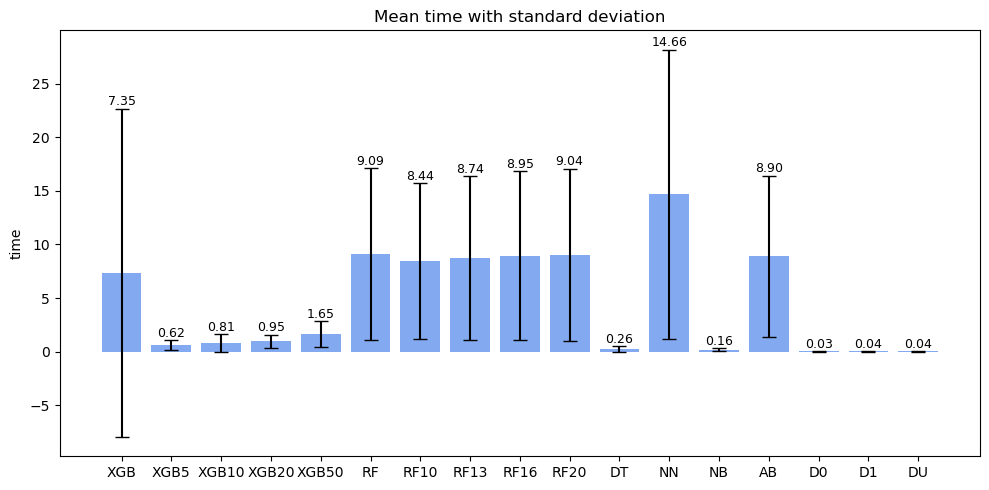

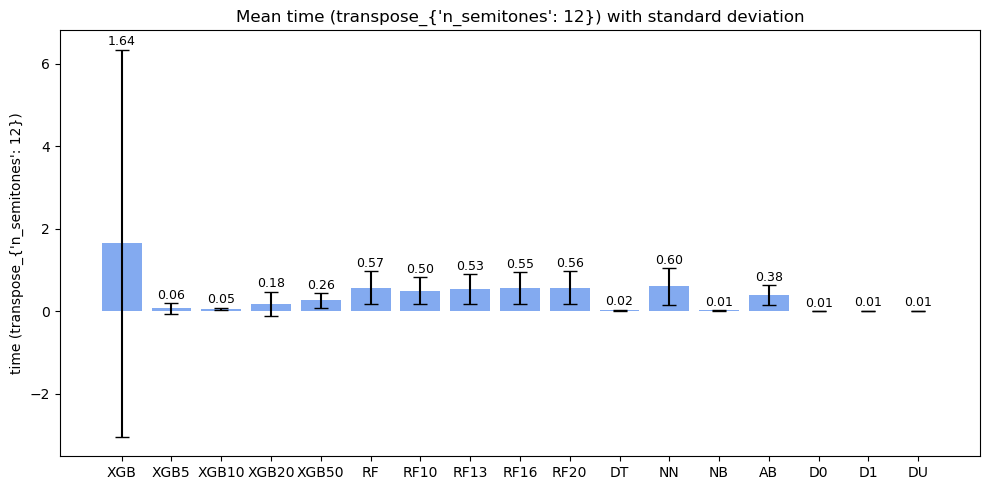

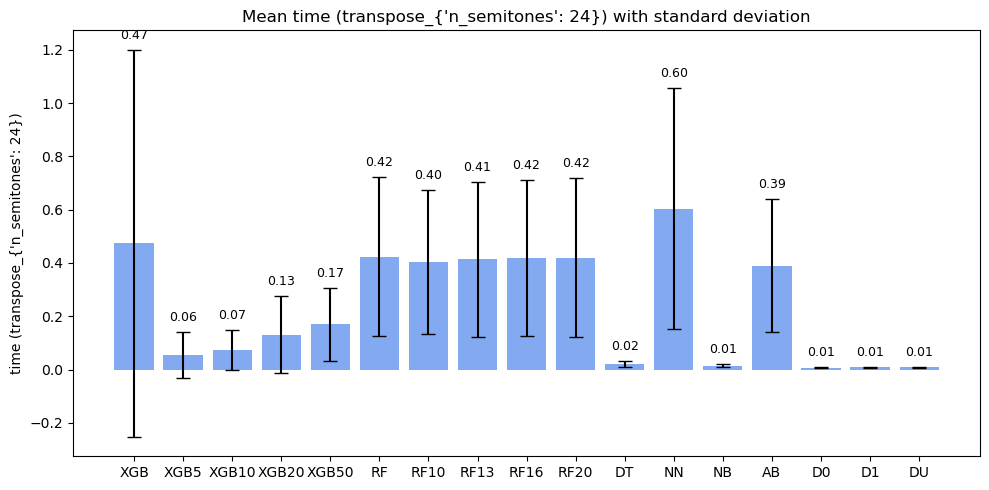

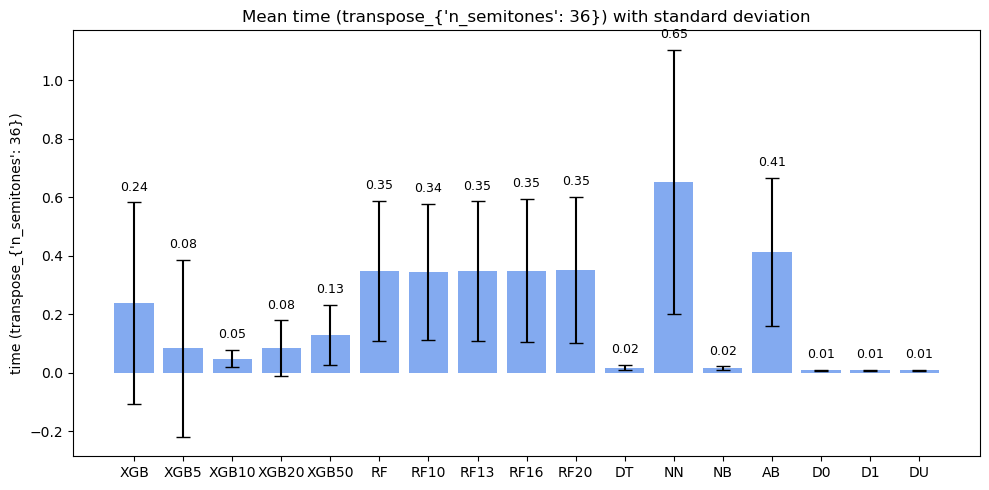

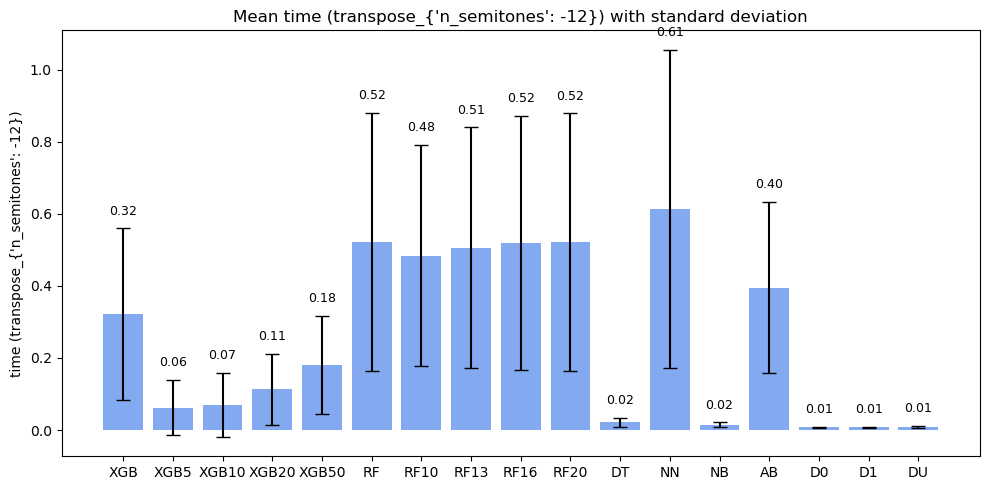

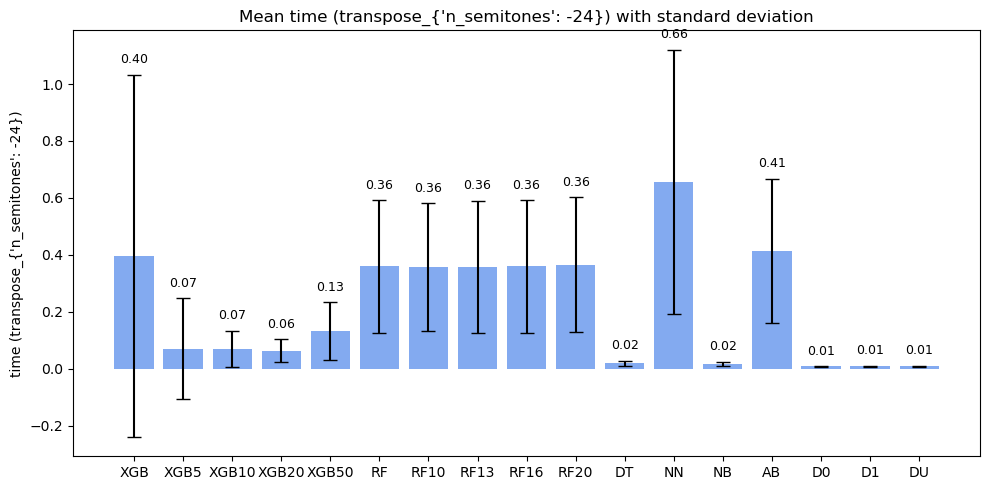

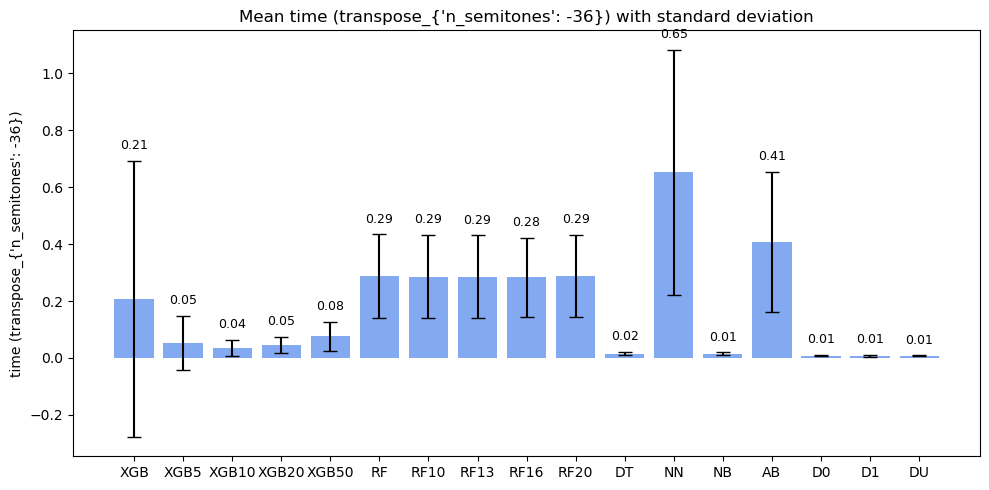

In [17]:
for mn in ml_metrics_names:
    if "time" in mn:
        # Plot
        plt.figure(figsize=(10, 5))
        barlist = plt.bar(model_names_short, metrics_mean[mn], yerr=metrics_std[mn], capsize=5, color='cornflowerblue', alpha=0.8)

        plt.ylabel(mn)
        plt.title(f'Mean {mn} with standard deviation')
        if not "time" in mn:
            plt.ylim(0, 1.1)

        # Optional: Add mean values above bars
        for i, (mean, std) in enumerate(zip(metrics_mean[mn], metrics_std[mn])):
            plt.text(i, mean + std + 0.03, f"{mean:.2f}", ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.show()

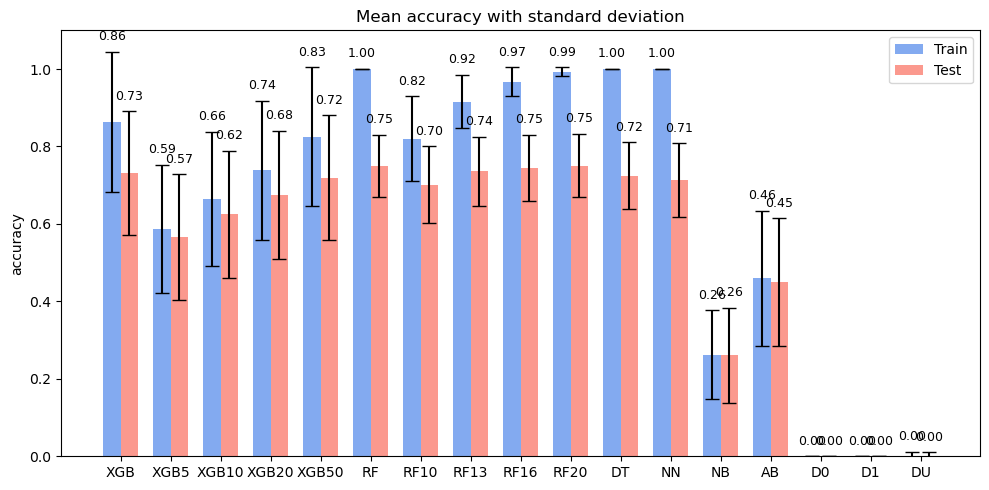

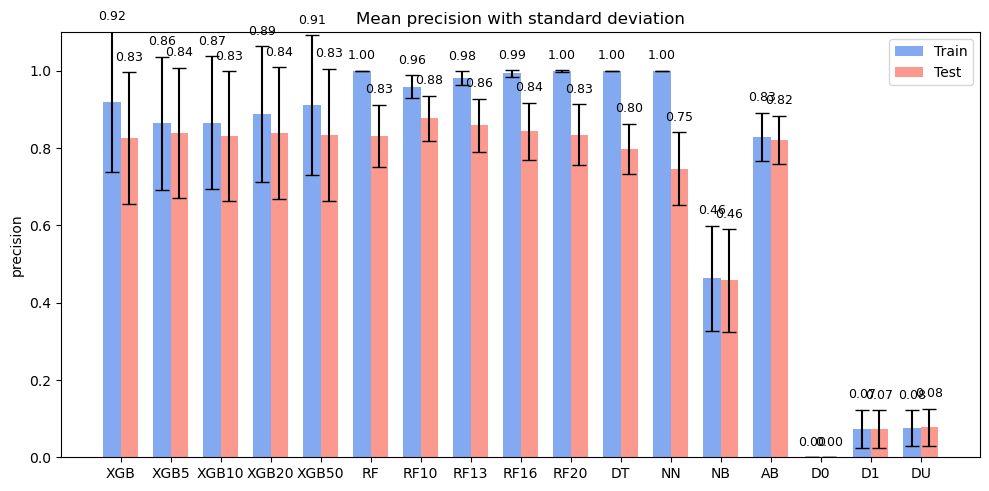

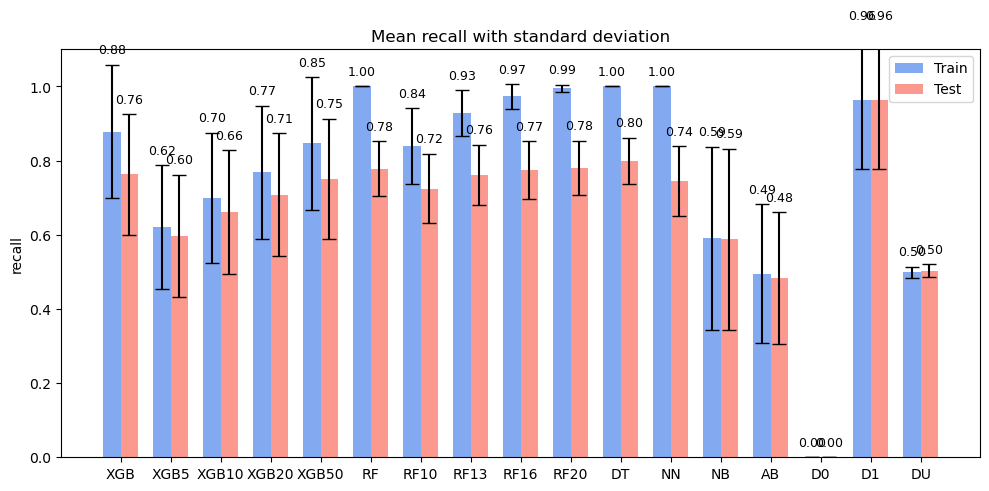

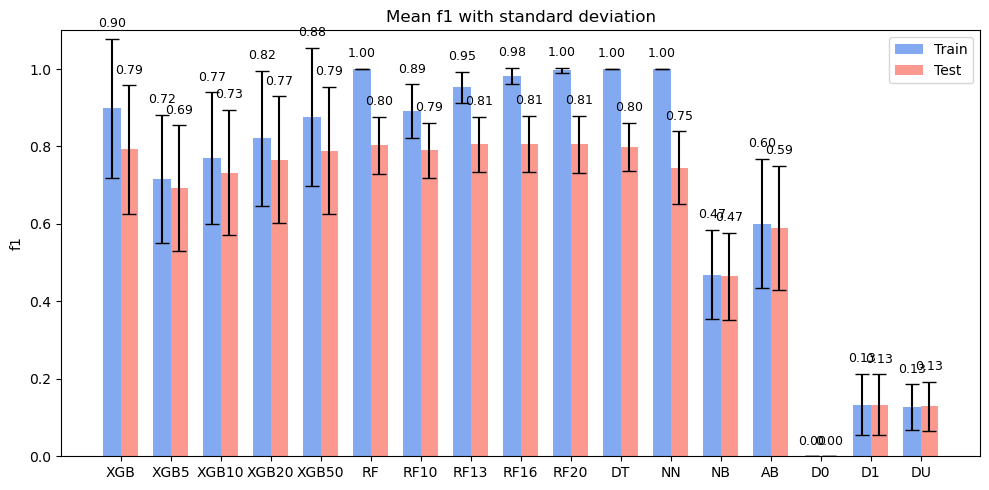

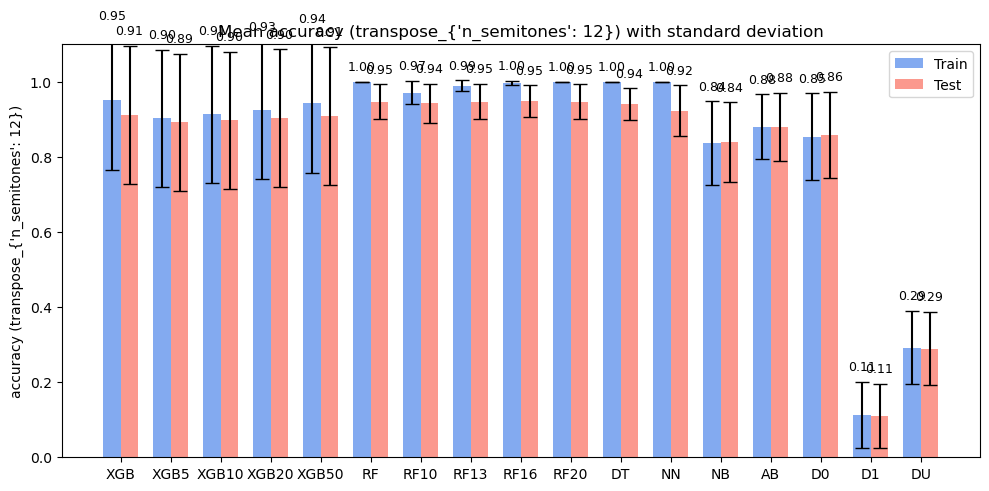

...

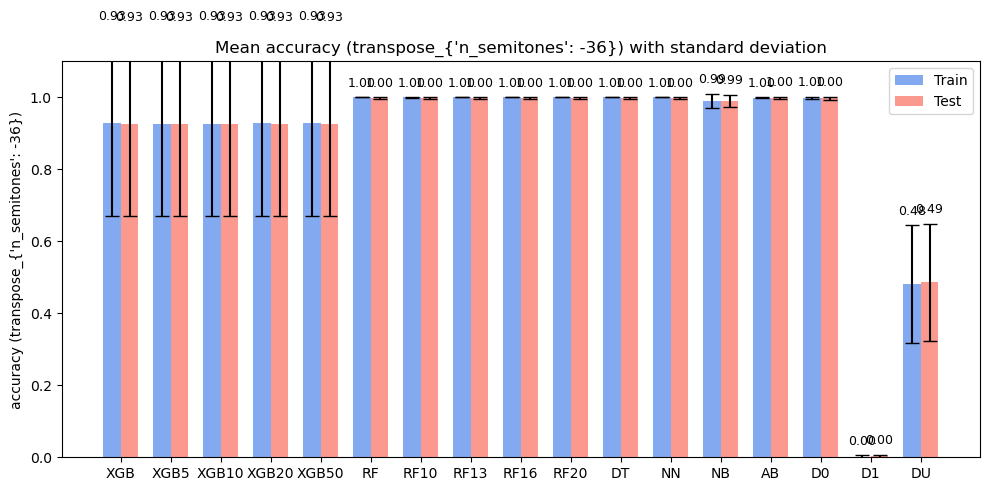

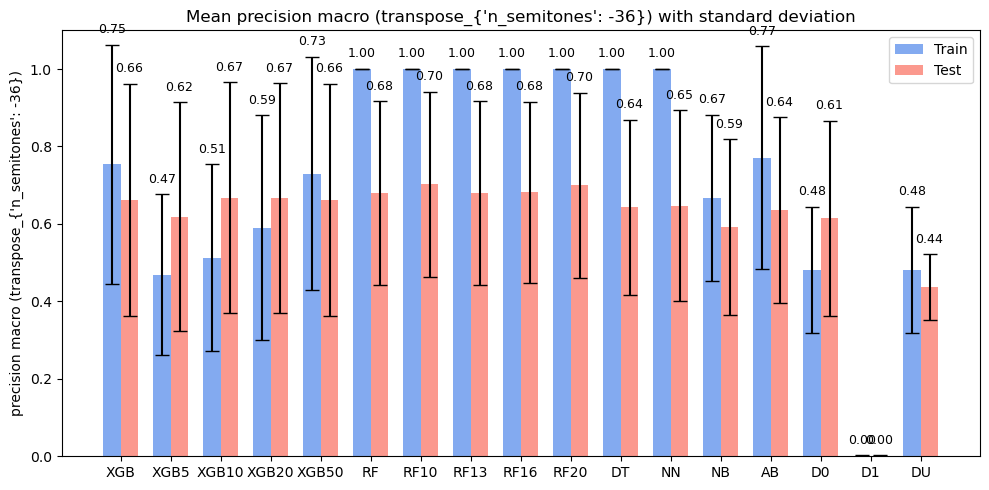

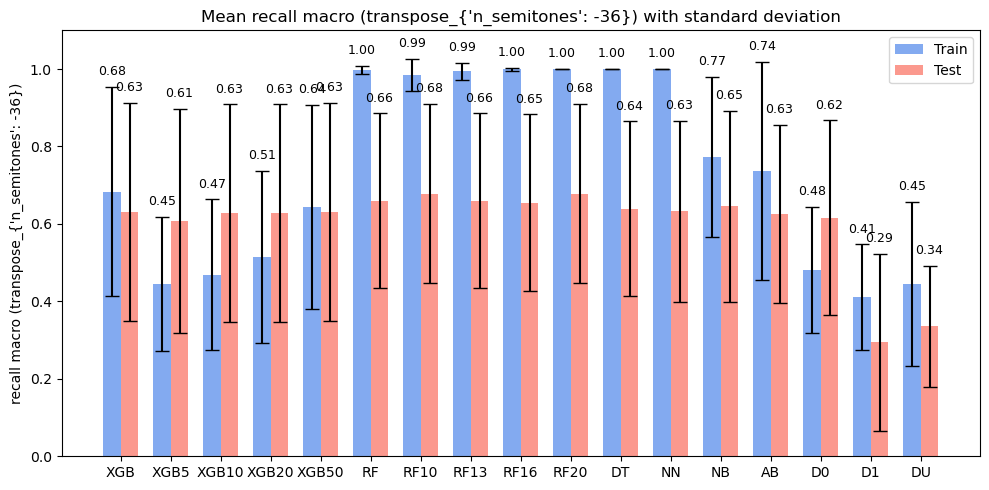

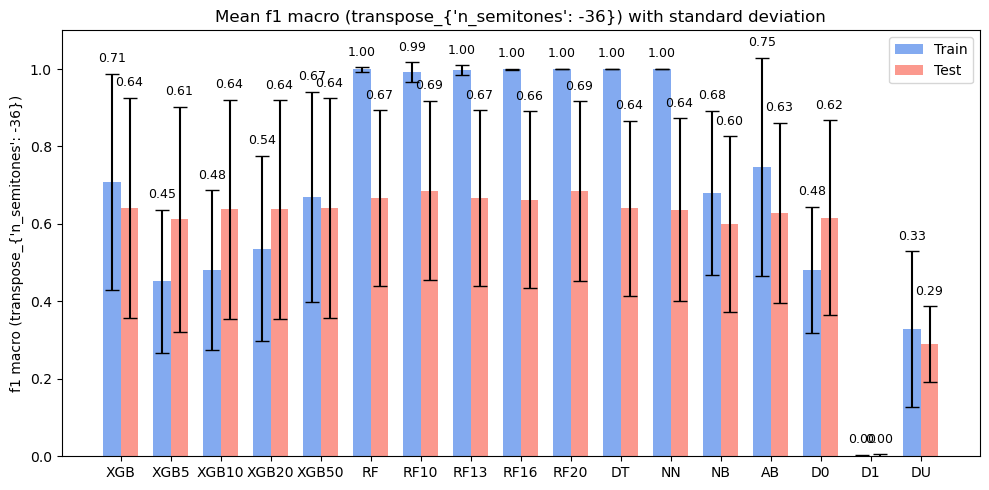

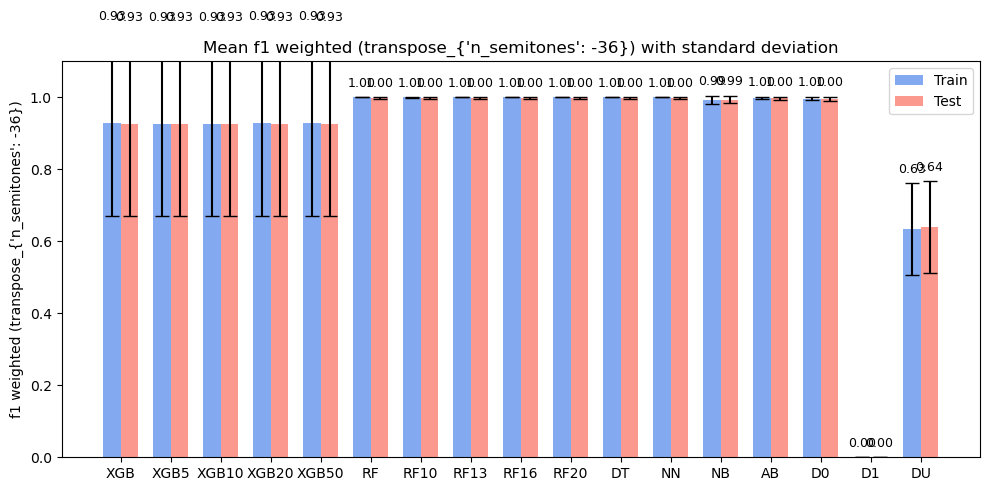

In [18]:
for mn in ml_metrics_names:
    if "train" in mn:
        mn_train = mn
        mn_test = mn.replace("train", "test")

        # Data for the two series
        train_means = metrics_mean[mn_train]
        test_means  = metrics_mean[mn_test]
        train_stds  = metrics_std[mn_train]
        test_stds   = metrics_std[mn_test]

        x = np.arange(len(model_names_short))   # positions
        width = 0.35

        plt.figure(figsize=(10, 5))

        # Two bar groups
        plt.bar(x - width/2, train_means, width,
                yerr=train_stds, capsize=5,
                label='Train', color='cornflowerblue', alpha=0.8)

        plt.bar(x + width/2, test_means, width,
                yerr=test_stds, capsize=5,
                label='Test', color='salmon', alpha=0.8)

        # Labels & layout
        plt.xticks(x, model_names_short)
        title = mn.replace(" (train)", "")
        plt.ylabel(title)
        plt.title(f'Mean {title} with standard deviation')

        if "time" not in mn:
            plt.ylim(0, 1.1)

        # Add mean value labels above bars
        for i, (mean, std) in enumerate(zip(train_means, train_stds)):
            plt.text(x[i] - width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        for i, (mean, std) in enumerate(zip(test_means, test_stds)):
            plt.text(x[i] + width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)
            
        plt.legend()
        plt.tight_layout()
        plt.show()

In [19]:
# Renitialize metrics collectors
s = (len(filenames),len(model_names))
ml_metrics = dict()
base_metrics_names = ["time",
                      "accuracy (train)",
                      "accuracy (test)",
                      "precision (train)",
                      "precision (test)",
                      "recall (train)",
                      "recall (test)",
                      "f1 (train)",
                      "f1 (test)",
                      ] #, "n_events", "n_classes"]
ml_metrics_names = base_metrics_names.copy()

for mn in ml_metrics_names:
    ml_metrics[mn] = np.zeros(s)

In [20]:
# Single-class, without transformations
error_collection = []
for i, filein in enumerate(filenames):    
    for u, (model_name, clf) in enumerate(zip(model_names, classifiers)):
        try: 
            metrics = amo_with_doublings_multiclass(filein,fileout=None,model=model_name, tol=0.2, transformations=None, multiclass=False, model_path=model_path)
            print(metrics)
            for mn in ml_metrics_names:
                # ml_metrics["accuracy"][i,u] = metrics["accuracy"]
                ml_metrics[mn][i,u] = metrics[mn]
        except Exception as e:
            print("Error")
            error_collection.append(f"Error with {filein} and model {model_name}: {e}")

print("\n????????? ERRORS ??????????")
for error in error_collection:
    print(error)


========= PREPROCESSING =========
[PREPROCESSING] Computing and caching results...
Mapping: [[1 'Piccolo' 1 73]
 [2 '2 Flauti' 1 73]
 [3 '2 Oboi' 2 68]
 [4 '2 Clarinetti in B' 3 71]
 [5 '2 Fagotti' 4 70]
 [6 'Corni in F I II' 5 60]
 [7 'Corni in F III IV' 5 60]
 [8 '2 Pistoni in B' 6 56]
 [9 '2 Trombe in F' 6 56]
 [10 '2 Tromboni' 7 57]
 [11 'Trombone 3' 7 57]
 [12 'Tuba' 8 58]
 [13 'Timpani' 10 47]
 [14 'Arpa' 0 46]
 [15 'Violine I' 11 45]
 [15 'Violine I' 11 48]
 [16 'Violine II' 12 48]
 [17 'Viola' 13 45]
 [17 'Viola' 13 48]
 [18 'Violoncelle' 14 48]
 [18 'Violoncelle' 14 45]
 [19 'Contrabasse' 15 48]
 [19 'Contrabasse' 15 45]]

Define covariates and target variable. Target variable encoding
Labels ['10_7' '11_7' '12_8' '13_10' '14_0' '15_11' '16_12' '17_13' '18_14'
 '19_15' '1_1' '2_1' '3_2' '4_3' '5_4' '6_5' '7_5' '8_6' '9_6']
Number of events in filein:  4320
Last onset at 226.08333333333334
y_train, test size: 0.2 , labels: ['10_7' '11_7' '12_8' '13_10' '14_0' '15_11' '16_12' '

In [21]:
metrics_mean = dict()
metrics_std = dict()
for mn in ml_metrics_names:
    metrics_mean[mn], metrics_std[mn] = return_m_std(ml_metrics[mn], mn)

time
[3.189125   0.24875718 0.45508175 0.54997813 1.23642664 1.27045552
 0.82593292 0.99979877 1.12080109 1.23562499 0.03499974 0.86077328
 0.02996574 0.57800284 0.00518803 0.00489744 0.005837  ]
[5.02125030e+00 4.57831391e-01 7.46771214e-01 6.86706410e-01
 1.36634331e+00 1.06142810e+00 6.00518178e-01 7.52338971e-01
 8.83031829e-01 1.01614394e+00 2.67539610e-02 6.65973354e-01
 2.17947437e-02 4.27086420e-01 9.19452949e-04 9.25414389e-04
 2.58909791e-03]
accuracy (train)
[0.90380051 0.76884983 0.79636603 0.83289211 0.88178176 0.96061005
 0.82301116 0.89463847 0.93685126 0.9566916  0.96062712 0.96054341
 0.51628382 0.33495949 0.05507783 0.05428826 0.06424475]
[0.08609019 0.10997624 0.10917964 0.1083087  0.09596945 0.07470129
 0.107141   0.08614987 0.07697303 0.07439944 0.07470549 0.07473844
 0.14377086 0.13636626 0.05952524 0.06033098 0.03871835]
accuracy (test)
[0.75086721 0.71903678 0.73365261 0.74852798 0.75651033 0.73028747
 0.72951096 0.74258088 0.73759899 0.73346372 0.72510237 0.666

In [22]:
output_dir = model_path + "results"
os.makedirs(output_dir, exist_ok=True)

# Combine into a DataFrame
rows = []
for metric in metrics_mean:
    means = metrics_mean[metric]
    stds = metrics_std[metric]
    
    for i, (m, s) in enumerate(zip(means, stds)):
        rows.append({
            "metric": metric,
            "index": i,
            "mean": m,
            "std": s
        })

df = pd.DataFrame(rows)

df.to_csv(os.path.join(output_dir, f"metrics (single label).csv"), index=False)

df = pd.DataFrame({
    "model_name": model_names,
    "model_name_short": model_names_short
})

df.to_csv(os.path.join(output_dir, "model_names (single label).csv"), index=False)

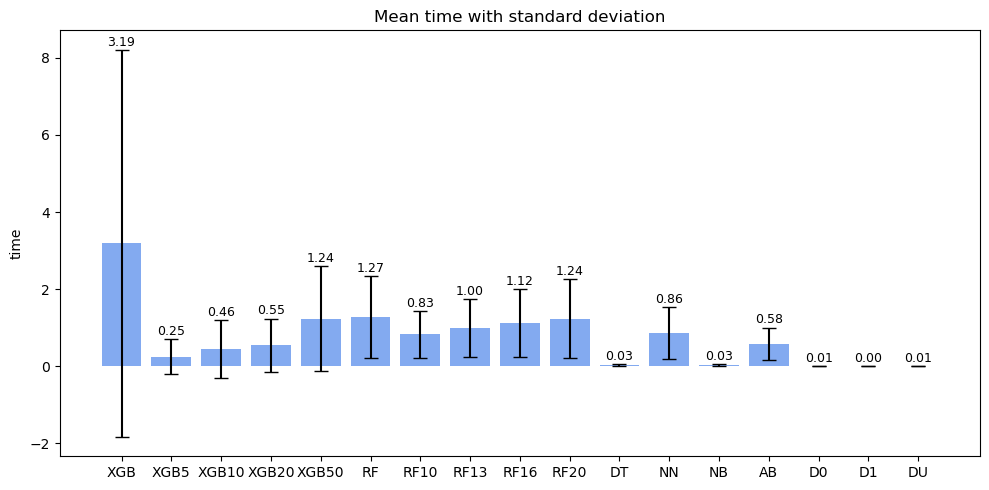

In [23]:
for mn in ml_metrics_names:
    if "time" in mn:
        # Plot
        plt.figure(figsize=(10, 5))
        barlist = plt.bar(model_names_short, metrics_mean[mn], yerr=metrics_std[mn], capsize=5, color='cornflowerblue', alpha=0.8)

        plt.ylabel(mn)
        plt.title(f'Mean {mn} with standard deviation')
        if not "time" in mn:
            plt.ylim(0, 1.1)

        # Optional: Add mean values above bars
        for i, (mean, std) in enumerate(zip(metrics_mean[mn], metrics_std[mn])):
            plt.text(i, mean + std + 0.03, f"{mean:.2f}", ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.show()

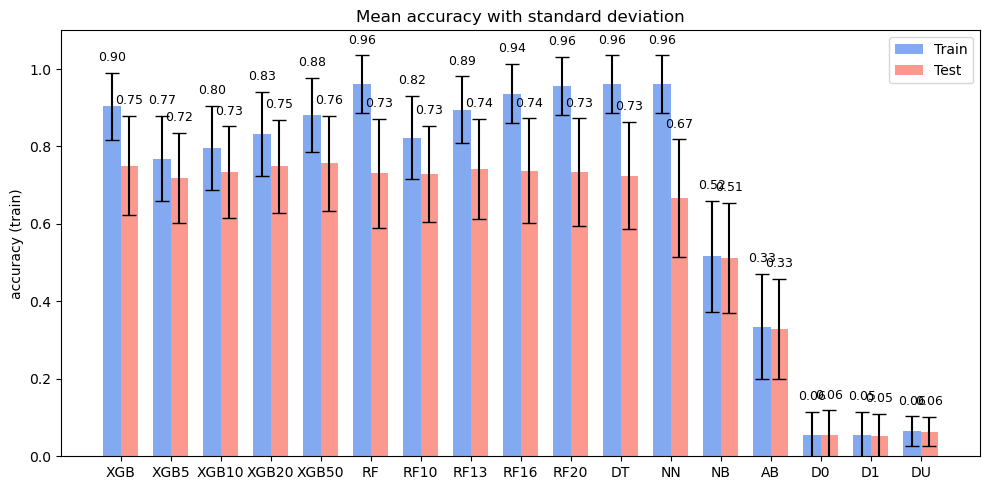

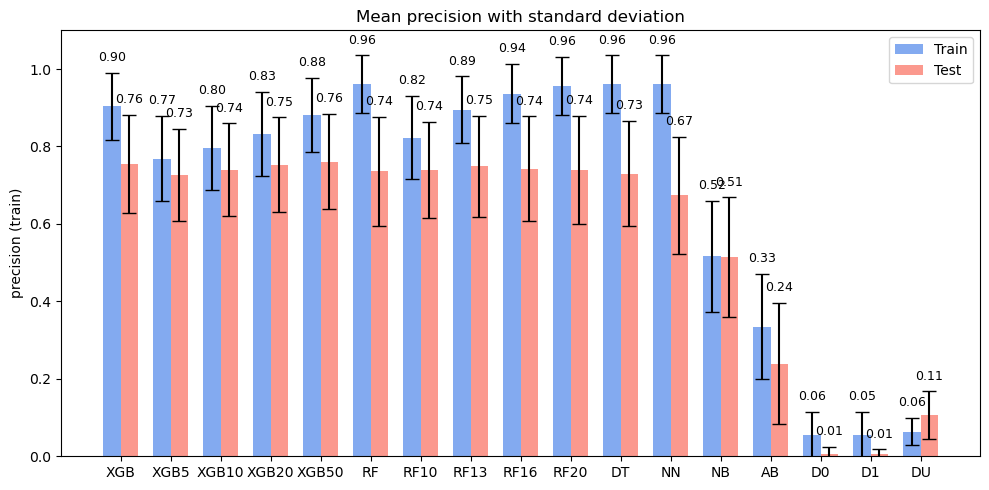

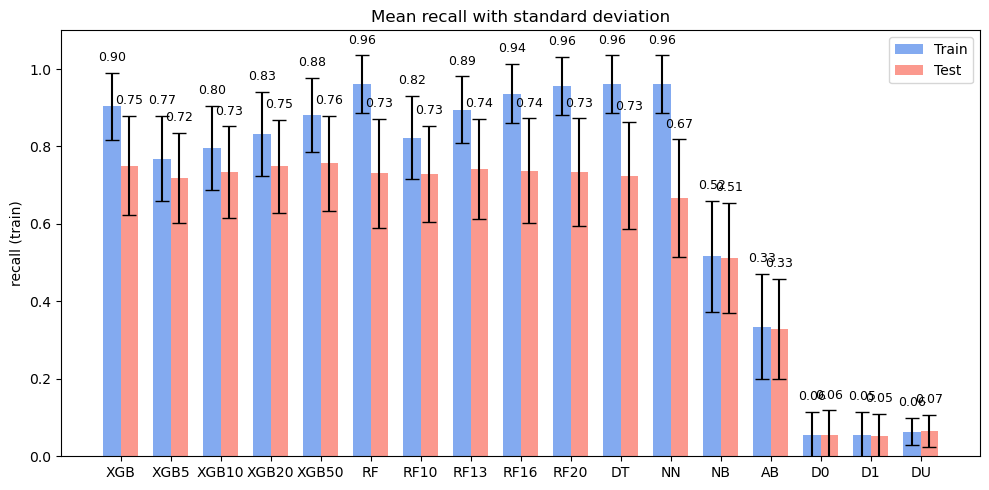

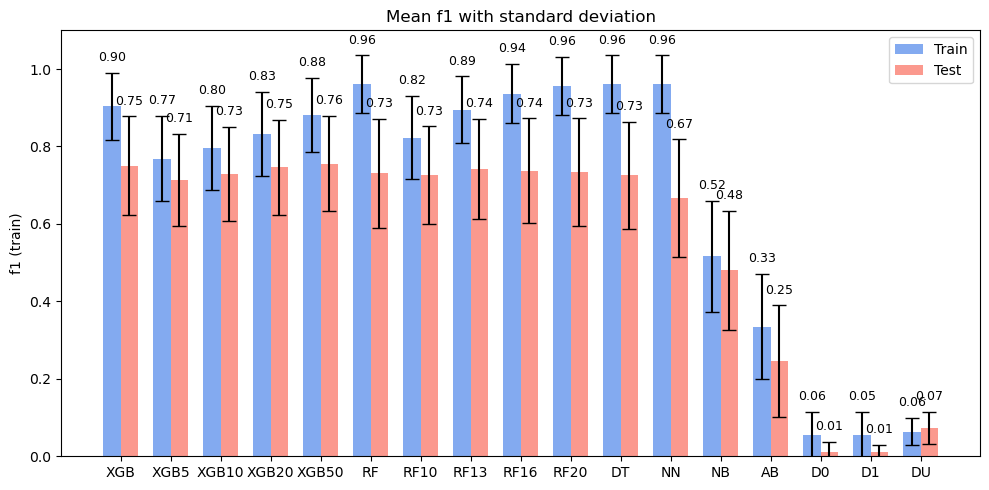

In [24]:
for mn in ml_metrics_names:
    if "train" in mn:
        mn_train = mn
        mn_test = mn.replace("train", "test")

        # Data for the two series
        train_means = metrics_mean[mn_train]
        test_means  = metrics_mean[mn_test]
        train_stds  = metrics_std[mn_train]
        test_stds   = metrics_std[mn_test]

        x = np.arange(len(model_names_short))   # positions
        width = 0.35

        plt.figure(figsize=(10, 5))

        # Two bar groups
        plt.bar(x - width/2, train_means, width,
                yerr=train_stds, capsize=5,
                label='Train', color='cornflowerblue', alpha=0.8)

        plt.bar(x + width/2, test_means, width,
                yerr=test_stds, capsize=5,
                label='Test', color='salmon', alpha=0.8)

        # Labels & layout
        plt.xticks(x, model_names_short)
        plt.ylabel(mn)
        plt.title(f'Mean {mn.replace(" (train)", "")} with standard deviation')

        if "time" not in mn:
            plt.ylim(0, 1.1)

        # Add mean value labels above bars
        for i, (mean, std) in enumerate(zip(train_means, train_stds)):
            plt.text(x[i] - width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        for i, (mean, std) in enumerate(zip(test_means, test_stds)):
            plt.text(x[i] + width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        plt.legend()
        plt.tight_layout()
        plt.show()